# **Processing the data**

In [ ]:
from google.colab import drive
import os

import pandas as pd
import re
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
drive.mount('/content/drive')

BASE_PATH = "/content/drive/MyDrive/Network_to_QoE"

COLUMNS_PATH = os.path.join(BASE_PATH, "column-names.txt")
DATA_PATH = os.path.join(BASE_PATH, "dataset.csv")

print("Columns file:", COLUMNS_PATH)
print("Data file:", DATA_PATH)


Mounted at /content/drive
Columns file: /content/drive/MyDrive/Network_to_QoE/column-names.txt
Data file: /content/drive/MyDrive/Network_to_QoE/dataset.csv


In [ ]:
def parse_column_names(path):
    names = []
    with open(path, "r", encoding="utf-8", errors="ignore") as f:
        for line in f:
            line = line.strip("\n")
            if line.startswith("|"):  # SQL-style ascii table
                parts = [x.strip() for x in line.split("|")]
                if len(parts) >= 2 and parts[1] not in ("Field", "Type", "Null", "Key", "Default", "Extra", ""):
                    names.append(parts[1])
            elif line and not line.startswith("+") and not line.startswith("-"):
                token = line.strip()
                if token and all(c.isalnum() or c in ("_",) for c in token):
                    names.append(token)
    seen, unique = set(), []
    for n in names:
        if n not in seen:
            unique.append(n)
            seen.add(n)
    return unique

col_names = parse_column_names(COLUMNS_PATH)
print(f"Found {len(col_names)} column names.")
print(col_names[:20])

Found 270 column names.
['videoID', 'category', 'bitrates_144p', 'bitrates_240p', 'bitrates_360p', 'bitrates_480p', 'bitrates_720p', 'bitrates_1080p', 'join_time', 'stallingNumber', 'totalStallDuration', 'outbandQoS_DL_TP', 'outbandQoS_UL_TP', 'outbandQoS_RTT', 'outbandQoS_RTT_STD', 'outbandQoS_LOSS', 'pcapStats_stats_avg_DL_TP', 'pcapStats_stats_avg_UL_t', 'pcapStats_stats_avg_DL_t', 'pcapStats_stats_avg_DL_pkt']


In [ ]:
df = pd.read_csv(DATA_PATH, header=None, names=col_names, low_memory=False)
print("Shape:", df.shape)
df.head(3)

Shape: (111919, 270)


,videoID,category,bitrates_144p,bitrates_240p,bitrates_360p,bitrates_480p,bitrates_720p,bitrates_1080p,join_time,stallingNumber,...,QoE_JT,QoE_noStall,QoE_noSwitches,QoE_Linear,QoE_Linear2,QoE_Linear3,QoE_LD_SD_HD,QoE_ITU_023,QoE_ITU_035,QoE_ITU_046
0,NeZ8BQBl8NA,Film & Animation,67101,63551,123054,205503,422644,824186,3411,0,...,1,0,0,5.0,5.0,5.0,2,5.0,4.44397,4.42413
1,FWpRqKpV0rY,Education,76305,111936,204952,340239,744420,1683577,2883,0,...,1,0,0,5.0,5.0,5.0,2,5.0,4.61882,4.58419
2,n72yt5hc3-A,Travel & Events,91757,123729,195255,303189,682584,1385367,4803,0,...,1,0,0,5.0,5.0,5.0,2,5.0,4.58990,4.55993


In [ ]:
df.describe()

,bitrates_144p,bitrates_240p,bitrates_360p,bitrates_480p,bitrates_720p,bitrates_1080p,join_time,stallingNumber,totalStallDuration,outbandQoS_DL_TP,...,QoE_JT,QoE_noStall,QoE_noSwitches,QoE_Linear,QoE_Linear2,QoE_Linear3,QoE_LD_SD_HD,QoE_ITU_023,QoE_ITU_035,QoE_ITU_046
count,111919.000000,111919.000000,1.119190e+05,1.119190e+05,1.119190e+05,1.119190e+05,111919.000000,111919.000000,1.119190e+05,111919.000000,...,111919.000000,111919.000000,111919.000000,111919.000000,111919.000000,111919.000000,111919.000000,111919.000000,111919.000000,111919.000000
mean,84332.577981,161488.427309,2.969415e+05,5.182005e+05,1.042117e+06,1.942902e+06,25931.106792,0.261645,8.438969e+02,2718.626028,...,0.933872,0.113600,0.678535,3.701106,3.580089,3.421945,1.118353,4.701973,3.508724,3.477920
std,20668.859700,56534.866093,1.052576e+05,1.989788e+05,4.036144e+05,7.196426e+05,75781.259241,1.021496,8.400910e+03,2214.803320,...,0.248507,0.317326,0.467041,1.442905,1.488462,1.536845,0.848809,1.103947,1.218091,1.224797
min,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,6.503000e+03,424.000000,0.000000,0.000000e+00,14.413600,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000
25%,80330.500000,123167.500000,2.260455e+05,3.745360e+05,7.558940e+05,1.466794e+06,2150.000000,0.000000,0.000000e+00,959.413500,...,1.000000,0.000000,0.000000,2.977380,2.711540,2.354365,0.000000,5.000000,2.888710,2.812640
50%,91811.000000,173440.000000,3.190800e+05,5.480470e+05,1.104771e+06,2.096539e+06,3627.000000,0.000000,0.000000e+00,2160.470000,...,1.000000,0.000000,1.000000,4.221490,4.086810,3.929890,1.000000,5.000000,3.816160,3.833200
75%,96949.000000,208920.500000,3.848440e+05,6.891835e+05,1.388100e+06,2.536442e+06,9592.000000,0.000000,0.000000e+00,3958.370000,...,1.000000,0.000000,1.000000,4.897620,4.854170,4.784930,2.000000,5.000000,4.440985,4.423630
max,224840.000000,912737.000000,1.737032e+06,2.469066e+06,6.597562e+06,1.617896e+07,310000.000000,55.000000,1.149329e+06,10000.900000,...,1.000000,1.000000,1.000000,5.000000,5.000000,5.000000,2.000000,5.000000,5.000000,4.922150


In [ ]:
# F_outband: 5 features configured on the network emulator
F_outband = [c for c in col_names if c.startswith('outbandQoS_')]

# F_inband: 48 statistical features derived from encrypted traffic
F_inband = [c for c in col_names if c.startswith('pcapStats_stats_')]

# F_chunks: 7 statistical features of the inferred chunk sizes
F_chunks = [
    c for c in col_names
    if c.startswith('chunkSizesPcap_')
    and not c.startswith('chunkSizesPcapVideo_')
    and not c.startswith('chunkSizesPcapAudio_')
]

print(f"F_outband count: {len(F_outband)} (Expected: 5)")
print(f"F_inband count:  {len(F_inband)} (Expected: 48)")
print(f"F_chunks count:  {len(F_chunks)} (Expected: 7)")

F_outband count: 5 (Expected: 5)
F_inband count:  48 (Expected: 48)
F_chunks count:  7 (Expected: 7)


In [ ]:
# Create combined feature lists for training
X_columns_best = F_inband + F_chunks

print("\nSample check:")
print("Outband:", F_outband)
print("Chunks:", F_chunks)
print("Inband:", F_inband)
print("Combined:", X_columns_best)


Sample check:
Outband: ['outbandQoS_DL_TP', 'outbandQoS_UL_TP', 'outbandQoS_RTT', 'outbandQoS_RTT_STD', 'outbandQoS_LOSS']
Chunks: ['chunkSizesPcap_avg', 'chunkSizesPcap_std', 'chunkSizesPcap_min', 'chunkSizesPcap_max', 'chunkSizesPcap_p25', 'chunkSizesPcap_p50', 'chunkSizesPcap_p75']
Inband: ['pcapStats_stats_avg_DL_TP', 'pcapStats_stats_avg_UL_t', 'pcapStats_stats_avg_DL_t', 'pcapStats_stats_avg_DL_pkt', 'pcapStats_stats_max_DL_TP', 'pcapStats_stats_max_UL_t', 'pcapStats_stats_max_DL_t', 'pcapStats_stats_max_DL_pkt', 'pcapStats_stats_std_DL_TP', 'pcapStats_stats_std_UL_t', 'pcapStats_stats_std_DL_t', 'pcapStats_stats_std_DL_pkt', 'pcapStats_stats_p10_DL_TP', 'pcapStats_stats_p10_UL_t', 'pcapStats_stats_p10_DL_t', 'pcapStats_stats_p10_DL_pkt', 'pcapStats_stats_p20_DL_TP', 'pcapStats_stats_p20_UL_t', 'pcapStats_stats_p20_DL_t', 'pcapStats_stats_p20_DL_pkt', 'pcapStats_stats_p30_DL_TP', 'pcapStats_stats_p30_UL_t', 'pcapStats_stats_p30_DL_t', 'pcapStats_stats_p30_DL_pkt', 'pcapStats_sta

In [ ]:
TARGET_MOS_046 = 'QoE_ITU_046'       # The main QoE Score (1-5). Regression
TARGET_MOS_023 = 'QoE_ITU_023'
TARGET_MOS_035 = 'QoE_ITU_035'

TARGET_STARTUP = 'join_time'         # Startup Delay. >30 or not? will be used for Classification problem. Regression for predicting the duration problem

TARGET_STALLS_COUNT = 'stallingNumber' # Number of Stalls
TARGET_STALL_DURATION = 'totalStallDuration'    #Classification
TARGET_SWITCHES = 'totalSwitches'               #Classification

TARGET_AVG_RESOLUTION = 'avgResQual' #Regression

In [ ]:
TARGETS = [TARGET_MOS_046, TARGET_MOS_023, TARGET_MOS_035, TARGET_STARTUP, TARGET_SWITCHES, TARGET_STALLS_COUNT, TARGET_STALL_DURATION, TARGET_AVG_RESOLUTION]

In [ ]:
ALL_FEATURES = F_outband + F_inband + F_chunks

# **Data Exploration**

## Outband

<Axes: >

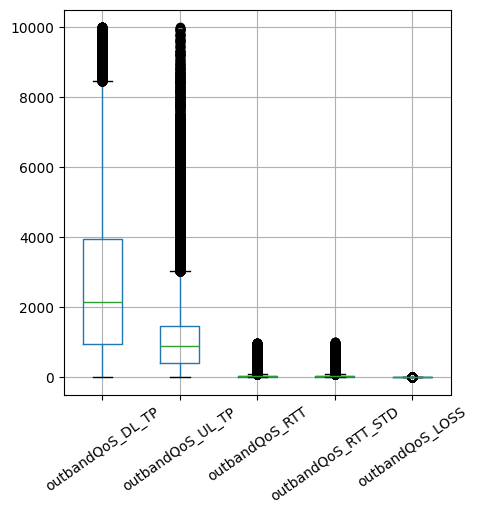

In [ ]:
#Box Plot
df.boxplot(column=F_outband, rot=35, figsize=(5,5))

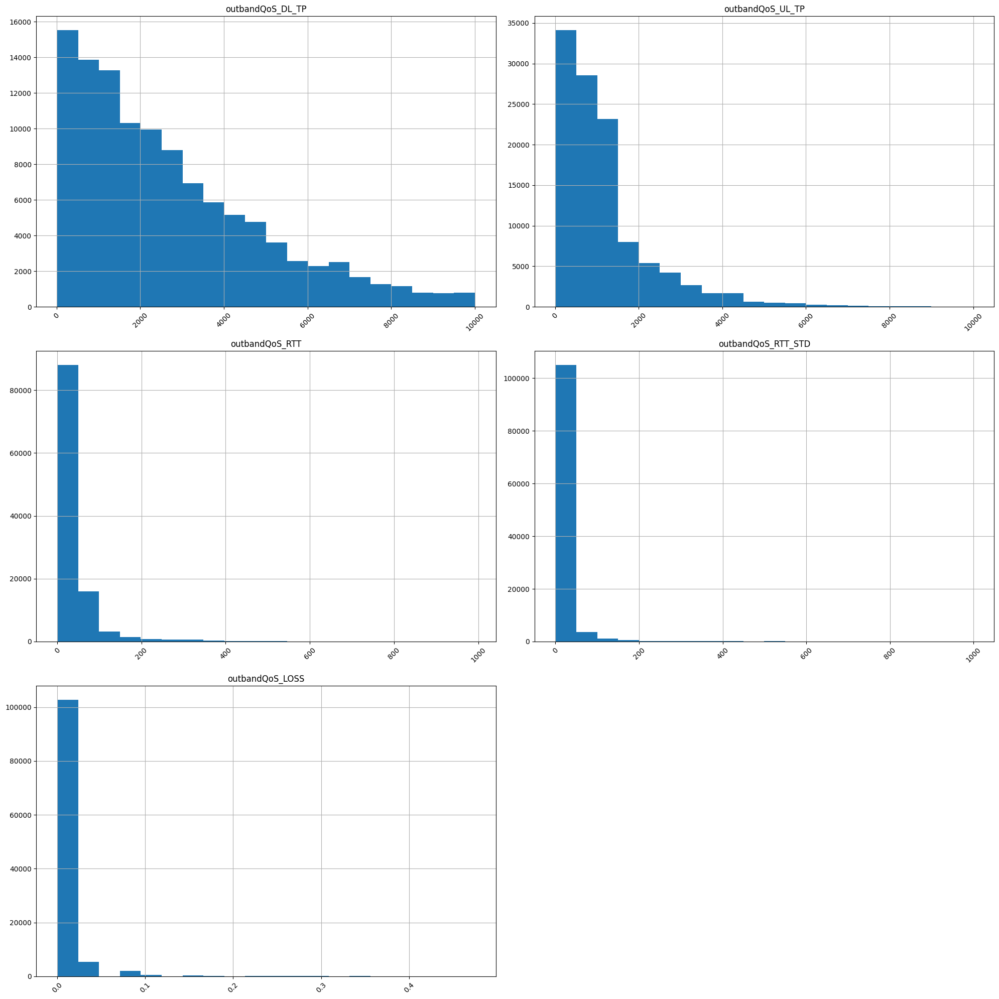

In [ ]:
#Histogram
df[F_outband].hist(figsize=(20, 20), bins=20, xrot=45)

plt.tight_layout()
plt.show()

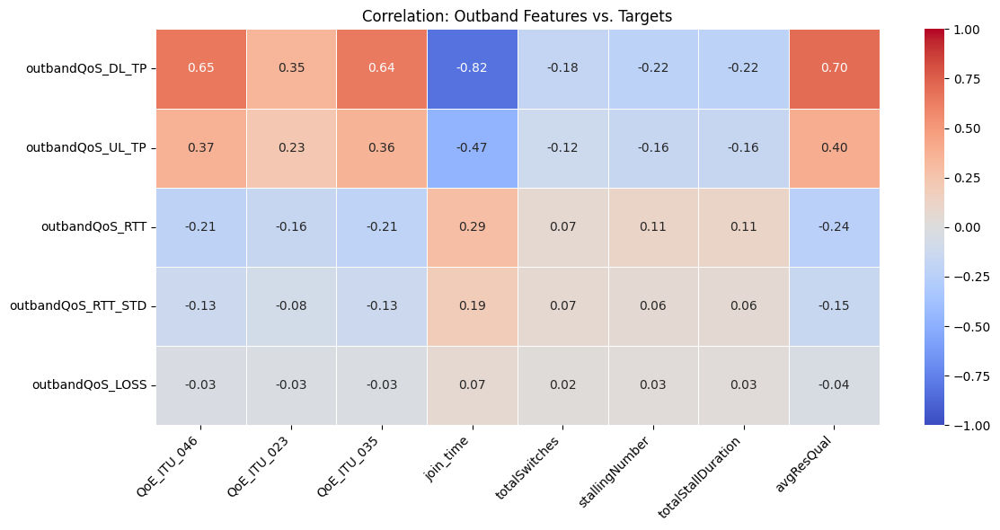

In [ ]:
#Covariance
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = df[F_outband + TARGETS].corr(method='spearman')

focused_corr = corr_matrix.loc[F_outband, TARGETS]

plt.figure(figsize=(12, 6))
sns.heatmap(
    focused_corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5,
    vmin=-1, vmax=1

plt.title("Correlation: Outband Features vs. Targets")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

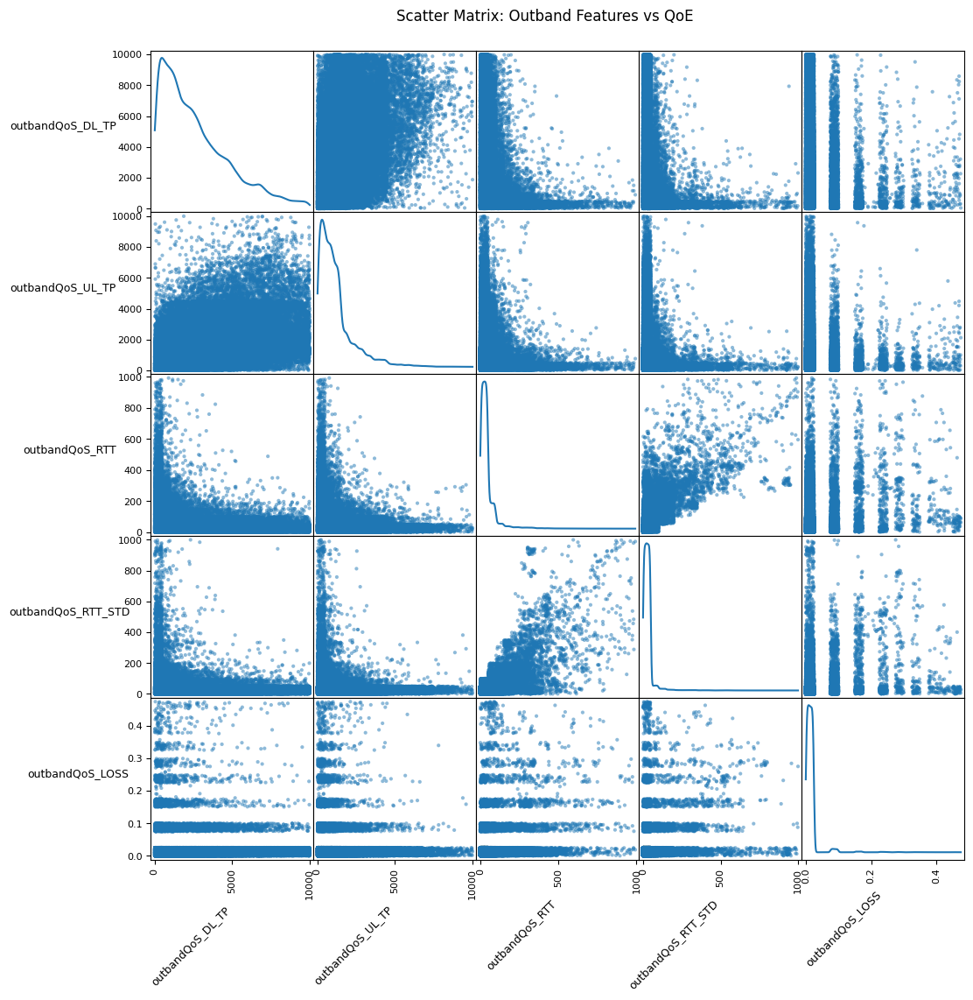

In [ ]:
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt

sm = scatter_matrix(df[F_outband], figsize=(12, 12), diagonal='kde')

for ax in sm.ravel():
    ax.set_xlabel(ax.get_xlabel(), fontsize=9, rotation=45, ha='right')
    ax.set_ylabel(ax.get_ylabel(), fontsize=9, rotation=0, labelpad=40)

plt.suptitle("Scatter Matrix: Outband Feature", y=0.92)
plt.show()

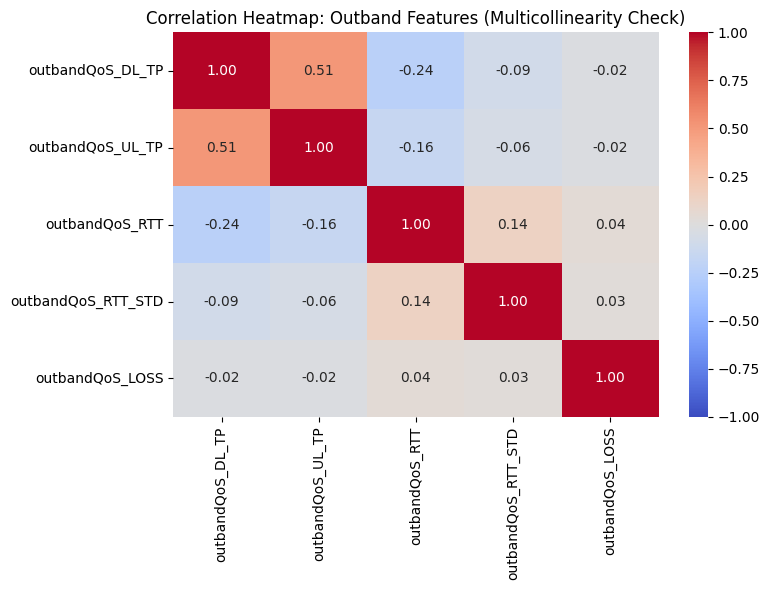

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = df[F_outband].corr(method='spearman')

plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1, vmax=1
)

plt.title("Correlation Heatmap: Outband Features (Multicollinearity Check)")
plt.tight_layout()
plt.show()

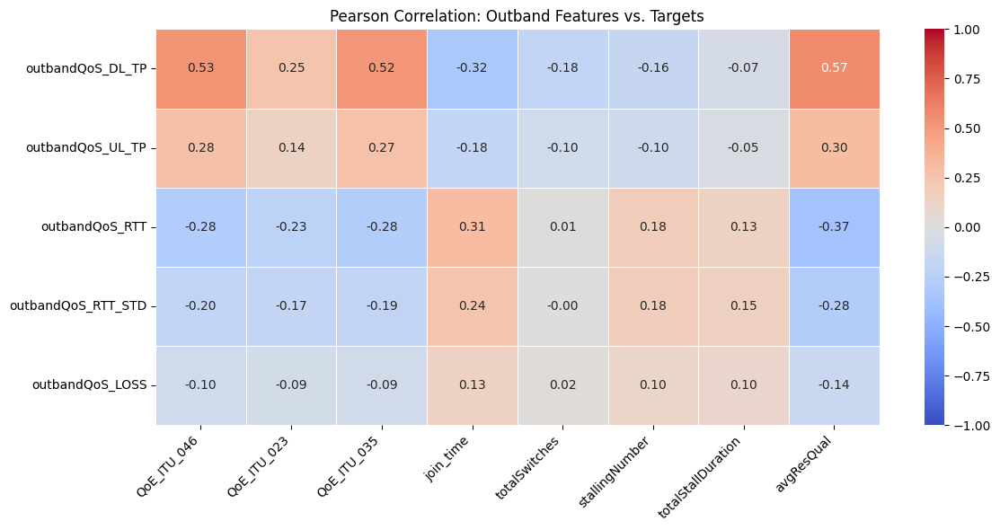

In [ ]:
#Pearson correlation coefficient
corr_matrix_pearson = df[F_outband + TARGETS].corr(method='pearson')

focused_pearson = corr_matrix_pearson.loc[F_outband, TARGETS]

plt.figure(figsize=(12, 6))
sns.heatmap(
    focused_pearson,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5,
    vmin=-1, vmax=1
)

plt.title("Pearson Correlation: Outband Features vs. Targets")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## Inband

<Axes: >

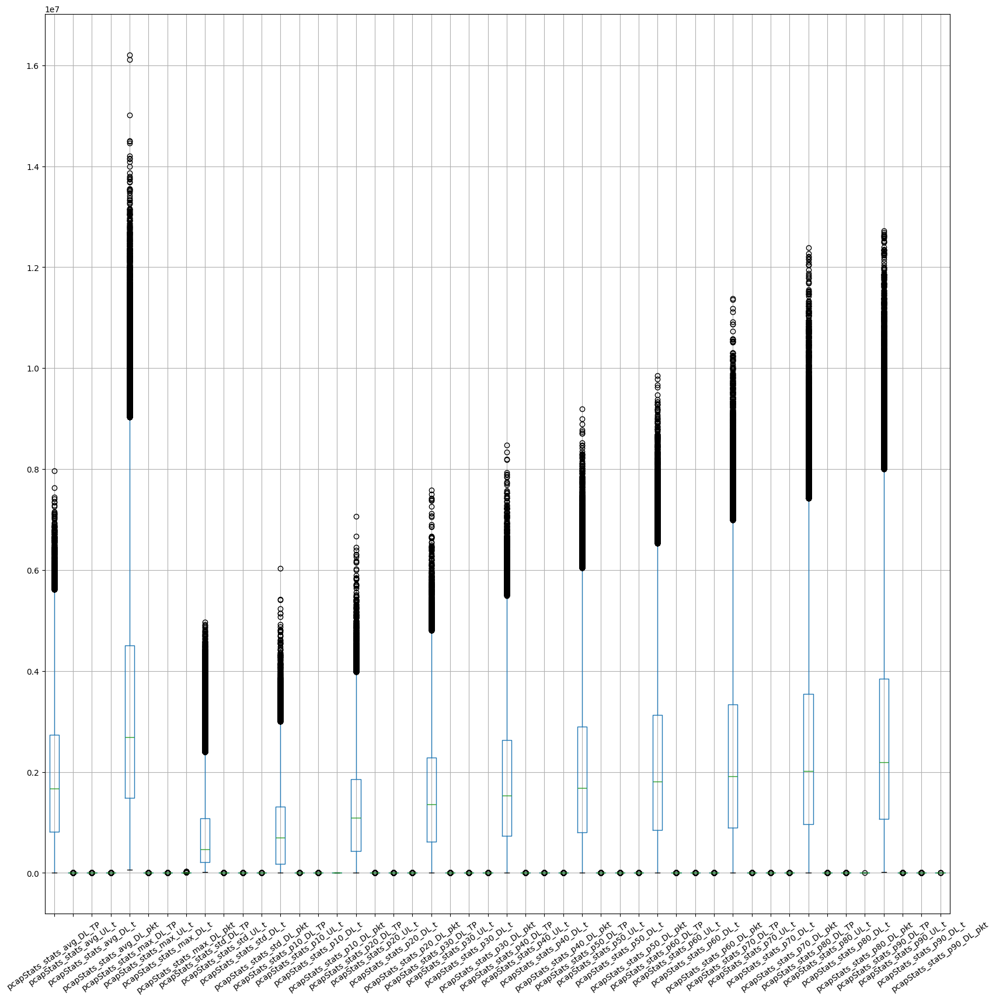

In [ ]:
#Box Plot
df.boxplot(column=F_inband, rot=35, figsize=(20,20))

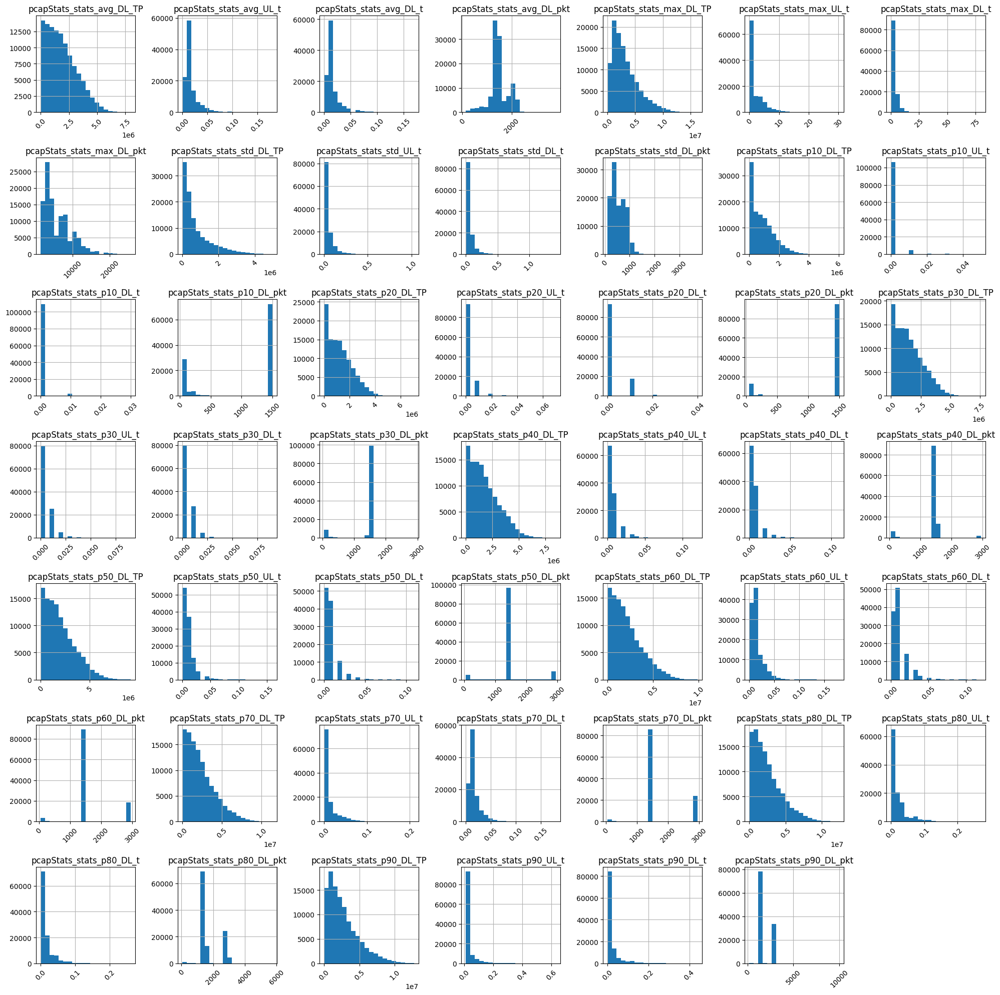

In [ ]:
#Histogram
df[F_inband].hist(figsize=(20, 20), bins=20, xrot=45)

plt.tight_layout()
plt.show()

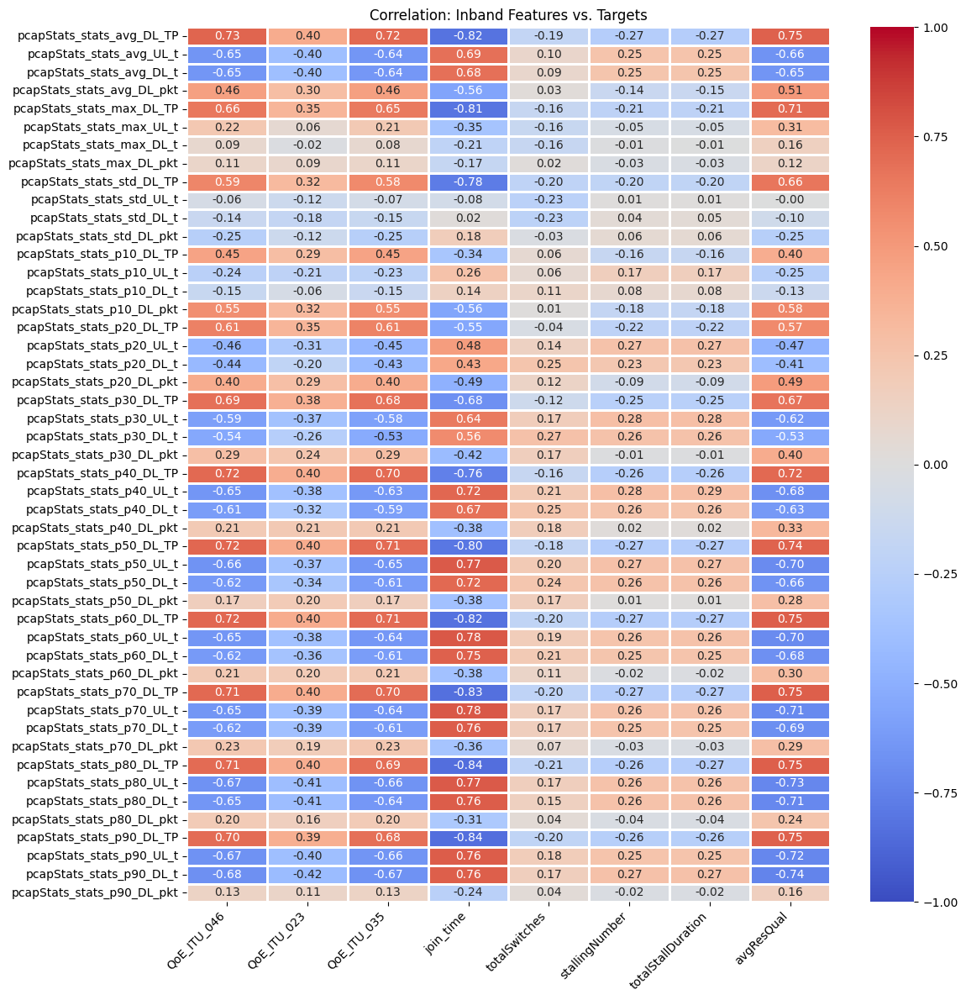

In [ ]:
#Covariance
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = df[F_inband + TARGETS].corr(method='spearman')

focused_corr = corr_matrix.loc[F_inband, TARGETS]

plt.figure(figsize=(12, 12))
sns.heatmap(
    focused_corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=2,
    vmin=-1, vmax=1
)

plt.title("Correlation: Inband Features vs. Targets")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()

In [ ]:
## TAKES TOO MUCH RAM

# from pandas.plotting import scatter_matrix
# import matplotlib.pyplot as plt

# sm = scatter_matrix(df[F_inband], figsize=(12, 12), diagonal='kde')

# for ax in sm.ravel():
#     ax.set_xlabel(ax.get_xlabel(), fontsize=9, rotation=45, ha='right')
#     ax.set_ylabel(ax.get_ylabel(), fontsize=9, rotation=0, labelpad=40)

# plt.suptitle("Scatter Matrix: Inband Feature", y=0.92)
# plt.show()

KeyboardInterrupt: 

Error in callback <function _draw_all_if_interactive at 0x7f3ef1fafce0> (for post_execute):


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f3ef1fae0c0> (for post_execute):


KeyboardInterrupt: 

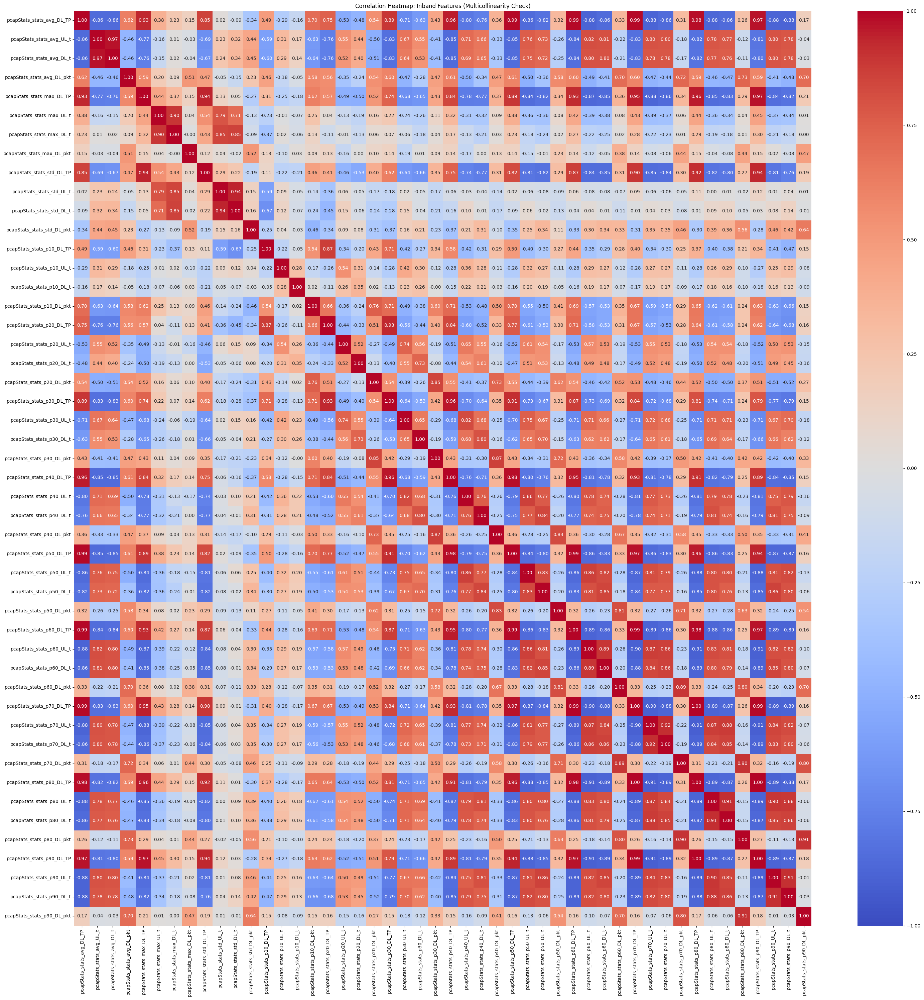

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = df[F_inband].corr(method='spearman')

plt.figure(figsize=(30, 30))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1, vmax=1
)

plt.title("Correlation Heatmap: Inband Features (Multicollinearity Check)")
plt.tight_layout()
plt.show()

--- Top Highly Correlated Pairs (Multicollinearity) ---
pcapStats_stats_p90_DL_TP  pcapStats_stats_p80_DL_TP    0.992261
pcapStats_stats_p70_DL_TP  pcapStats_stats_p80_DL_TP    0.991635
pcapStats_stats_p60_DL_TP  pcapStats_stats_p70_DL_TP    0.988800
                           pcapStats_stats_avg_DL_TP    0.984872
pcapStats_stats_p50_DL_TP  pcapStats_stats_p60_DL_TP    0.983666
pcapStats_stats_avg_DL_TP  pcapStats_stats_p50_DL_TP    0.980495
pcapStats_stats_avg_UL_t   pcapStats_stats_avg_DL_t     0.980180
pcapStats_stats_p70_DL_TP  pcapStats_stats_p90_DL_TP    0.976915
pcapStats_stats_avg_DL_TP  pcapStats_stats_p70_DL_TP    0.976501
pcapStats_stats_p50_DL_TP  pcapStats_stats_p40_DL_TP    0.974449
pcapStats_stats_p90_DL_TP  pcapStats_stats_max_DL_TP    0.972408
pcapStats_stats_p80_DL_TP  pcapStats_stats_p60_DL_TP    0.970191
                           pcapStats_stats_avg_DL_TP    0.961907
pcapStats_stats_max_UL_t   pcapStats_stats_max_DL_t     0.959889
pcapStats_stats_p90_DL_t   pcapSta

<Figure size 1200x1000 with 0 Axes>

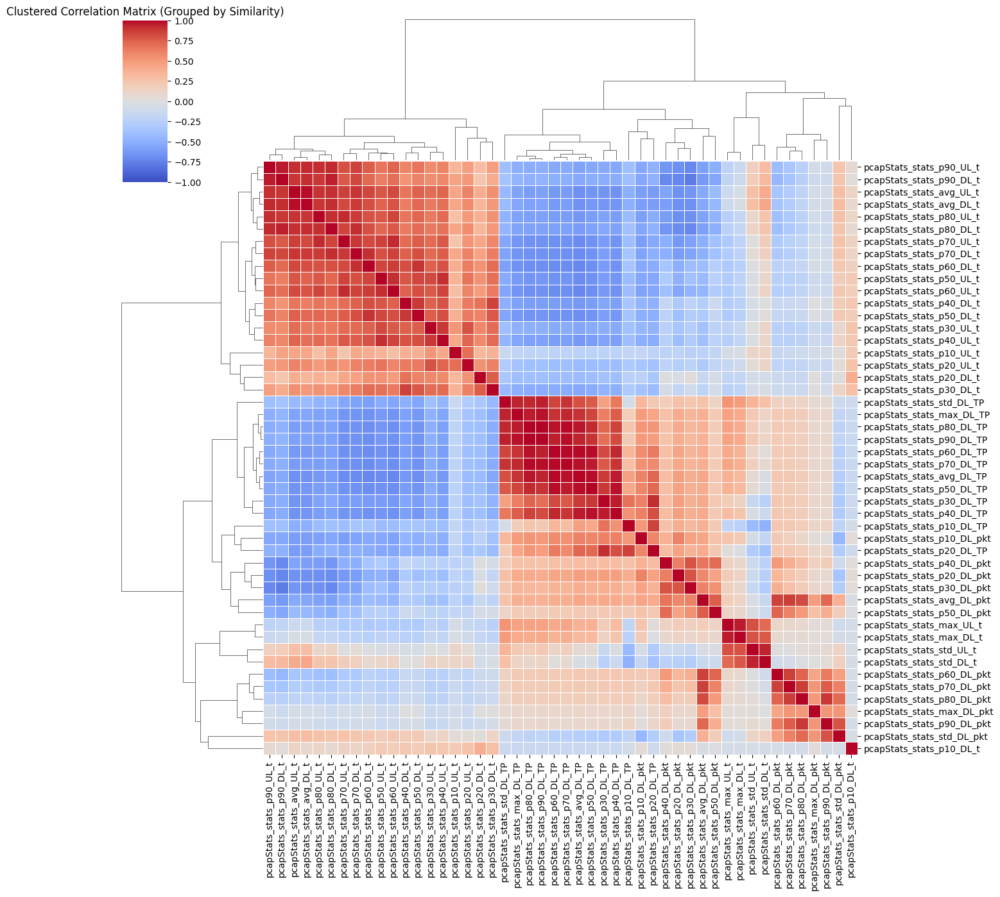

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# 1. Calculate Correlation Matrix
corr_matrix = df[F_inband].corr()

# --- PART A: LIST THE PROBLEM PAIRS ---
# Unstack the matrix to get pairs
corr_pairs = corr_matrix.unstack()
sorted_pairs = corr_pairs.sort_values(kind="quicksort", ascending=False)

# Filter: Remove self-correlation (1.0) and duplicates
strong_pairs = sorted_pairs[sorted_pairs < 1.0] # Remove self (diagonal)
strong_pairs = strong_pairs[abs(strong_pairs) > 0.9] # Only keep > 0.9 or < -0.9

# Remove duplicates (A-B is same as B-A)
unique_pairs = strong_pairs.iloc[::2]

print("--- Top Highly Correlated Pairs (Multicollinearity) ---")
print(unique_pairs.head(20)) # Show top 20 worst offenders


# --- PART B: THE CLUSTERED HEATMAP (Easier to read) ---
# This reorders the rows/cols to put similar features next to each other
plt.figure(figsize=(12, 10))

# 'clustermap' automatically groups correlated features
g = sns.clustermap(
    corr_matrix,
    cmap='coolwarm',
    center=0,
    vmin=-1, vmax=1,
    linewidths=0.5,
    figsize=(14, 14),
    annot=False # Turn off numbers (too messy)
)

plt.title("Clustered Correlation Matrix (Grouped by Similarity)")
plt.show()

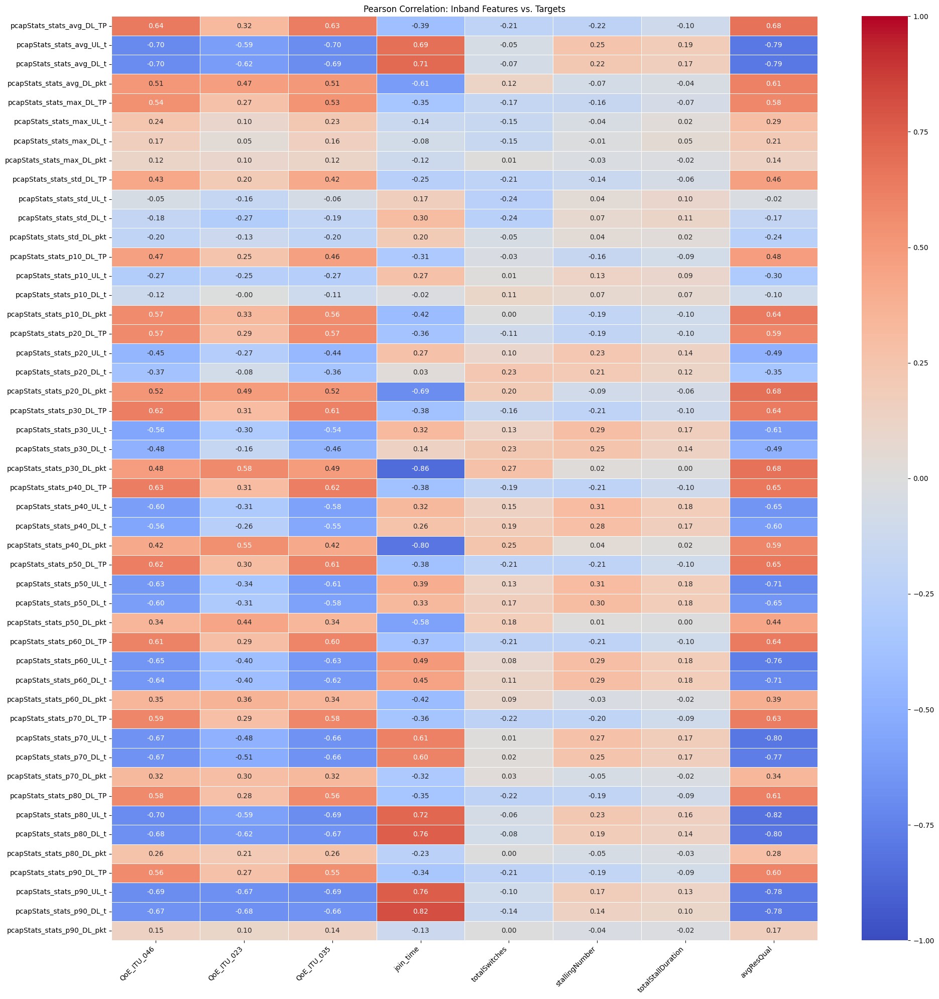

In [ ]:
#Pearson correlation coefficient
corr_matrix_pearson = df[F_inband + TARGETS].corr(method='pearson')

focused_pearson = corr_matrix_pearson.loc[F_inband, TARGETS]

plt.figure(figsize=(20, 20))
sns.heatmap(
    focused_pearson,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5,
    vmin=-1, vmax=1
)

plt.title("Pearson Correlation: Inband Features vs. Targets")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## Chunks

<Axes: >

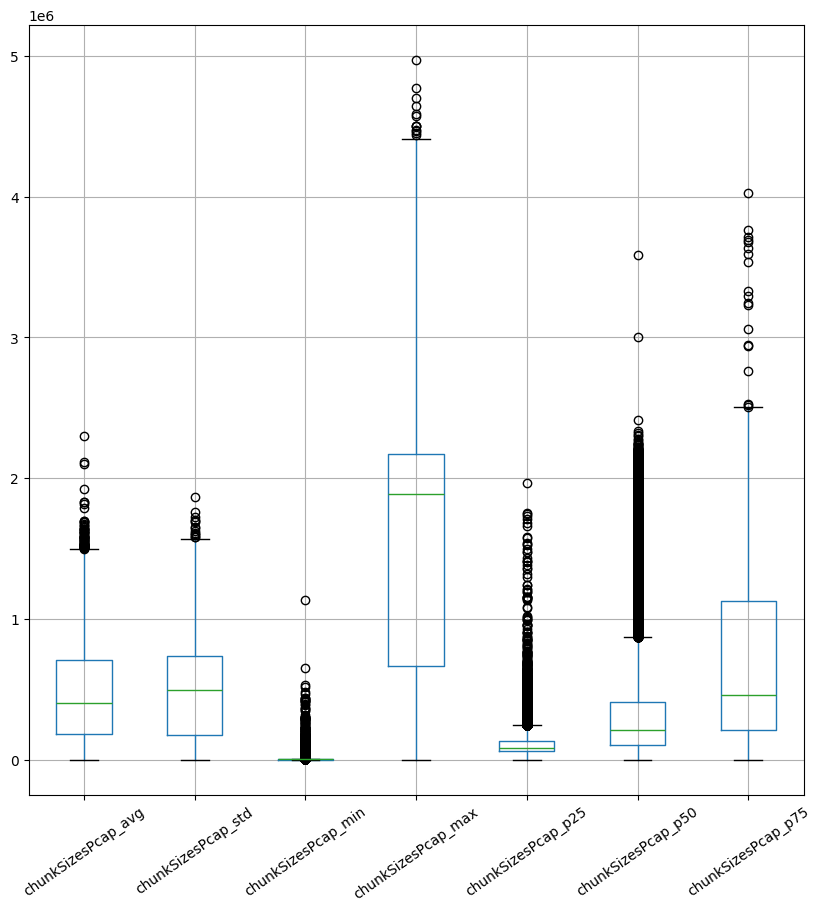

In [ ]:
#Box Plot
df.boxplot(column=F_chunks, rot=35, figsize=(10,10))

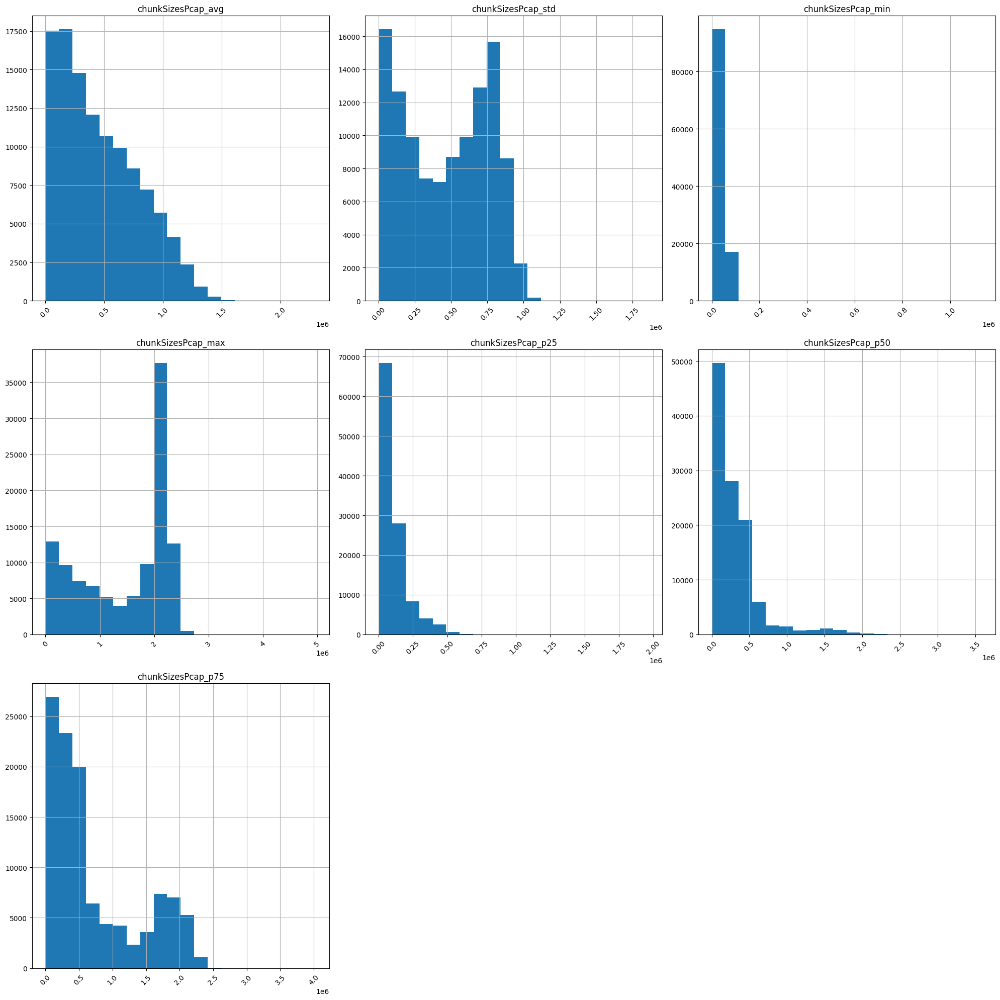

In [ ]:
#Histogram
df[F_chunks].hist(figsize=(20, 20), bins=20, xrot=45)

plt.tight_layout()
plt.show()

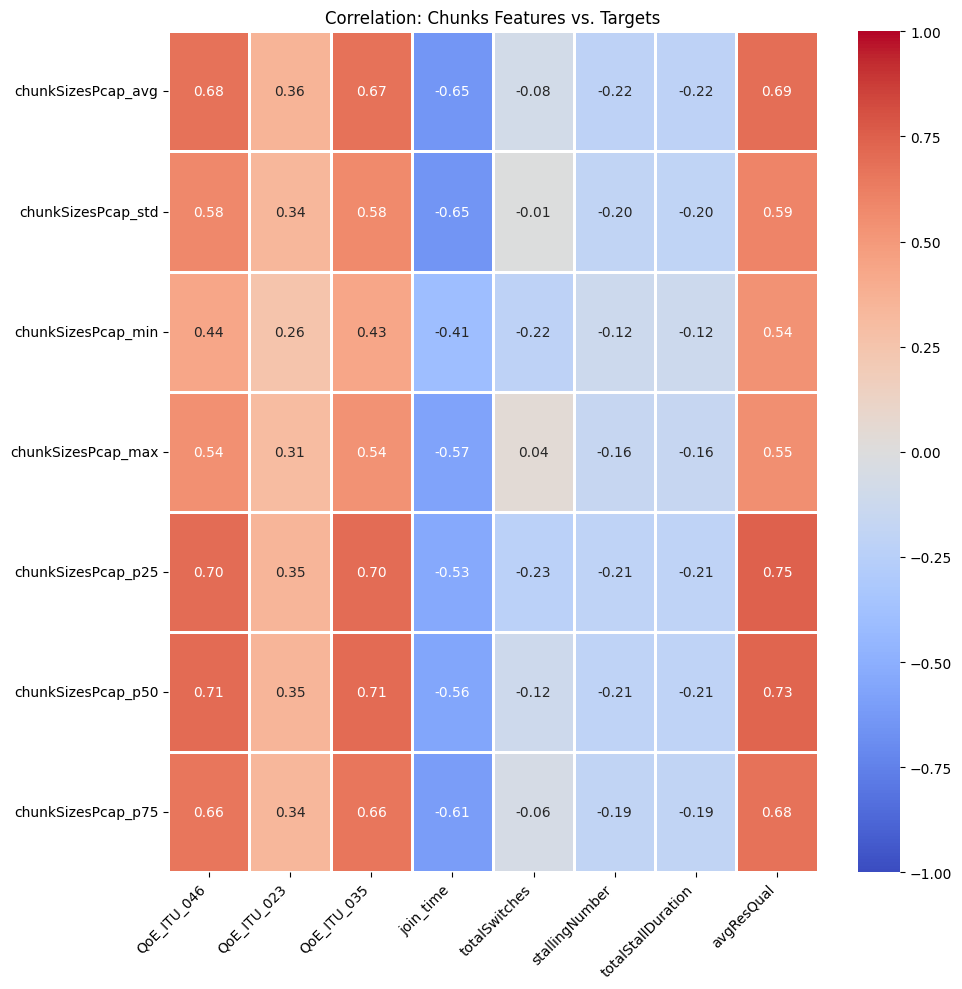

In [ ]:
#Covariance
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = df[F_chunks + TARGETS].corr(method='spearman')

focused_corr = corr_matrix.loc[F_chunks, TARGETS]

plt.figure(figsize=(10, 10))
sns.heatmap(
    focused_corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=2,
    vmin=-1, vmax=1
)

plt.title("Correlation: Chunks Features vs. Targets")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

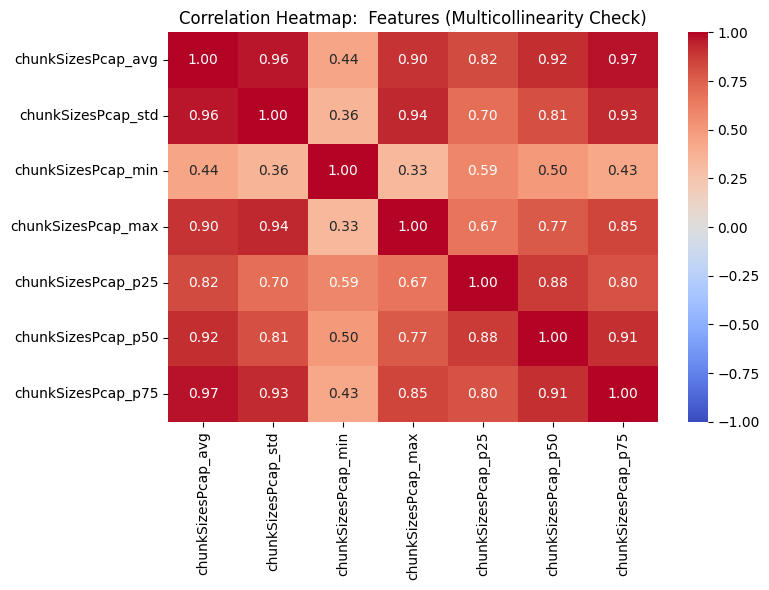

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

corr_matrix = df[F_chunks].corr(method='spearman')

plt.figure(figsize=(8, 6))
sns.heatmap(
    corr_matrix,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1, vmax=1
)

plt.title("Correlation Heatmap:  Features (Multicollinearity Check)")
plt.tight_layout()
plt.show()

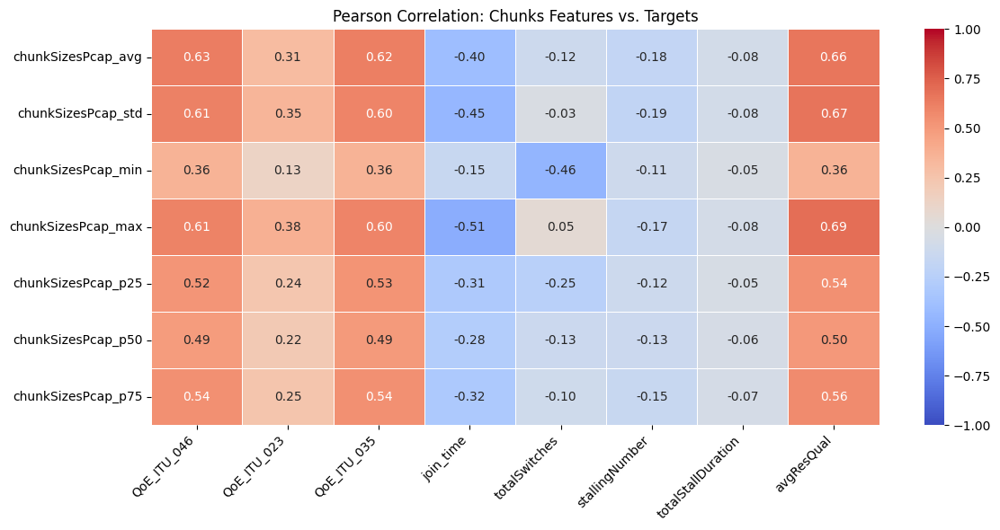

In [ ]:
#Pearson correlation coefficient
corr_matrix_pearson = df[F_chunks + TARGETS].corr(method='pearson')

focused_pearson = corr_matrix_pearson.loc[F_chunks, TARGETS]

plt.figure(figsize=(12, 6))
sns.heatmap(
    focused_pearson,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5,
    vmin=-1, vmax=1
)

plt.title("Pearson Correlation: Chunks Features vs. Targets")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## Corelation Between All Features and Targets


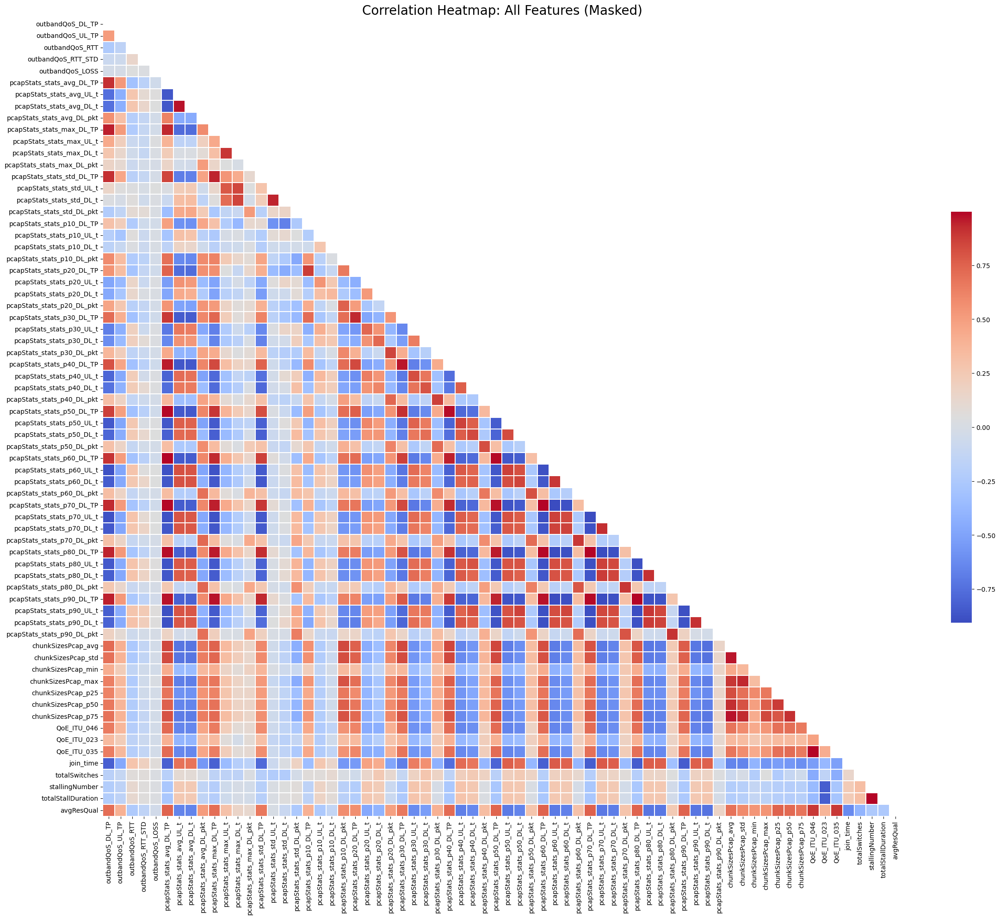

In [ ]:
import numpy as np

corr_matrix = df[ALL_FEATURES + TARGETS].corr(method='spearman')

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

plt.figure(figsize=(24, 20))

sns.heatmap(
    corr_matrix,
    mask=mask,
    annot=False,
    cmap='coolwarm',
    linewidths=0.1,
    square=True,
    cbar_kws={"shrink": .5}
)

plt.title("Correlation Heatmap: All Features (Masked)", fontsize=20)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

In [ ]:
rtt_qoe_corr = corr_matrix.loc['outbandQoS_RTT', 'QoE_ITU_046']

print(f"The correlation is: {rtt_qoe_corr:.4f}")

The correlation is: -0.2130


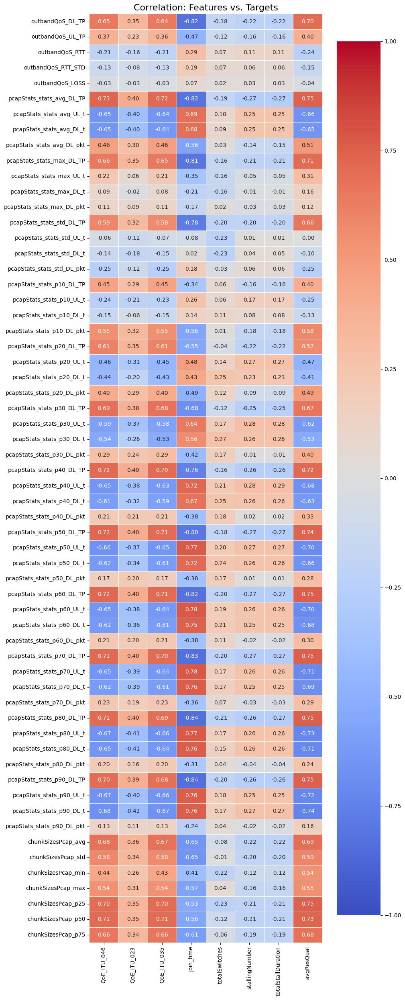

In [ ]:
focused_corr = corr_matrix.loc[ALL_FEATURES, TARGETS]

plt.figure(figsize=(10, 25))

sns.heatmap(
    focused_corr,
    annot=True,
    cmap='coolwarm',
    fmt=".2f",
    linewidths=0.5,
    vmin=-1, vmax=1
)

plt.title("Correlation: Features vs. Targets", fontsize=16)
plt.tight_layout()
plt.show()

/tmp/ipython-input-1186494189.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='Stall_Label', y=feature_x, palette="muted", split=False, ax=axes[0])


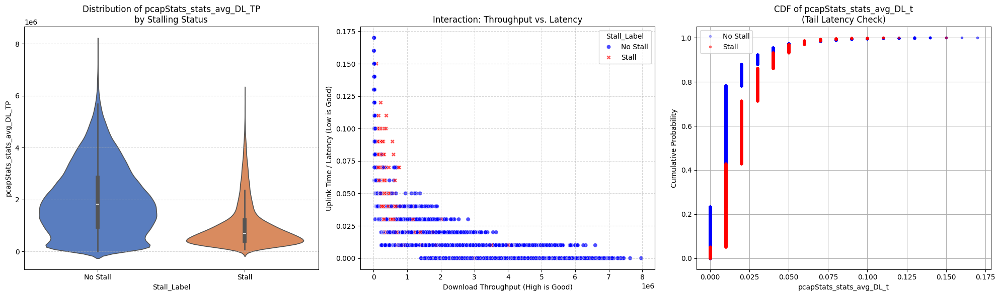

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# --- FIX: Create the Target Column Locally ---
# We define it right here so the code works anywhere in the notebook
df['Class_Has_Stall'] = (df[TARGET_STALLS_COUNT] > 0).astype(int)

# Configuration
target_col = 'Class_Has_Stall'
feature_x = 'pcapStats_stats_avg_DL_TP' # Throughput
feature_y = 'pcapStats_stats_avg_DL_t'  # Latency (RTT)

# Create a Label column for nicer plots
df['Stall_Label'] = df[target_col].map({0: 'No Stall', 1: 'Stall'})

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Violin Plot (Distribution Split) ---
sns.violinplot(data=df, x='Stall_Label', y=feature_x, palette="muted", split=False, ax=axes[0])
axes[0].set_title(f"Distribution of {feature_x}\nby Stalling Status")
axes[0].grid(axis='y', linestyle='--', alpha=0.5)

# --- Plot 2: 2D Scatter with Hue (The "Danger Zone") ---
sns.scatterplot(data=df, x=feature_x, y=feature_y, hue='Stall_Label', style='Stall_Label',
                palette={'No Stall': 'blue', 'Stall': 'red'}, alpha=0.7, ax=axes[1])
axes[1].set_title(f"Interaction: Throughput vs. Latency")
axes[1].set_xlabel("Download Throughput (High is Good)")
axes[1].set_ylabel("Downlink Time / Latency (Low is Good)")
axes[1].grid(True, linestyle='--', alpha=0.5)

# --- Plot 3: CDF (Cumulative Distribution Function) ---
# Separate the data
data_stall = df[df[target_col] == 1][feature_y]
data_no_stall = df[df[target_col] == 0][feature_y]

# Sort data
x_stall = np.sort(data_stall)
y_stall = np.arange(1, len(x_stall) + 1) / len(x_stall)
x_no = np.sort(data_no_stall)
y_no = np.arange(1, len(x_no) + 1) / len(x_no)

axes[2].plot(x_no, y_no, marker='.', linestyle='none', color='blue', alpha=0.3, label='No Stall')
axes[2].plot(x_stall, y_stall, marker='.', linestyle='none', color='red', alpha=0.5, label='Stall')
axes[2].set_title(f"CDF of {feature_y}\n(Tail Latency Check)")
axes[2].set_xlabel(feature_y)
axes[2].set_ylabel("Cumulative Probability")
axes[2].legend()
axes[2].grid(True)

plt.tight_layout()
plt.show()

Plotting 5 Outband features...


/tmp/ipython-input-2942553622.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipython-input-2942553622.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipython-input-2942553622.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipython-input-2942553622.py:32: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipython-input-2942553622.py:32: FutureWarni

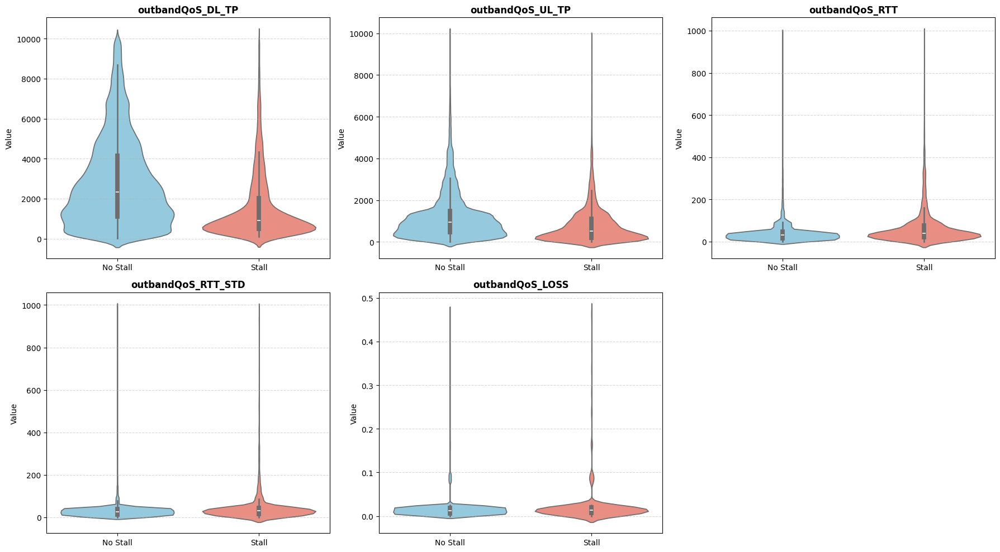

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import math

# 1. Setup Targets
# Ensure the classification target exists
if 'Class_Has_Stall' not in df.columns:
    df['Class_Has_Stall'] = (df['stallingNumber'] > 0).astype(int)

# Create a readable label for plotting
df['Stall_Label'] = df['Class_Has_Stall'].map({0: 'No Stall', 1: 'Stall'})

# 2. Identify Outband Features
# (Assuming F_outband is already defined, but re-defining just in case)
F_outband = [c for c in df.columns if c.startswith('outbandQoS_')]
num_features = len(F_outband)

print(f"Plotting {num_features} Outband features...")

# 3. Setup Grid (Dynamic Rows/Cols)
cols = 3
rows = math.ceil(num_features / cols)

fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
axes = axes.flatten() # Flatten to 1D array for easy looping

# 4. Loop and Plot
for i, feature in enumerate(F_outband):
    ax = axes[i]

    # Violin Plot
    sns.violinplot(
        data=df,
        x='Stall_Label',
        y=feature,
        palette={'No Stall': 'skyblue', 'Stall': 'salmon'},
        split=False,
        ax=ax
    )

    # Styling
    ax.set_title(f"{feature}", fontsize=12, fontweight='bold')
    ax.set_xlabel("")
    ax.set_ylabel("Value")
    ax.grid(axis='y', linestyle='--', alpha=0.5)

# 5. Hide empty subplots (if any)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# **Train-test-split**

In [ ]:
from sklearn.model_selection import train_test_split

X = df[ALL_FEATURES]
y = df[TARGETS]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"Training set shape: {X_train.shape}")
print(f"Testing set shape:  {X_test.shape}")

Training set shape: (89535, 60)
Testing set shape:  (22384, 60)


# **Linear Regression**

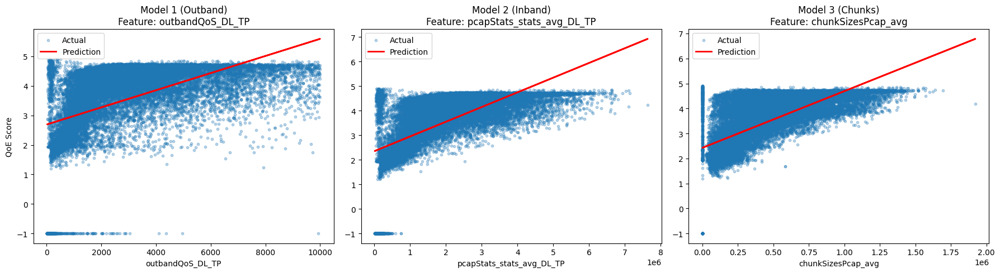


--- Model Comparison ---
Model 1 (Outband):
   MSE:      1.0803
------------------------------
Model 2 (Inband):
   MSE:      0.8753
------------------------------
Model 3 (Chunks):
   MSE:      0.9120
------------------------------


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Define the dictionary of models we want to build
# Format: "Model Name": "Feature Name"
models_to_train = {
    "Model 1 (Outband)": 'outbandQoS_DL_TP',
    "Model 2 (Inband)":  'pcapStats_stats_avg_DL_TP',
    "Model 3 (Chunks)":  'chunkSizesPcap_avg'
}

target = TARGET_MOS_046
results = {}

plt.figure(figsize=(18, 5)) # Create one big figure for side-by-side plots

for i, (model_name, feature) in enumerate(models_to_train.items()):
    # 1. Select the specific data for this model
    # We use [[feature]] to keep it as a DataFrame (2D array)
    X_train_single = X_train[[feature]]
    X_test_single  = X_test[[feature]]

    # 2. Train the specific model
    model = LinearRegression()
    model.fit(X_train_single, y_train[target])

    # 3. Predict
    y_pred = model.predict(X_test_single)

    # 4. Evaluate
    mse = mean_squared_error(y_test[target], y_pred)

    # Store results for summary later
    results[model_name] = {'MSE': mse, 'R2': r2}

    # 5. Plotting (Subplot 1, 2, or 3)
    plt.subplot(1, 3, i+1)
    plt.scatter(X_test_single, y_test[target], alpha=0.3, s=10, label='Actual')
    plt.plot(X_test_single, y_pred, color='red', linewidth=2, label='Prediction')
    plt.title(f"{model_name}\nFeature: {feature}")
    plt.xlabel(feature)
    if i == 0: plt.ylabel("QoE Score")
    plt.legend()

plt.tight_layout()
plt.show()

# --- Print Summary Comparison ---
print("\n--- Model Comparison ---")
for name, metrics in results.items():
    print(f"{name}:")
    print(f"   MSE:      {metrics['MSE']:.4f}")
    print("-" * 30)

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Define feature sets
feature_sets = {
    "Outband": F_outband,
    "Inband":  F_inband,
    "Chunks":  F_chunks
}

target = TARGET_MOS_046
print(f"MSE Results for Target: {target}\n")

for name, features in feature_sets.items():
    # 1. Select Data
    X_train_set = X_train[features]
    X_test_set  = X_test[features]

    # 2. Train
    model = LinearRegression()
    model.fit(X_train_set, y_train[target])

    # 3. Predict & Calculate MSE
    y_pred = model.predict(X_test_set)
    mse = mean_squared_error(y_test[target], y_pred)

    print(f"{name} MSE: {mse:.4f}")

MSE Results for Target: QoE_ITU_046

Outband MSE: 1.0376
Inband MSE: 0.5715
Chunks MSE: 0.7838


In [ ]:
#p-value evaluation, check if the coeffition actullay have meaning or not
#can be fix by removing the correlated feature

import statsmodels.api as sm
import pandas as pd

# Define feature sets
feature_sets = {
    "Outband": F_outband,
    "Inband":  F_inband,
    "Chunks":  F_chunks
}

target = TARGET_MOS_046
print(f"--- P-Value Evaluation for Target: {target} ---\n")

for name, features in feature_sets.items():
    print(f"### MODEL: {name} ({len(features)} features) ###")

    # 1. Prepare Data
    # statsmodels requires us to manually add a "constant" (intercept) column
    X_train_sm = sm.add_constant(X_train[features])
    y_train_sm = y_train[target]

    # 2. Fit the Ordinary Least Squares (OLS) Model
    model_sm = sm.OLS(y_train_sm, X_train_sm).fit()

    # The summary includes R-squared, Coef, and P>|t|
    print(model_sm.summary())
    print("\n" + "="*80 + "\n")

    # Filter features that are statistically INSIGNIFICANT (p-value > 0.05)
    p_values = model_sm.pvalues
    insignificant = p_values[p_values > 0.05]

    if len(insignificant) > 0:
        print(f"Insignificant Features (P > 0.05) in {name}:")
        for feature_name, p_val in insignificant.items():
            print(f"   - {feature_name}: {p_val:.4f}")
        print("   (Consider removing these to reduce noise)\n")
    else:
        print(f"All features in {name} are statistically significant.\n")

    print("-" * 50 + "\n")

--- P-Value Evaluation for Target: QoE_ITU_046 ---

### MODEL: Outband (5 features) ###
                            OLS Regression Results                            
Dep. Variable:            QoE_ITU_046   R-squared:                       0.306
Model:                            OLS   Adj. R-squared:                  0.306
Method:                 Least Squares   F-statistic:                     7900.
Date:                Thu, 29 Jan 2026   Prob (F-statistic):               0.00
Time:                        01:10:28   Log-Likelihood:            -1.2880e+05
No. Observations:               89535   AIC:                         2.576e+05
Df Residuals:                   89529   BIC:                         2.577e+05
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                         coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# 1. Define the list of "Bad" features (High P-value)
features_to_drop = [
    'pcapStats_stats_avg_UL_t',
    'pcapStats_stats_max_DL_t',
    'pcapStats_stats_p10_DL_TP',
    'pcapStats_stats_p40_DL_t',
    'pcapStats_stats_p50_DL_t',
    'pcapStats_stats_p90_DL_pkt'
]

# 2. Create the "Optimized" feature set
# We filter the original list to keep only the good features
F_inband_optimized = [f for f in F_inband if f not in features_to_drop]

print(f"Original Feature Count: {len(F_inband)}")
print(f"Features Dropped:       {len(features_to_drop)}")
print(f"Optimized Feature Count:{len(F_inband_optimized)}")

# 3. Train the Model with the Optimized Set
target = TARGET_MOS_046
model = LinearRegression()

# Select only the optimized columns
X_train_opt = X_train[F_inband_optimized]
X_test_opt  = X_test[F_inband_optimized]

model.fit(X_train_opt, y_train[target])

# 4. Evaluate
y_pred = model.predict(X_test_opt)
mse = mean_squared_error(y_test[target], y_pred)

print("-" * 30)
print(f"Optimized Inband Model Results:")
print(f"   MSE: {mse:.4f}")
print("-" * 30)

Original Feature Count: 48
Features Dropped:       6
Optimized Feature Count:42
------------------------------
Optimized Inband Model Results:
   MSE: 0.5716
------------------------------


In [ ]:
from sklearn.model_selection import cross_val_score, KFold
from sklearn.linear_model import LinearRegression
import numpy as np

# 1. Define the sets to test
feature_sets = {
    "Outband": F_outband,
    "Inband":  F_inband,
    "Inband Optimized":  F_inband_optimized,
    "Chunks":  F_chunks
}

target = TARGET_MOS_046
k_folds = 5  # 5-Fold CV is standard

print(f"--- {k_folds}-Fold Cross-Validation Analysis ---\n")

for name, features in feature_sets.items():
    # --- Setup ---
    model = LinearRegression()

    # We use the FULL X and y here (not X_train), because
    # cross_val_score handles the splitting internally.
    X_full = df[features]
    y_full = df[target]

    # --- Calculate R2 (Accuracy) ---
    r2_scores = cross_val_score(model, X_full, y_full, cv=k_folds, scoring='r2')

    # --- Calculate MSE (Error) ---
    # Note: sklearn returns negative MSE (so "higher" is better),
    # we multiply by -1 to get the actual positive MSE.
    neg_mse_scores = cross_val_score(model, X_full, y_full, cv=k_folds, scoring='neg_mean_squared_error')
    mse_scores = -neg_mse_scores

    # --- Print Robust Statistics ---
    print(f"### {name} ###")
    print(f"   Avg R2 Score: {np.mean(r2_scores):.4f}  (Range: {np.min(r2_scores):.4f} - {np.max(r2_scores):.4f})")
    print(f"   Avg MSE:      {np.mean(mse_scores):.4f}  (Std Dev: {np.std(mse_scores):.4f})")

    # Interpretation check
    if np.std(r2_scores) > 0.1:
        print("Warning: High variance! This model is unstable (results vary wildly between folds).")
    else:
        print("Stable model.")

    print("-" * 40)

--- 5-Fold Cross-Validation Analysis ---

### Outband ###
   Avg R2 Score: 0.3067  (Range: 0.3009 - 0.3175)
   Avg MSE:      1.0399  (Std Dev: 0.0350)
Stable model.
----------------------------------------
### Inband ###
   Avg R2 Score: 0.6182  (Range: 0.6151 - 0.6205)
   Avg MSE:      0.5726  (Std Dev: 0.0198)
Stable model.
----------------------------------------
### Inband Optimized ###
   Avg R2 Score: 0.6183  (Range: 0.6153 - 0.6205)
   Avg MSE:      0.5725  (Std Dev: 0.0198)
Stable model.
----------------------------------------
### Chunks ###
   Avg R2 Score: 0.4732  (Range: 0.4665 - 0.4858)
   Avg MSE:      0.7901  (Std Dev: 0.0268)
Stable model.
----------------------------------------


# **Scale the data**

--- Scaling Outband (5 features) ---


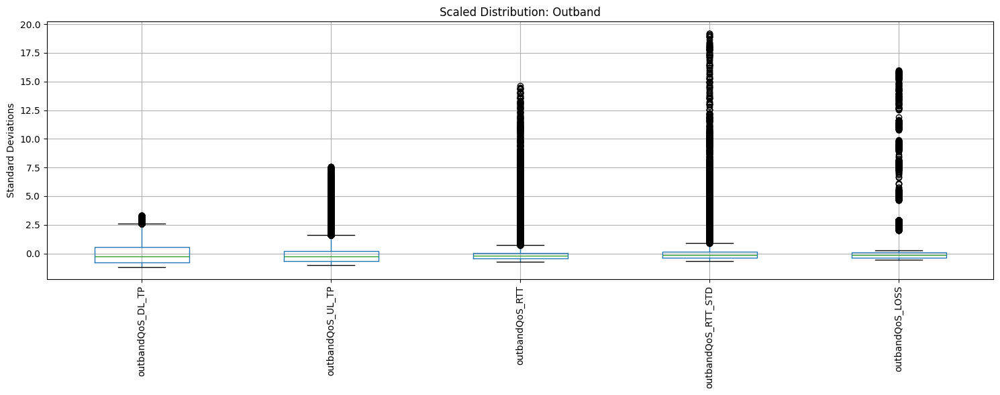



--- Scaling Inband (48 features) ---


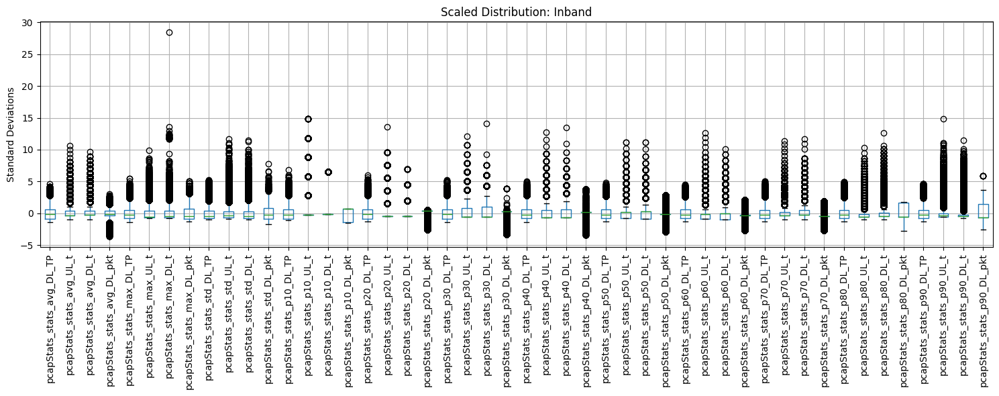



--- Scaling Chunks (7 features) ---


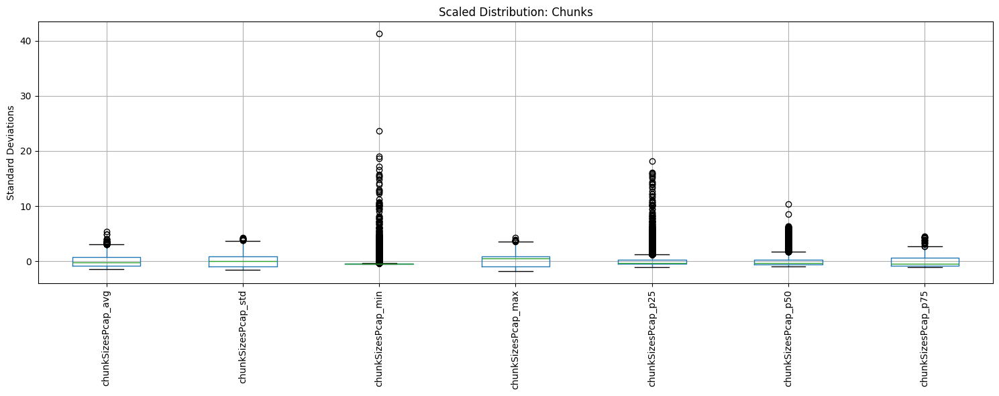

In [ ]:
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import pandas as pd

# Define the sets
feature_sets = {
    "Outband": F_outband,
    "Inband":  F_inband,
    "Chunks":  F_chunks
}

# Dictionary to store the scaled data for later use if needed
scaled_data = {}

for name, features in feature_sets.items():
    print(f"--- Scaling {name} ({len(features)} features) ---")

    # 1. Select Data
    X_train_subset = X_train[features]
    X_test_subset  = X_test[features]

    # 2. Initialize and Fit Scaler
    scaler = StandardScaler()

    # Fit on TRAIN, transform on BOTH
    # (We convert back to DataFrame to keep column names for the plot)
    X_train_scaled = pd.DataFrame(scaler.fit_transform(X_train_subset),
                                  columns=features, index=X_train.index)
    X_test_scaled  = pd.DataFrame(scaler.transform(X_test_subset),
                                  columns=features, index=X_test.index)

    # Store for later
    scaled_data[name] = (X_train_scaled, X_test_scaled)

    # 3. Plot the Result
    plt.figure(figsize=(15, 6))

    # Boxplot shows if the mean is now 0 and range is normalized
    X_train_scaled.boxplot(rot=90)

    plt.title(f"Scaled Distribution: {name}")
    plt.ylabel("Standard Deviations")
    plt.tight_layout()
    plt.show()
    print("\n")

--- Feature Importance (Linear Regression on Scaled Data) ---

### Outband Top Features ###
              Feature  Coefficient
0    outbandQoS_DL_TP     0.579083
1      outbandQoS_RTT    -0.174768
2  outbandQoS_RTT_STD    -0.045169
3    outbandQoS_UL_TP     0.034590
4     outbandQoS_LOSS    -0.024851




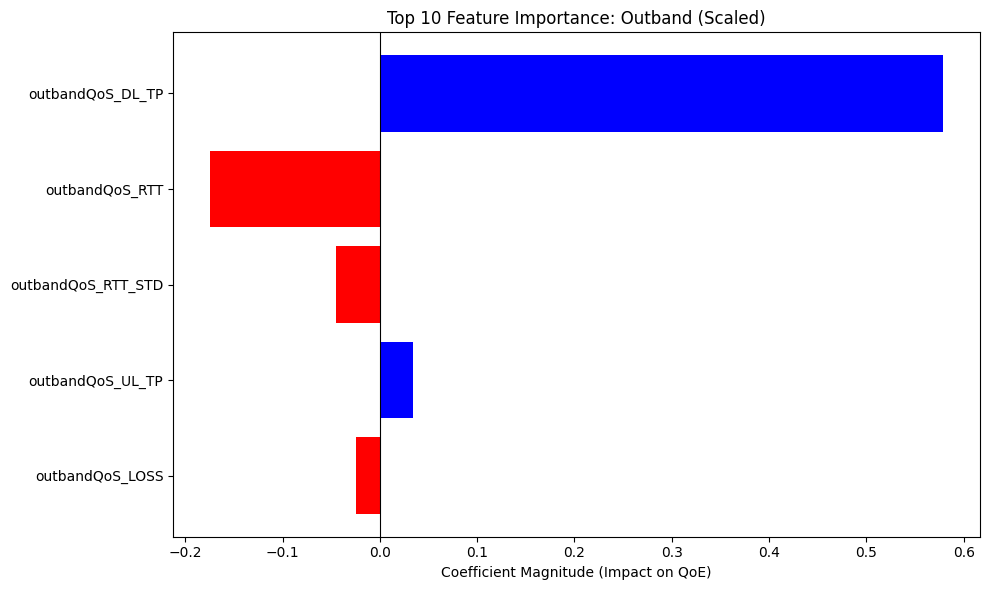

--------------------------------------------------

### Inband Top Features ###
                      Feature  Coefficient
0   pcapStats_stats_avg_DL_TP     1.976822
1    pcapStats_stats_p90_UL_t    -0.393370
2  pcapStats_stats_avg_DL_pkt     0.321545
3   pcapStats_stats_max_DL_TP    -0.316181
4   pcapStats_stats_p80_DL_TP    -0.279587
5    pcapStats_stats_std_UL_t     0.276571
6   pcapStats_stats_p90_DL_TP    -0.265796
7   pcapStats_stats_p70_DL_TP    -0.262104
8  pcapStats_stats_std_DL_pkt    -0.225842
9   pcapStats_stats_p60_DL_TP    -0.222097




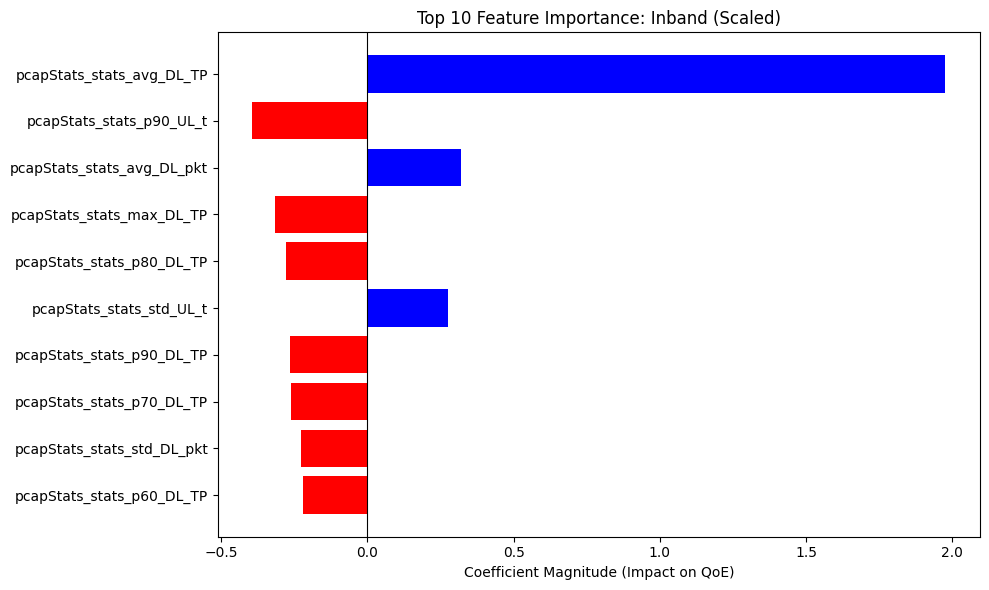

--------------------------------------------------

### Chunks Top Features ###
              Feature  Coefficient
0  chunkSizesPcap_avg     1.163702
1  chunkSizesPcap_max     0.516469
2  chunkSizesPcap_std    -0.487174
3  chunkSizesPcap_p75    -0.292621
4  chunkSizesPcap_min     0.255258
5  chunkSizesPcap_p50    -0.175520
6  chunkSizesPcap_p25    -0.023983




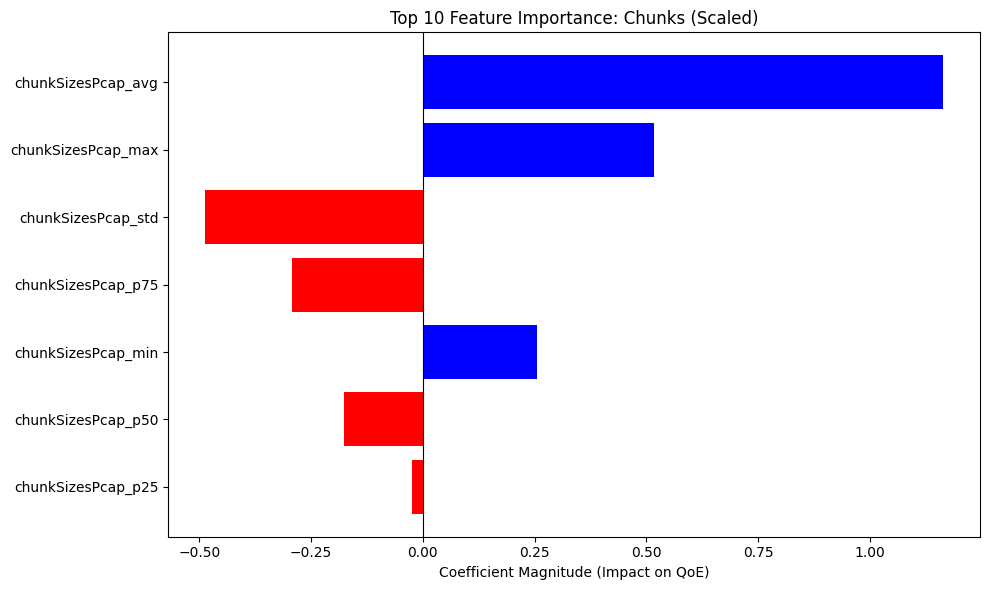

--------------------------------------------------



In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
import pandas as pd
import matplotlib.pyplot as plt

# Define feature sets
feature_sets = {
    "Outband": F_outband,
    "Inband":  F_inband,
    "Chunks":  F_chunks
}

target = TARGET_MOS_046
print(f"--- Feature Importance (Linear Regression on Scaled Data) ---\n")

for name, features in feature_sets.items():
    # 1. Prepare & Scale Data
    X_train_sub = X_train[features]
    X_test_sub  = X_test[features]

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_sub)
    X_test_scaled  = scaler.transform(X_test_sub)

    # 2. Train Model
    model = LinearRegression()
    model.fit(X_train_scaled, y_train[target])

    # 3. Extract & Rank Coefficients
    # We create a DataFrame to easily sort them
    coef_df = pd.DataFrame({
        'Feature': features,
        'Coefficient': model.coef_,
        'Abs_Importance': abs(model.coef_) # Used for sorting
    })

    # Sort by Absolute Importance (Highest first)
    ranked_features = coef_df.sort_values(by='Abs_Importance', ascending=False).reset_index(drop=True)

    # 4. Display the Top 10 Features
    print(f"### {name} Top Features ###")
    print(ranked_features[['Feature', 'Coefficient']].head(10)) # Show top 10
    print("\n")

    # 5. Visualize (Horizontal Bar Plot)
    plt.figure(figsize=(10, 6))

    # Plot top 10 for clarity
    top_plot = ranked_features.head(10).sort_values(by='Abs_Importance', ascending=True)

    colors = ['red' if x < 0 else 'blue' for x in top_plot['Coefficient']]
    plt.barh(top_plot['Feature'], top_plot['Coefficient'], color=colors)

    plt.title(f"Top 10 Feature Importance: {name} (Scaled)")
    plt.xlabel("Coefficient Magnitude (Impact on QoE)")
    plt.axvline(x=0, color='black', linewidth=0.8)
    plt.tight_layout()
    plt.show()
    print("-" * 50 + "\n")

--- Feature Importance & MSE (Linear Regression on Scaled Data) ---

### Outband ###
   MSE: 1.0376
   Top Features:
              Feature  Coefficient
0    outbandQoS_DL_TP     0.579083
1      outbandQoS_RTT    -0.174768
2  outbandQoS_RTT_STD    -0.045169
3    outbandQoS_UL_TP     0.034590
4     outbandQoS_LOSS    -0.024851




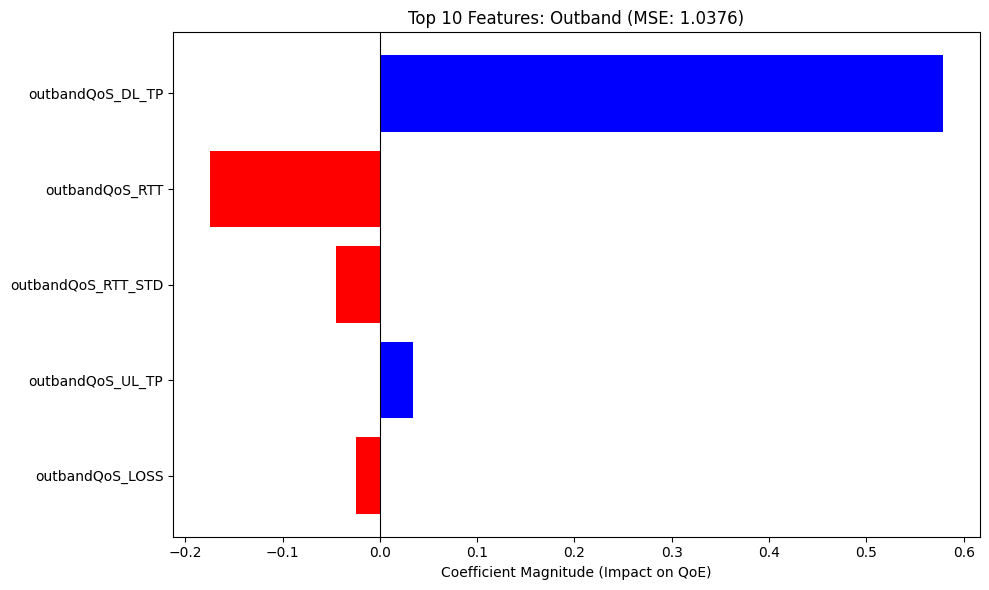

--------------------------------------------------

### Inband ###
   MSE: 0.5715
   Top Features:
                      Feature  Coefficient
0   pcapStats_stats_avg_DL_TP     1.976822
1    pcapStats_stats_p90_UL_t    -0.393370
2  pcapStats_stats_avg_DL_pkt     0.321545
3   pcapStats_stats_max_DL_TP    -0.316181
4   pcapStats_stats_p80_DL_TP    -0.279587
5    pcapStats_stats_std_UL_t     0.276571
6   pcapStats_stats_p90_DL_TP    -0.265796
7   pcapStats_stats_p70_DL_TP    -0.262104
8  pcapStats_stats_std_DL_pkt    -0.225842
9   pcapStats_stats_p60_DL_TP    -0.222097




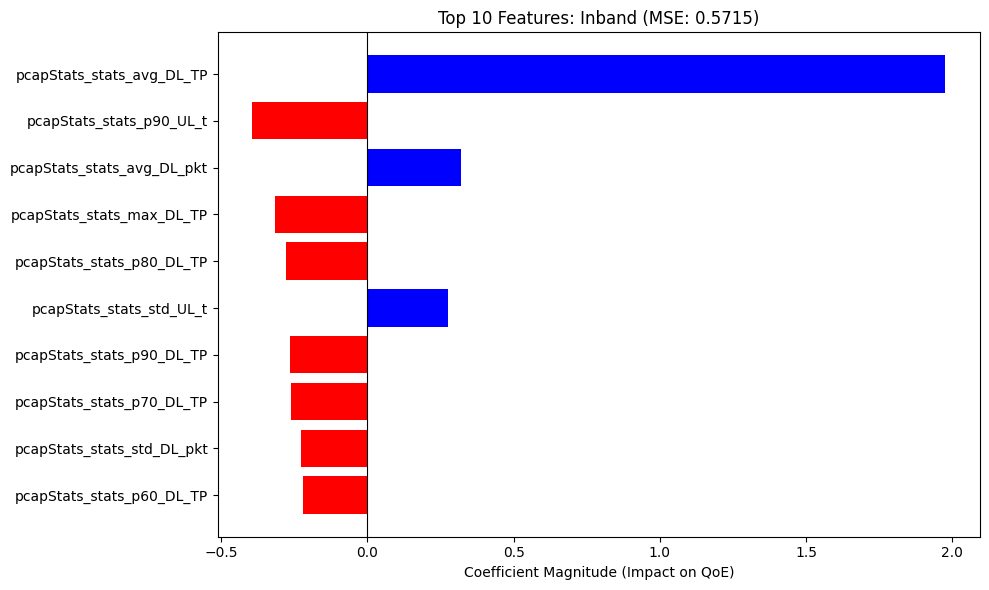

--------------------------------------------------

### Chunks ###
   MSE: 0.7838
   Top Features:
              Feature  Coefficient
0  chunkSizesPcap_avg     1.163702
1  chunkSizesPcap_max     0.516469
2  chunkSizesPcap_std    -0.487174
3  chunkSizesPcap_p75    -0.292621
4  chunkSizesPcap_min     0.255258
5  chunkSizesPcap_p50    -0.175520
6  chunkSizesPcap_p25    -0.023983




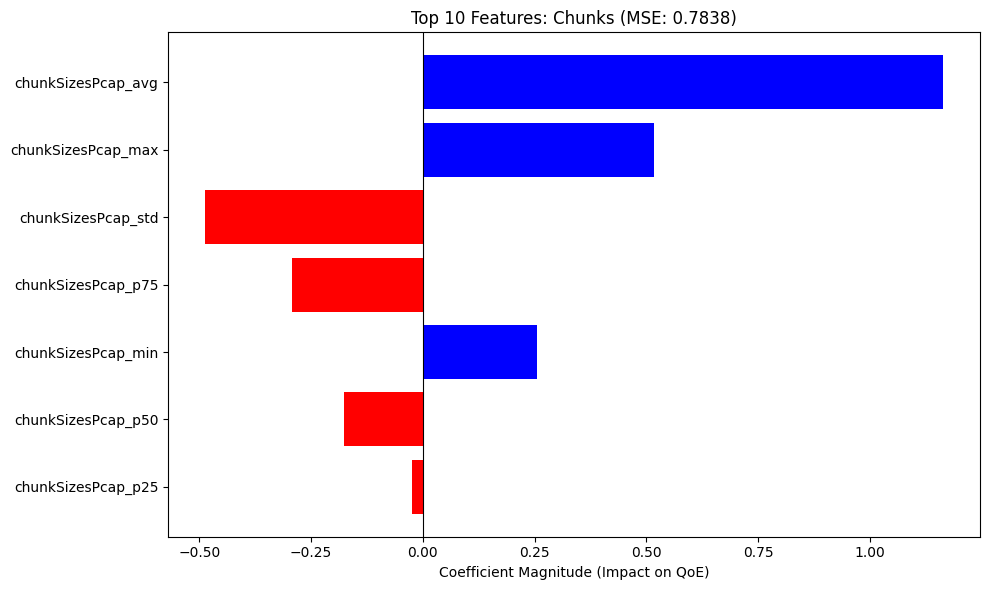

--------------------------------------------------



In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
import pandas as pd
import matplotlib.pyplot as plt

# Define feature sets
feature_sets = {
    "Outband": F_outband,
    "Inband":  F_inband,
    "Chunks":  F_chunks
}

target = TARGET_MOS_046
print(f"--- Feature Importance & MSE (Linear Regression on Scaled Data) ---\n")

for name, features in feature_sets.items():
    # 1. Prepare & Scale Data
    X_train_sub = X_train[features]
    X_test_sub  = X_test[features]

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train_sub)
    # Important: Transform test set using the SAME scaler fit on train
    X_test_scaled  = scaler.transform(X_test_sub)

    # 2. Train Model
    model = LinearRegression()
    model.fit(X_train_scaled, y_train[target])

    # --- NEW: Predict & Calculate MSE ---
    y_pred = model.predict(X_test_scaled)
    mse = mean_squared_error(y_test[target], y_pred)

    # 3. Extract & Rank Coefficients
    coef_df = pd.DataFrame({
        'Feature': features,
        'Coefficient': model.coef_,
        'Abs_Importance': abs(model.coef_) # Used for sorting
    })

    # Sort by Absolute Importance (Highest first)
    ranked_features = coef_df.sort_values(by='Abs_Importance', ascending=False).reset_index(drop=True)

    # 4. Display the Top 10 Features & MSE
    print(f"### {name} ###")
    print(f"   MSE: {mse:.4f}")  # <--- Printed here
    print("   Top Features:")
    print(ranked_features[['Feature', 'Coefficient']].head(10))
    print("\n")

    # 5. Visualize (Horizontal Bar Plot)
    plt.figure(figsize=(10, 6))

    # Plot top 10 for clarity
    top_plot = ranked_features.head(10).sort_values(by='Abs_Importance', ascending=True)

    colors = ['red' if x < 0 else 'blue' for x in top_plot['Coefficient']]
    plt.barh(top_plot['Feature'], top_plot['Coefficient'], color=colors)

    # Added MSE to the title for quick reference
    plt.title(f"Top 10 Features: {name} (MSE: {mse:.4f})")
    plt.xlabel("Coefficient Magnitude (Impact on QoE)")
    plt.axvline(x=0, color='black', linewidth=0.8)
    plt.tight_layout()
    plt.show()
    print("-" * 50 + "\n")

#**Classification**

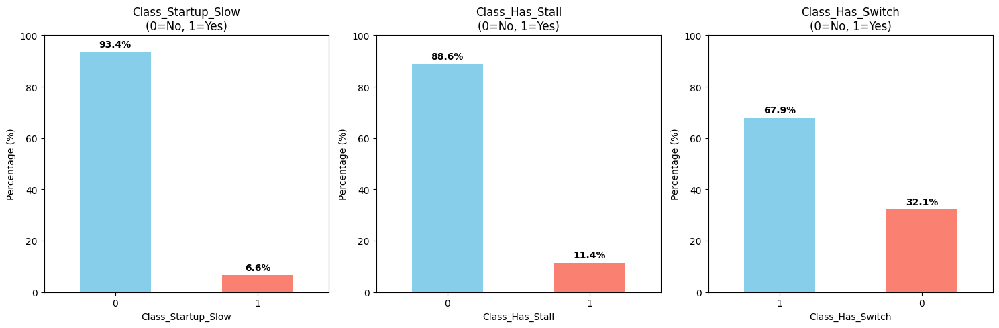

In [ ]:
# Data Processing
import matplotlib.pyplot as plt
import pandas as pd

# Define the source columns (from your original variable names)
col_startup  = TARGET_STARTUP       # 'join_time'
col_stalls   = TARGET_STALLS_COUNT  # 'stallingNumber'
col_switches = TARGET_SWITCHES      # 'totalSwitches'

# 1. Create the new Binary Columns
# ---------------------------------------------------------

# Task 1: Startup > 30s? (1 if True, 0 if False)
df['Class_Startup_Slow'] = (df[col_startup] > 30000).astype(int)

# Task 2: Any Stalling? (1 if count > 0, 0 if False)
df['Class_Has_Stall'] = (df[col_stalls] > 0).astype(int)

# Task 3: Any Quality Switching? (1 if count > 0, 0 if False)
df['Class_Has_Switch'] = (df[col_switches] > 0).astype(int)

# 2. Check Class Balance (Crucial Step)
# ---------------------------------------------------------
new_targets = ['Class_Startup_Slow', 'Class_Has_Stall', 'Class_Has_Switch']

plt.figure(figsize=(15, 5))

for i, target in enumerate(new_targets):
    plt.subplot(1, 3, i+1)

    # Calculate counts
    counts = df[target].value_counts(normalize=True) * 100
    colors = ['skyblue', 'salmon']

    # Plot
    counts.plot(kind='bar', color=colors, rot=0)

    plt.title(f"{target}\n(0=No, 1=Yes)")
    plt.ylabel("Percentage (%)")
    plt.ylim(0, 100)

    # Add text labels
    for index, value in enumerate(counts):
        plt.text(index, value + 2, f"{value:.1f}%", ha='center', fontweight='bold')

plt.tight_layout()
plt.show()

Training 9 Random Forest Models (Info Gain) with SMOTE...

--- Target: Class_Startup_Slow | Set: Outband ---
           Feature     Gain
  outbandQoS_DL_TP 0.622822
  outbandQoS_UL_TP 0.223560
    outbandQoS_RTT 0.060798
   outbandQoS_LOSS 0.047231
outbandQoS_RTT_STD 0.045589

--- Target: Class_Startup_Slow | Set: Inband ---
                   Feature     Gain
pcapStats_stats_p40_DL_pkt 0.213043
pcapStats_stats_p50_DL_pkt 0.188689
pcapStats_stats_p20_DL_pkt 0.128506
pcapStats_stats_p30_DL_pkt 0.088050
 pcapStats_stats_p30_DL_TP 0.051358

--- Target: Class_Startup_Slow | Set: Chunks ---
           Feature     Gain
chunkSizesPcap_p75 0.340015
chunkSizesPcap_avg 0.240005
chunkSizesPcap_p50 0.200093
chunkSizesPcap_max 0.120005
chunkSizesPcap_p25 0.079971

--- Target: Class_Has_Stall | Set: Outband ---
           Feature     Gain
  outbandQoS_DL_TP 0.296770
  outbandQoS_UL_TP 0.218016
   outbandQoS_LOSS 0.165726
    outbandQoS_RTT 0.161225
outbandQoS_RTT_STD 0.158263

--- Target: Class_Has_

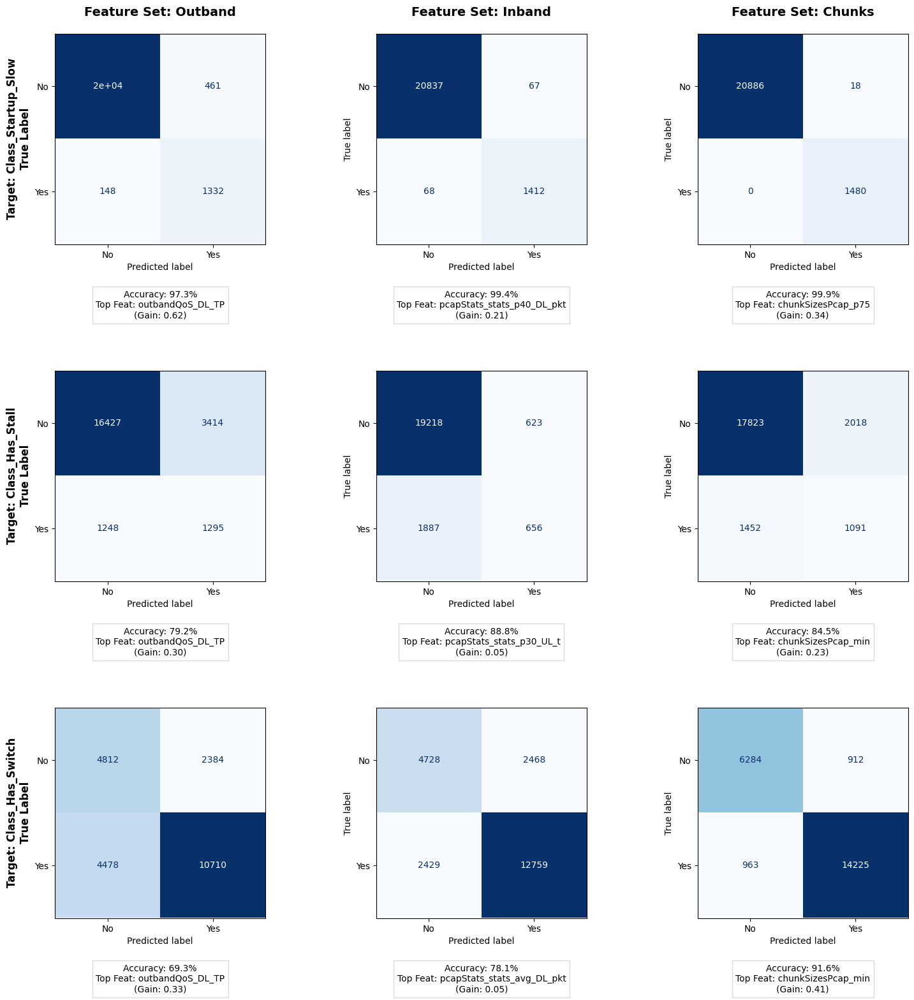

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import pandas as pd

# 1. Define Configuration
targets = ['Class_Startup_Slow', 'Class_Has_Stall', 'Class_Has_Switch']
feature_sets = {
    "Outband": F_outband,
    "Inband":  F_inband,
    "Chunks":  F_chunks
}

# 2. Setup the Plotting Grid (3 Rows x 3 Columns)
fig, axes = plt.subplots(3, 3, figsize=(18, 18))
plt.subplots_adjust(hspace=0.6, wspace=0.3) # Increased hspace slightly for text

print("Training 9 Random Forest Models (Info Gain) with SMOTE...")

# 3. Main Loop: Iterate through Targets (Rows) and Feature Sets (Columns)
for row, target_name in enumerate(targets):
    for col, (set_name, features) in enumerate(feature_sets.items()):

        # --- A. Data Prep ---
        X = df[features]
        y = df[target_name]

        # Split (Stratify ensures the test set has the same class ratio)
        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42, stratify=y
        )

        # Apply SMOTE (Only to Training Data)
        smote = SMOTE(random_state=42)
        X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

        # --- B. Train Model (Using Entropy/Info Gain) ---
        clf = RandomForestClassifier(
            n_estimators=50,
            criterion='entropy', # <--- Changed to use Information Gain
            random_state=42
        )
        clf.fit(X_train_res, y_train_res)

        # --- C. Feature Importance Extraction ---
        importances = clf.feature_importances_

        # Create a temp DataFrame to sort features
        feat_df = pd.DataFrame({'Feature': features, 'Gain': importances})
        feat_df = feat_df.sort_values(by='Gain', ascending=False)

        # Get Top Feature for Plot and Top 5 for Print
        top_feature_name = feat_df.iloc[0]['Feature']
        top_feature_score = feat_df.iloc[0]['Gain']

        print(f"\n--- Target: {target_name} | Set: {set_name} ---")
        print(feat_df.head(5).to_string(index=False)) # Print top 5 to console

        # --- D. Predict & Visualize ---
        y_pred = clf.predict(X_test)

        ax = axes[row, col]
        cm = confusion_matrix(y_test, y_pred)

        # Create display (0=No Issue, 1=Issue)
        disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['No', 'Yes'])
        disp.plot(ax=ax, cmap='Blues', colorbar=False)

        # Set Titles
        if row == 0: ax.set_title(f"Feature Set: {set_name}", fontsize=14, fontweight='bold', pad=20)
        if col == 0: ax.set_ylabel(f"Target: {target_name}\nTrue Label", fontsize=12, fontweight='bold')

        # Add Metrics to the Plot (Accuracy + Top Feature)
        acc = clf.score(X_test, y_test)
        stats_text = (
            f"Accuracy: {acc:.1%}\n"
            f"Top Feat: {top_feature_name}\n"
            f"(Gain: {top_feature_score:.2f})"
        )

        # Place text below the matrix
        ax.text(0.5, -0.35, stats_text, transform=ax.transAxes,
                ha='center', fontsize=10, bbox=dict(facecolor='white', alpha=0.8, edgecolor='lightgray'))

print("\nDone! Plots generated.")
plt.show()

Calculating Precision, Recall, and F1 for all models...

--- Model Performance Summary (Sorted by F1 Score) ---


,Target,Feature Set,Precision,Recall,F1 Score
2,Class_Startup_Slow,Chunks,0.987984,1.000000,0.993956
1,Class_Startup_Slow,Inband,0.954699,0.954054,0.954376
8,Class_Has_Switch,Chunks,0.939750,0.936595,0.938170
7,Class_Has_Switch,Inband,0.837919,0.840071,0.838994
0,Class_Startup_Slow,Outband,0.742889,0.900000,0.813932
6,Class_Has_Switch,Outband,0.817932,0.705162,0.757372
5,Class_Has_Stall,Chunks,0.350917,0.429021,0.386058
3,Class_Has_Stall,Outband,0.275005,0.509241,0.357143
4,Class_Has_Stall,Inband,0.512901,0.257963,0.343276


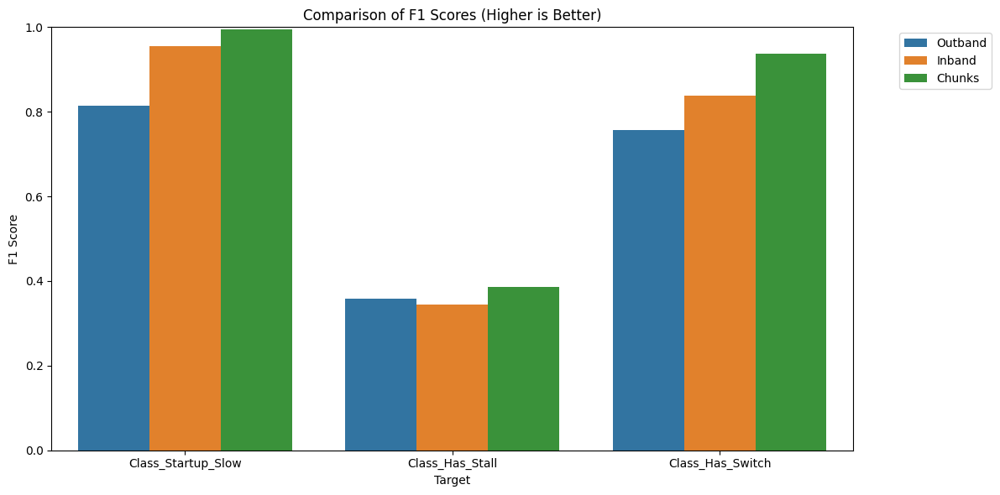

In [ ]:
#Recall, Precison, F1 Score
from sklearn.metrics import precision_recall_fscore_support
import pandas as pd

# List to store results
metrics_data = []

print("Calculating Precision, Recall, and F1 for all models...")

for target_name in targets:
    for set_name, features in feature_sets.items():

        # 1. Prepare Data (Same process as before)
        X = df[features]
        y = df[target_name]

        X_train, X_test, y_train, y_test = train_test_split(
            X, y, test_size=0.2, random_state=42, stratify=y
        )

        smote = SMOTE(random_state=42)
        X_train_res, y_train_res = smote.fit_resample(X_train, y_train)

        # 2. Train Model
        clf = RandomForestClassifier(n_estimators=50, criterion='entropy', random_state=42)
        clf.fit(X_train_res, y_train_res)

        # 3. Predict
        y_pred = clf.predict(X_test)

        # 4. Calculate Metrics for the "Positive" Class (Class 1 = Problem)
        # pos_label=1 ensures we focus on detecting the Stalls/Switching (not the 'Normal' cases)
        precision, recall, f1, _ = precision_recall_fscore_support(
            y_test, y_pred, average='binary', pos_label=1
        )

        # 5. Store Result
        metrics_data.append({
            'Target': target_name,
            'Feature Set': set_name,
            'Precision': precision,
            'Recall': recall,
            'F1 Score': f1
        })

# 6. Create DataFrame
metrics_df = pd.DataFrame(metrics_data)

# 7. Display formatted table
# Sort by F1 Score to see the best models at the top
print("\n--- Model Performance Summary (Sorted by F1 Score) ---")
display(metrics_df.sort_values(by='F1 Score', ascending=False))

# Optional: Visualizing the Comparison
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
sns.barplot(data=metrics_df, x='Target', y='F1 Score', hue='Feature Set')
plt.title("Comparison of F1 Scores (Higher is Better)")
plt.ylim(0, 1)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

# **Dimensionality Reduction**

Data Shape: (89535, 48)
Computing SVD (Memory Optimized)...
SVD Complete.


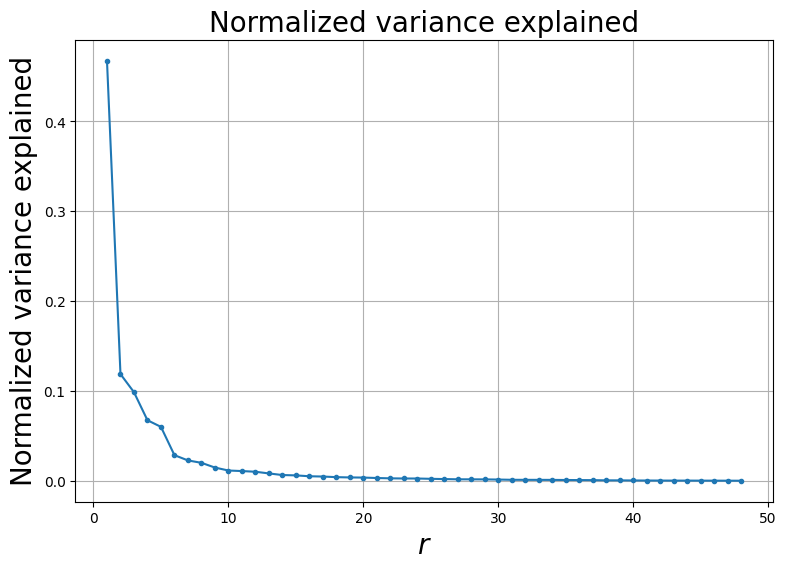

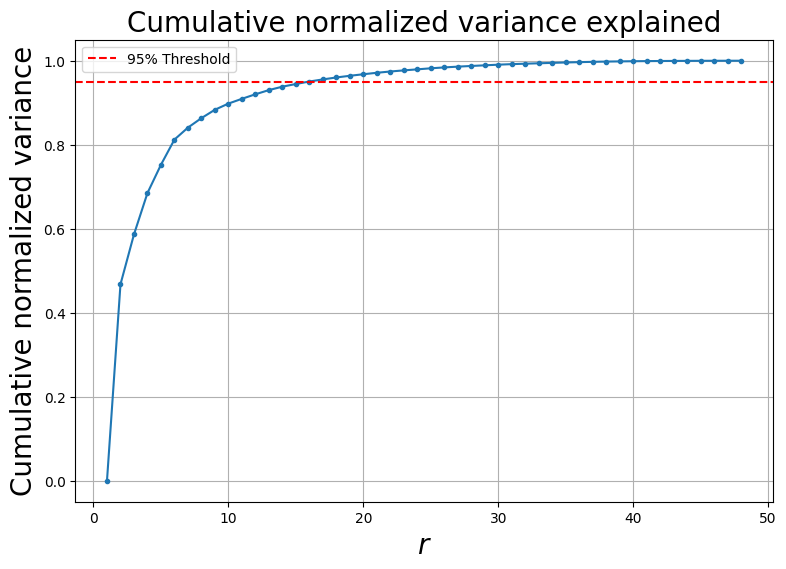

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

# 1. Prepare Data
features = F_inband
target = TARGET_MOS_046

X_train_sub = X_train[features]
X_test_sub  = X_test[features]
y_train_sub = y_train[target]
y_test_sub  = y_test[target]

# 2. Scale
scaler = StandardScaler()
scaler.fit(X_train_sub)
X_train_sca = scaler.transform(X_train_sub)

print(f"Data Shape: {X_train_sca.shape}")
print("Computing SVD (Memory Optimized)...")

# 3. SVD with full_matrices=False (CRITICAL FIX)
# This prevents creating the massive N x N matrix.
# It only creates an N x M matrix (where M is number of features = 48)
U, Sigma, Vt = np.linalg.svd(X_train_sca, full_matrices=False)

print("SVD Complete.")

# 4. Calculate Variance
Sigma_squared = np.square(Sigma)
total_variance = sum(Sigma_squared)

# --- Plot 1: Normalized Variance ---
fig = plt.figure(figsize=(9, 6))
plt.plot(range(1, 1 + len(Sigma_squared)), Sigma_squared / total_variance, marker='.')
plt.xlabel(r'$r$', size=20)
plt.ylabel(r'Normalized variance explained', size=20)
plt.title(r'Normalized variance explained', size=20)
plt.grid(True)
plt.show()

# --- Plot 2: Cumulative Variance ---
cumul = [sum(Sigma_squared[0:i] / total_variance) for i in range(len(Sigma_squared))]

fig = plt.figure(figsize=(9, 6))
plt.plot(range(1, 1 + len(cumul)), cumul, marker='.')
plt.xlabel(r'$r$', size=20)
plt.ylabel(r'Cumulative normalized variance', size=20)
plt.grid(True)
plt.title(r'Cumulative normalized variance explained', size=20)
plt.axhline(y=0.95, color='r', linestyle='--', label='95% Threshold')
plt.legend()
plt.show()

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import math

# 6. Choose r (Number of components)
# F_inband has 48 features, so r must be < 48.
# Look at the plot: pick r where cumulative variance is ~0.95 (e.g., r=25 or 30)
r = 30

# 7. Compute the Reduced Training Set
V = Vt.T             # The Vt given by linalg.svd was the transpose of V
V_r = V[:, :r]       # Take the first r columns
X_train_reduced = X_train_sca.dot(V_r)

print(f"Reduced shape: {X_train_reduced.shape}")

# 8. Fit a Linear Model on the reduced training set
model = LinearRegression()
model.fit(X_train_reduced, y_train_sub)

# 9. Project the Test Samples onto the reduced vectorial space
# Important: Use the SAME scaler and SAME V_r matrix
X_test_sca = scaler.transform(X_test_sub)
X_test_reduced = X_test_sca.dot(V_r)

# 10. Make Prediction & Evaluate
y_pred = model.predict(X_test_reduced)

MSE = mean_squared_error(y_test_sub, y_pred)

print(f"\nModel Performance (SVD r={r}):")
print(f"   MSE:  {MSE:.4f}")

Reduced shape: (89535, 30)

Model Performance (SVD r=30):
   MSE:  0.5775


Scanning for optimal r...


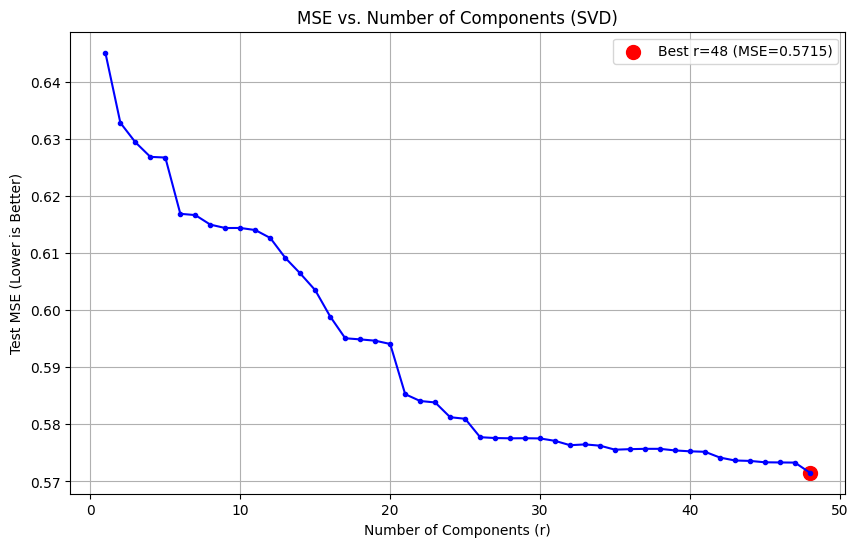

The lowest MSE is achieved with r = 48


In [ ]:
# 4. Loop to find the Best r
mse_history = []
r_values = range(1, len(features) + 1)

print("Scanning for optimal r...")

for r in r_values:
    # A. Reduce Data
    V_r = V[:, :r]
    X_train_reduced = X_train_sca.dot(V_r)
    X_test_reduced  = X_test_sca.dot(V_r)

    # B. Train Linear Regression
    model = LinearRegression()
    model.fit(X_train_reduced, y_train_sub)

    # C. Evaluate
    y_pred = model.predict(X_test_reduced)
    mse = mean_squared_error(y_test_sub, y_pred)
    mse_history.append(mse)

# 5. Plot the Result
best_r = r_values[np.argmin(mse_history)]
min_mse = min(mse_history)

plt.figure(figsize=(10, 6))
plt.plot(r_values, mse_history, marker='.', color='b')
plt.scatter(best_r, min_mse, color='red', s=100, label=f'Best r={best_r} (MSE={min_mse:.4f})')

plt.title("MSE vs. Number of Components (SVD)")
plt.xlabel("Number of Components (r)")
plt.ylabel("Test MSE (Lower is Better)")
plt.grid(True)
plt.legend()
plt.show()

print(f"The lowest MSE is achieved with r = {best_r}")

# **Explainable AI**

In [ ]:
# Linear Regression using F_inband
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Define feature sets
feature_sets = {
    "Inband":  F_inband,
}

target = TARGET_MOS_046
print(f"MSE Results for Target: {target}\n")

for name, features in feature_sets.items():
    # 1. Select Data
    X_train_set = X_train[features]
    X_test_set  = X_test[features]

    # 2. Train
    model = LinearRegression()
    model.fit(X_train_set, y_train[target])

    # 3. Predict & Calculate MSE
    y_pred = model.predict(X_test_set)
    mse = mean_squared_error(y_test[target], y_pred)

    print(f"{name} MSE: {mse:.4f}")

MSE Results for Target: QoE_ITU_046

Inband MSE: 0.5715


Training & Explaining for Target: QoE_ITU_046

Inband MSE: 0.5715
Calculating Permutation Importance (Top 20 features)...


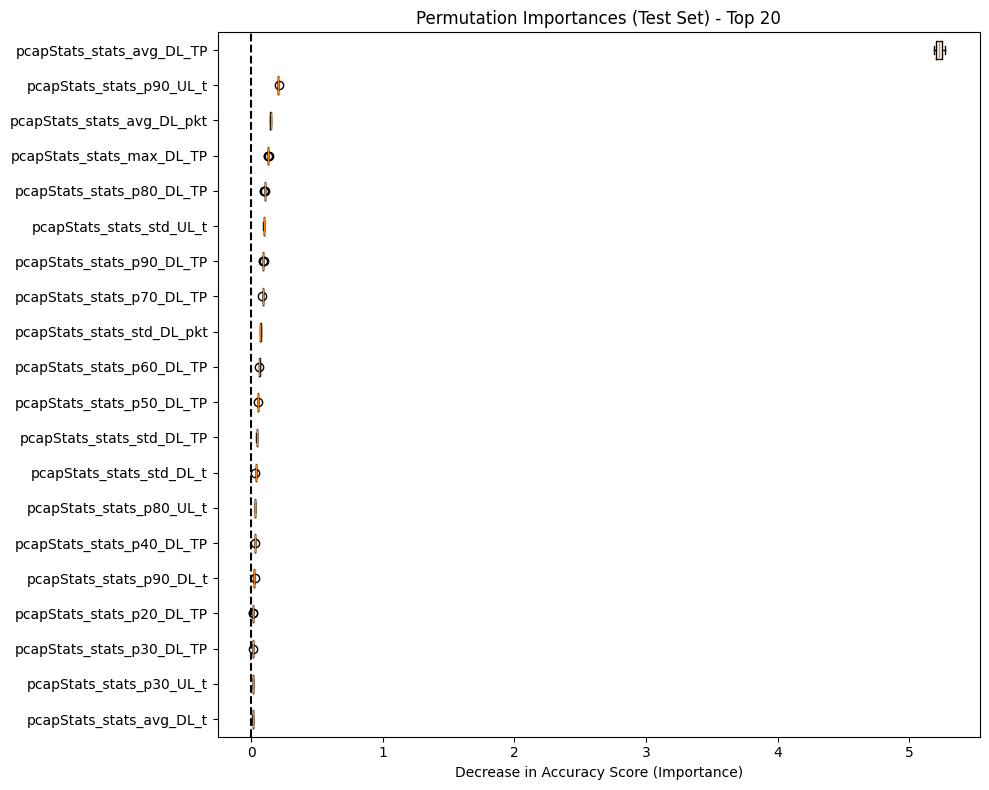

In [ ]:
# Permutation Importance
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.inspection import permutation_importance
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# --- 1. Define the Explainability Function (Optimized) ---
def boxplot_pi(model, X_test, y_test, top_n=20):
    print(f"Calculating Permutation Importance (Top {top_n} features)...")

    # Calculate importance (n_repeats=10 is usually sufficient and much faster)
    result = permutation_importance(
        model, X_test, y_test,
        n_repeats=10,    # Reduced from 100 to save time/RAM
        random_state=42,
        n_jobs=-1
    )

    # Get indices that sort the importance from low to high
    sorted_idx = result.importances_mean.argsort()

    # Slice to keep only the top N features (the last N in the sorted list)
    # We take the last 'top_n' indices
    top_idx = sorted_idx[-top_n:]

    fig, ax = plt.subplots(figsize=(10, 8))

    # Create the boxplot
    ax.boxplot(
        result.importances[top_idx].T,
        vert=False,
        tick_labels=X_test.columns[top_idx]
    )

    ax.set_title(f"Permutation Importances (Test Set) - Top {top_n}")
    ax.axvline(x=0, color="k", linestyle="--")
    ax.set_xlabel("Decrease in Accuracy Score (Importance)")

    fig.tight_layout()
    plt.show()

# --- 2. Train Model & Run Explanation ---

# Define feature sets
feature_sets = {
    "Inband":  F_inband,
}

target = TARGET_MOS_046
print(f"Training & Explaining for Target: {target}\n")

for name, features in feature_sets.items():
    # A. Select Data
    X_train_set = X_train[features]
    X_test_set  = X_test[features]

    # B. Train
    model = LinearRegression()
    model.fit(X_train_set, y_train[target])

    # C. Predict & Calculate MSE
    y_pred = model.predict(X_test_set)
    mse = mean_squared_error(y_test[target], y_pred)
    print(f"{name} MSE: {mse:.4f}")

    # D. Visualize Explanation
    boxplot_pi(model, X_test_set, y_test[target], top_n=20)

In [ ]:
%pip install --quiet shap

Calculating SHAP values...


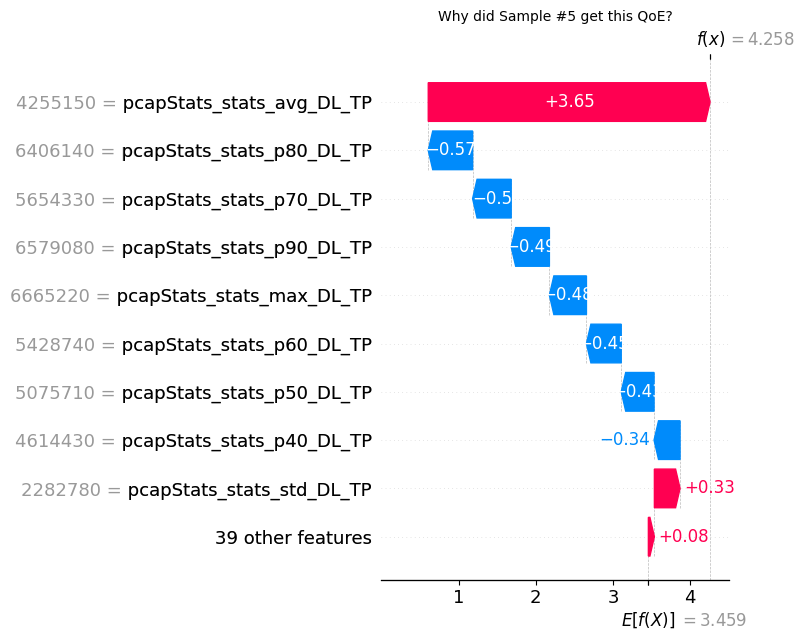

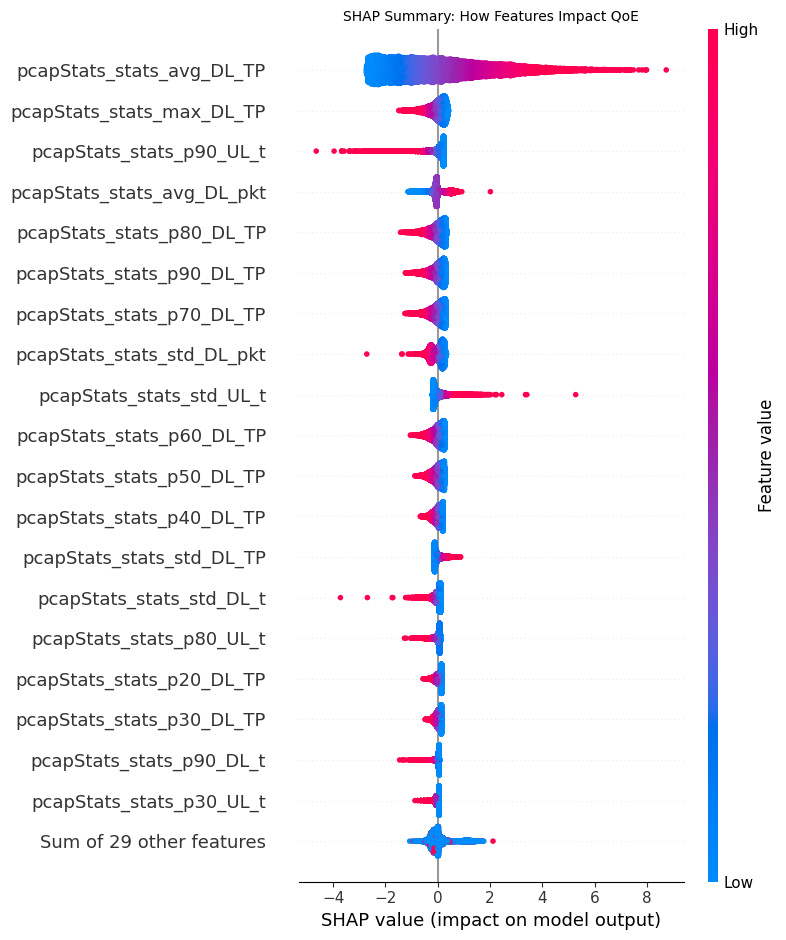

In [ ]:
import shap
import matplotlib.pyplot as plt

# 1. Ensure Model is Trained (Inband Linear Regression)
features = F_inband
target = TARGET_MOS_046

X_train_shap = X_train[features]
X_test_shap  = X_test[features]

model = LinearRegression()
model.fit(X_train_shap, y_train[target])

print("Calculating SHAP values...")

# 2. Create Explainer (Optimized for Linear Models)
# We pass the 'model' object directly, not 'model.predict'
explainer = shap.LinearExplainer(model, X_train_shap)

# 3. Calculate SHAP values for the Test Set
shap_values = explainer(X_test_shap)

# --- Visualization 1: Waterfall Plot (Local Explanation) ---
# Explains why the 6th sample (index 5) got its specific score
plt.figure()
shap.plots.waterfall(shap_values[5], show=False)
plt.title(f"Why did Sample #5 get this QoE?", fontsize=10)
plt.tight_layout()
plt.show()

# --- Visualization 2: Beeswarm Plot (Global Explanation) ---
# This is the most powerful summary. It shows:
# - Importance (Width)
# - Direction (Red = High Feature Value, Blue = Low Feature Value)
plt.figure()
shap.plots.beeswarm(shap_values, max_display=20, show=False)
plt.title("SHAP Summary: How Features Impact QoE", fontsize=10)
plt.tight_layout()
plt.show()

#**QoE score prediction**

Data Cleaned. Rows: 111919 -> 108250
Final Feature Set: 44 features


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ expansion_layer (Dense)         │ (None, 128)            │         5,760 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ compression_layer (Dense)       │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bottleneck_layer (Dense)        │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,129 (63.00 KB)

 Trainable params: 16,129 (63.00 KB)

 Non-trainable params: 0 (0.00 B)


Starting Training...
Epoch 1/100
2165/2165 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 0.7765 - mean_absolute_error: 0.6441 - rmse: 0.8488 - val_loss: 0.4742 - val_mean_absolute_error: 0.5661 - val_rmse: 0.6886
Epoch 2/100
2165/2165 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 0.3201 - mean_absolute_error: 0.4425 - rmse: 0.5657 - val_loss: 0.2826 - val_mean_absolute_error: 0.4164 - val_rmse: 0.5316
Epoch 3/100
2165/2165 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.2947 - mean_absolute_error: 0.4236 - rmse: 0.5428 - val_loss: 0.2940 - val_mean_absolute_error: 0.4450 - val_rmse: 0.5422
Epoch 4/100
2165/2165 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - loss: 0.2863 - mean_absolute_error: 0.4155 - rmse: 0.5351 - val_loss: 0.2717 - val_mean_absolute_error: 0.4096 - val_rmse: 0.5213
Epoch 5/100
2165/2165 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - loss: 0.2809 - mean_absolute_error: 0.4122 - rmse: 0.5300 - val_loss: 0.2848 - val_mean_absolute_error: 0.4303 - val_rmse: 0.5336
Epoch 6/100
2165/2165 ━━━━━━━━━━━━━━━━━━━━

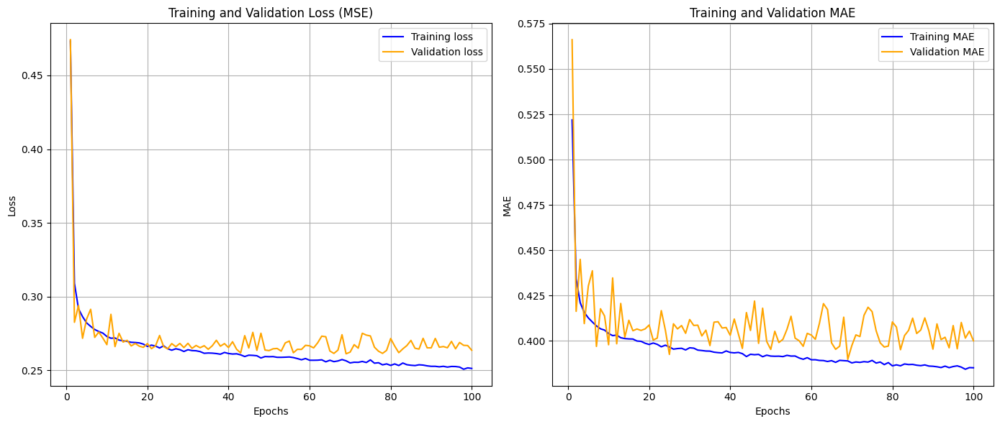


--- Test Set Evaluation ---
Test MSE:  0.2732
Test MAE:  0.4075
Test RMSE: 0.5227


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# TensorFlow / Keras Imports
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import RootMeanSquaredError

# ==========================================
# 1. LOAD & PROCESS DATA
# ==========================================
# (Assuming you have loaded 'df', 'F_outband', and 'F_inband' as before)
# If not, ensure you run the data loading block first.

TARGET_MOS_046 = 'QoE_ITU_046'
target = TARGET_MOS_046

# A. Clean Data: Remove failed sessions (QoE = -1)
df_clean = df[df[target] != -1].copy()
print(f"Data Cleaned. Rows: {len(df)} -> {len(df_clean)}")

# B. Feature Selection: Remove Correlated Inband Features
def get_uncorrelated_features(df, features, target_col, threshold=0.95):
    corr_matrix = df[features].corr().abs()
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
    to_drop = [column for column in upper.columns if any(upper[column] > threshold)]
    return [f for f in features if f not in to_drop]

F_inband_clean = get_uncorrelated_features(df_clean, F_inband, target, threshold=0.95)

# C. Combine Features: Use Outband + Optimized Inband
features_final = F_outband + F_inband_clean
print(f"Final Feature Set: {len(features_final)} features")

# ==========================================
# 2. PREPARE DATASETS
# ==========================================
X = df_clean[features_final]
y = df_clean[target]

# Split: 80% Train, 20% Test (Hold-out)
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Split Train: 80% Training, 20% Validation (for the Learning Curve)
X_train, X_val, y_train, y_val = train_test_split(
    X_train_full, y_train_full, test_size=0.2, random_state=42
)

# Scale Data (Crucial for Neural Networks)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled   = scaler.transform(X_val)
X_test_scaled  = scaler.transform(X_test)

# ==========================================
# 3. DEFINE MODEL (Your Architecture)
# ==========================================
def build_qoe_model(input_shape):
    model = Sequential([
        Dense(128, activation='relu', input_shape=input_shape, name='expansion_layer'),
        Dropout(0.3, name='dropout_1'), # Slightly higher dropout for bigger layer

        Dense(64, activation='relu', name='compression_layer'),
        Dropout(0.2, name='dropout_2'),

        Dense(32, activation='relu', name='bottleneck_layer'),

        Dense(1, activation='linear', name='output_layer')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='mean_squared_error',
        metrics=['mean_absolute_error', RootMeanSquaredError(name='rmse')]
    )
    return model

# Initialize Model
num_features = X_train_scaled.shape[1]
qoe_predictor = build_qoe_model(input_shape=(num_features,))
qoe_predictor.summary()

# ==========================================
# 4. TRAIN MODEL
# ==========================================
print("\nStarting Training...")
history = qoe_predictor.fit(
    X_train_scaled, y_train,
    epochs=100,             # Use enough epochs to let it converge
    batch_size=32,
    validation_data=(X_val_scaled, y_val),
    verbose=1               # Show progress bar
)

# ==========================================
# 5. VISUALIZATION
# ==========================================
history_dict = history.history
epochs = range(1, len(history_dict['loss']) + 1)

plt.figure(figsize=(14, 6))

# Plot A: Loss (MSE)
plt.subplot(1, 2, 1)
plt.plot(epochs, history_dict['loss'], 'b', label='Training loss')
plt.plot(epochs, history_dict['val_loss'], 'orange', label='Validation loss')
plt.title('Training and Validation Loss (MSE)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot B: Mean Absolute Error (MAE)
plt.subplot(1, 2, 2)
plt.plot(epochs, history_dict['mean_absolute_error'], 'b', label='Training MAE')
plt.plot(epochs, history_dict['val_mean_absolute_error'], 'orange', label='Validation MAE')
plt.title('Training and Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# ==========================================
# 6. FINAL EVALUATION
# ==========================================
print("\n--- Test Set Evaluation ---")
test_results = qoe_predictor.evaluate(X_test_scaled, y_test, verbose=0)
print(f"Test MSE:  {test_results[0]:.4f}")
print(f"Test MAE:  {test_results[1]:.4f}")
print(f"Test RMSE: {test_results[2]:.4f}")

In [ ]:
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import numpy as np

# ==========================================
# 7. PERMUTATION IMPORTANCE ANALYSIS (FIXED)
# ==========================================

# A. Define a Wrapper to make Keras compatible with Scikit-Learn
class KerasRegressorWrapper:
    def __init__(self, keras_model):
        self.model = keras_model

    def fit(self, X, y):
        # Dummy method to satisfy sklearn's validation check.
        # It does nothing because the model is already trained.
        pass

    def predict(self, X):
        # Keras returns predictions as [[val], [val]], but sklearn expects [val, val]
        # We flatten the output to a 1D array
        return self.model.predict(X, verbose=0).flatten()

    def score(self, X, y):
        # Permutation importance needs a 'scoring' function to maximize.
        # We use Negative MSE (because maximizing neg_mse = minimizing error)
        preds = self.predict(X)
        return -mean_squared_error(y, preds)

# B. Wrap your trained model
# We use the 'qoe_predictor' you just trained
wrapped_model = KerasRegressorWrapper(qoe_predictor)

print("Calculating Permutation Importance (Shuffling features)...")
print("This may take a moment...")

# C. Calculate Importance
# n_repeats=10 means we shuffle each feature 10 times to get a stable average
results = permutation_importance(
    wrapped_model,
    X_test_scaled,      # Use Test data to see what generalizes best
    y_test,
    n_repeats=10,
    random_state=42,
    n_jobs=1            # Keep n_jobs=1 for Keras stability
)

# D. Process Results for Plotting
# Get the indices that sort the features by importance (Low to High)
sorted_idx = results.importances_mean.argsort()

/tmp/ipython-input-920270009.py:9: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(


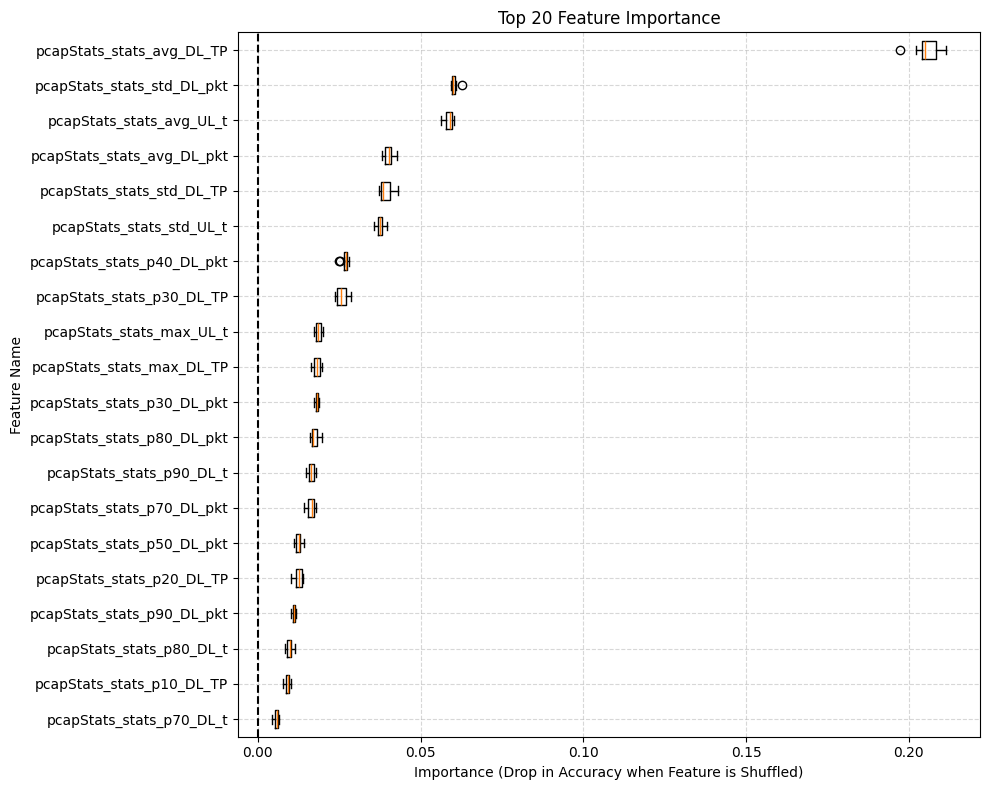

In [ ]:
# Select only the Top 20 features for a cleaner graph
top_n = 20
top_idx = sorted_idx[-top_n:]

# E. Visualization
plt.figure(figsize=(10, 8))

# Create the Boxplot
plt.boxplot(
    results.importances[top_idx].T,
    vert=False,
    labels=X.columns[top_idx] # Map indices back to original column names
)

plt.title(f"Top {top_n} Feature Importance")
plt.xlabel("Importance (Drop in Accuracy when Feature is Shuffled)")
plt.ylabel("Feature Name")
plt.axvline(x=0, color="k", linestyle="--") # Zero line
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler

# ==========================================
# K-FOLD CROSS VALIDATION
# ==========================================

# 1. Configuration
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

# Lists to store results
mse_scores = []
mae_scores = []
rmse_scores = []

# Convert to Numpy Arrays for easier indexing in the loop
X_values = X.values
y_values = y.values

print(f"Starting {n_splits}-Fold Cross-Validation...")

# 2. The Loop
for fold, (train_index, val_index) in enumerate(kf.split(X_values)):

    # A. Split Data for this specific fold
    X_train_fold, X_val_fold = X_values[train_index], X_values[val_index]
    y_train_fold, y_val_fold = y_values[train_index], y_values[val_index]

    # B. Scale Data (Fit on TRAIN, Transform on VAL)
    # This prevents data leakage!
    scaler_cv = StandardScaler()
    X_train_fold_scaled = scaler_cv.fit_transform(X_train_fold)
    X_val_fold_scaled   = scaler_cv.transform(X_val_fold)

    # C. Build a FRESH Model
    # We must rebuild the model to reset all weights
    input_shape = (X_train_fold_scaled.shape[1],)
    model_cv = build_qoe_model(input_shape)

    # D. Train (Silent Mode)
    # We use verbose=0 to avoid printing 100 epochs x 5 folds
    model_cv.fit(
        X_train_fold_scaled, y_train_fold,
        epochs=100,
        batch_size=32,
        verbose=0
    )

    # E. Evaluate
    # Returns [loss, mae, rmse] based on your model compilation
    scores = model_cv.evaluate(X_val_fold_scaled, y_val_fold, verbose=0)

    mse_scores.append(scores[0])
    mae_scores.append(scores[1])
    rmse_scores.append(scores[2])

    print(f"Fold {fold+1}: MSE={scores[0]:.4f} | MAE={scores[1]:.4f} | RMSE={scores[2]:.4f}")

# ==========================================
# 3. REPORTING
# ==========================================
print("\n" + "="*40)
print(f"--- Cross-Validation Results ({n_splits} Folds) ---")
print("="*40)
print(f"Average MSE:  {np.mean(mse_scores):.4f}  (+/- {np.std(mse_scores):.4f})")
print(f"Average MAE:  {np.mean(mae_scores):.4f}  (+/- {np.std(mae_scores):.4f})")
print(f"Average RMSE: {np.mean(rmse_scores):.4f} (+/- {np.std(rmse_scores):.4f})")
print("-" * 40)

# Stability Check
if np.std(mse_scores) < 0.05:
    print("✅ STATUS: Model is STABLE (Results are consistent across folds).")
else:
    print("⚠️ STATUS: Model is UNSTABLE (High variance). You may need more data or stronger Dropout.")

Starting 5-Fold Cross-Validation...


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 1: MSE=0.2703 | MAE=0.3999 | RMSE=0.5199


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 2: MSE=0.2640 | MAE=0.4024 | RMSE=0.5138


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 3: MSE=0.2569 | MAE=0.3900 | RMSE=0.5069


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 4: MSE=0.2632 | MAE=0.3984 | RMSE=0.5130


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Fold 5: MSE=0.2582 | MAE=0.3942 | RMSE=0.5081

--- Cross-Validation Results (5 Folds) ---
Average MSE:  0.2625  (+/- 0.0048)
Average MAE:  0.3970  (+/- 0.0044)
Average RMSE: 0.5124 (+/- 0.0047)
----------------------------------------
✅ STATUS: Model is STABLE (Results are consistent across folds).


In [ ]:
print(mse_scores)
print(np.std(mse_scores))

[0.270346999168396, 0.26400768756866455, 0.25691089034080505, 0.26321807503700256, 0.25821444392204285]
0.0047741059641389005


/tmp/ipython-input-3720796040.py:20: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  bin_mae = results_df.groupby('MOS_Category')['Abs_Error'].mean().reset_index()
/tmp/ipython-input-3720796040.py:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=bin_mae, x='MOS_Category', y='Abs_Error', palette='viridis')


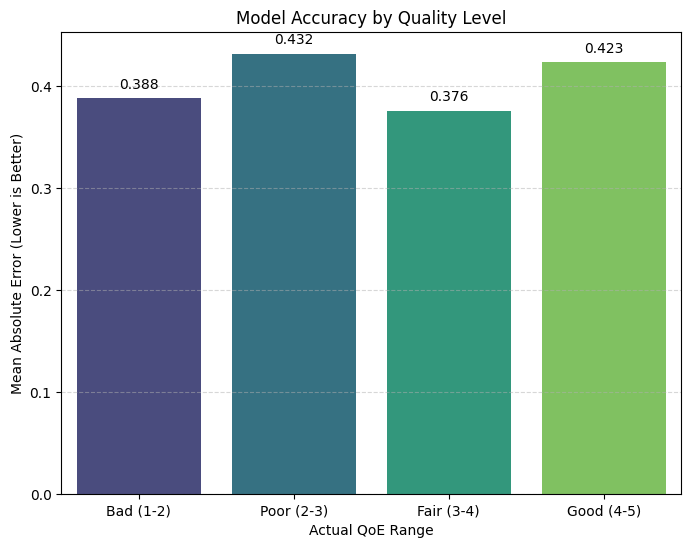

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Create a DataFrame of Actuals and Predictions
results_df = pd.DataFrame({
    'Actual_MOS': y_test,
    'Predicted_MOS': qoe_predictor.predict(X_test_scaled, verbose=0).flatten()
})

# 2. Calculate Error
results_df['Abs_Error'] = abs(results_df['Actual_MOS'] - results_df['Predicted_MOS'])

# 3. Create Bins (1-2, 2-3, 3-4, 4-5)
bins = [1, 2, 3, 4, 5.1]
labels = ['Bad (1-2)', 'Poor (2-3)', 'Fair (3-4)', 'Good (4-5)']
results_df['MOS_Category'] = pd.cut(results_df['Actual_MOS'], bins=bins, labels=labels, right=False)

# 4. Calculate MAE per Bin
bin_mae = results_df.groupby('MOS_Category')['Abs_Error'].mean().reset_index()

# 5. Plot
plt.figure(figsize=(8, 6))
sns.barplot(data=bin_mae, x='MOS_Category', y='Abs_Error', palette='viridis')
plt.title("Model Accuracy by Quality Level")
plt.ylabel("Mean Absolute Error (Lower is Better)")
plt.xlabel("Actual QoE Range")
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Add value labels
for index, row in bin_mae.iterrows():
    plt.text(index, row.Abs_Error + 0.01, f"{row.Abs_Error:.3f}", ha='center', color='black')

plt.show()

In [ ]:
# 1. Sort by biggest error
worst_cases = results_df.sort_values(by='Abs_Error', ascending=False).head(30)

print("--- Top 5 Worst Predictions ---")
print(worst_cases)

# 2. Retrieve the Feature Values for these worst cases
# (Optional: Map back to X_test to see WHY)
worst_indices = worst_cases.index
worst_features = X.iloc[worst_indices] # Use original X dataframe to see real values

print("\n--- Feature Values for the #1 Worst Prediction ---")
print(worst_features.iloc[0])

--- Top 5 Worst Predictions ---
        Actual_MOS  Predicted_MOS  Abs_Error MOS_Category
35129      4.62587       2.161811   2.464059   Good (4-5)
67951      4.66737       2.205411   2.461959   Good (4-5)
85765      4.79356       2.342345   2.451215   Good (4-5)
7293       4.90101       2.491936   2.409074   Good (4-5)
96129      4.82655       2.423103   2.403447   Good (4-5)
76876      4.82151       2.459178   2.362332   Good (4-5)
53361      4.68239       2.321501   2.360889   Good (4-5)
3863       4.11580       1.755555   2.360245   Good (4-5)
2814       4.55680       2.199564   2.357236   Good (4-5)
30012      4.51772       2.249700   2.268020   Good (4-5)
23022      4.48573       2.239766   2.245964   Good (4-5)
34928      4.80738       2.569633   2.237747   Good (4-5)
22249      1.65225       3.879744   2.227494    Bad (1-2)
6832       4.50128       2.309177   2.192103   Good (4-5)
157        4.51071       2.320759   2.189951   Good (4-5)
21084      1.60056       3.787815   2.18

In [ ]:
!pip install shap

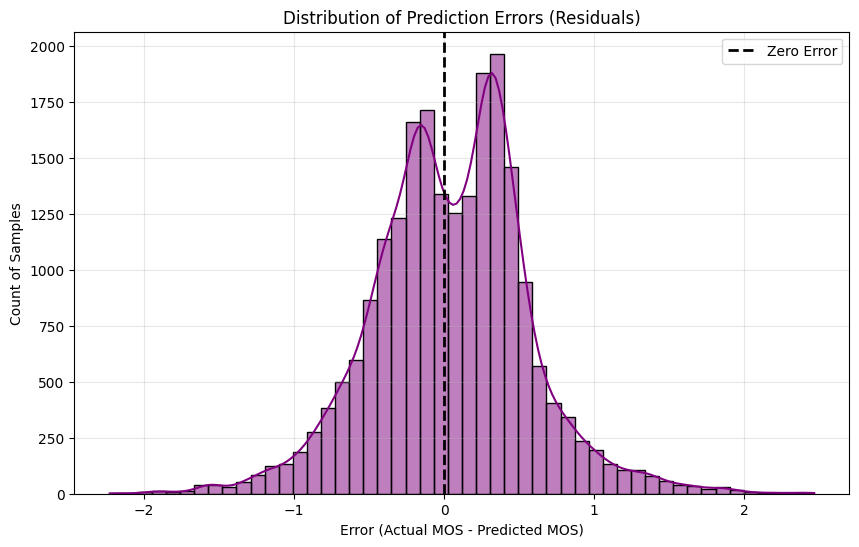

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Generate Predictions (Define y_pred)
# We flatten() it to make sure it's a 1D array like [3.4, 4.1, ...]
y_pred = qoe_predictor.predict(X_test_scaled, verbose=0).flatten()

# 2. Calculate Errors
errors = y_test - y_pred

# 3. Plot the Distribution
plt.figure(figsize=(10, 6))
sns.histplot(errors, kde=True, color='purple', bins=50)

# Add a vertical line at 0 (Perfect Prediction)
plt.axvline(x=0, color='k', linestyle='--', linewidth=2, label='Zero Error')

plt.title("Distribution of Prediction Errors (Residuals)")
plt.xlabel("Error (Actual MOS - Predicted MOS)")
plt.ylabel("Count of Samples")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

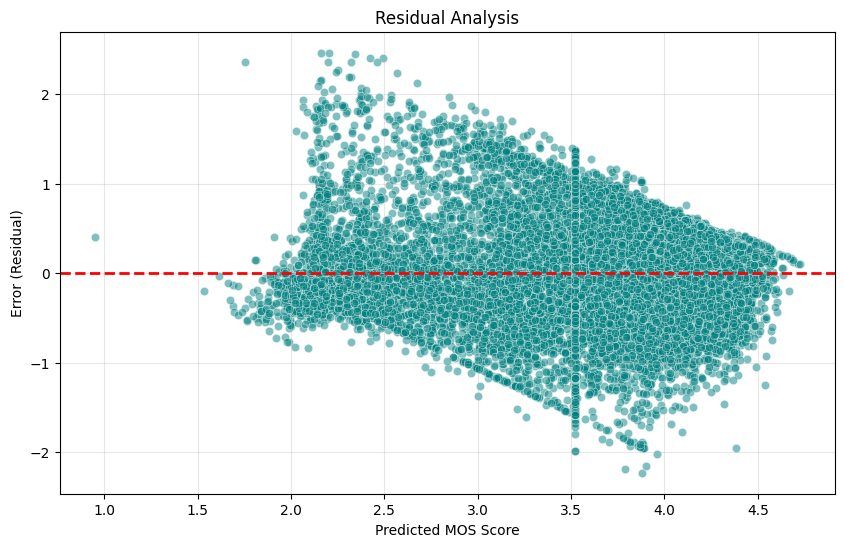

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Generate Data
y_pred = qoe_predictor.predict(X_test_scaled, verbose=0).flatten()
residuals = y_test - y_pred

# 2. Plot Residuals vs. Predicted Values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred, y=residuals, alpha=0.5, color='teal')

# Add reference line at 0
plt.axhline(0, color='red', linestyle='--', linewidth=2)

plt.title("Residual Analysis")
plt.xlabel("Predicted MOS Score")
plt.ylabel("Error (Residual)")
plt.grid(True, alpha=0.3)
plt.show()

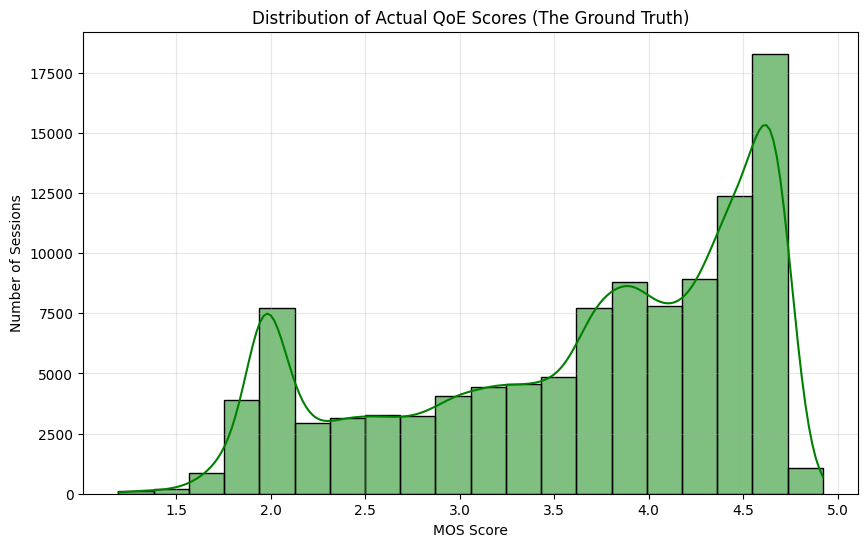

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# Plot the distribution of the ACTUAL QoE scores (Target)
sns.histplot(y, kde=True, color='green', bins=20)

plt.title("Distribution of Actual QoE Scores (The Ground Truth)")
plt.xlabel("MOS Score")
plt.ylabel("Number of Sessions")
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
average_mos = y.mean()

print(f"Average MOS Score: {average_mos:.4f}")

Average MOS Score: 3.6297


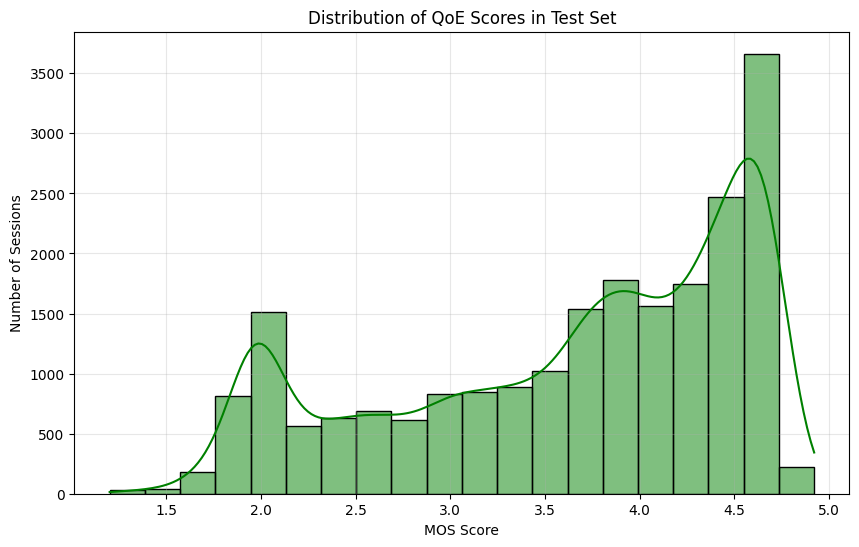

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

# Plot the distribution of the ACTUAL QoE scores (Target)
sns.histplot(y_test, kde=True, color='green', bins=20)

plt.title("Distribution of QoE Scores in Test Set")
plt.xlabel("MOS Score")
plt.ylabel("Number of Sessions")
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
average_mos = y_test.mean()

print(f"Average MOS Score: {average_mos:.4f}")

Average MOS Score: 3.6305


**Fix the model**

Data Cleaned. Rows: 111919 -> 108250
Target variable has been Log-Transformed.

Original Training Size: 69280

Starting Training...
Epoch 1/20


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


3201/3201 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.2513 - mean_squared_error: 0.1334 - val_loss: 0.1411 - val_mean_squared_error: 0.0389
Epoch 2/20
3201/3201 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.1360 - mean_squared_error: 0.0341 - val_loss: 0.1264 - val_mean_squared_error: 0.0317
Epoch 3/20
3201/3201 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.1300 - mean_squared_error: 0.0316 - val_loss: 0.1237 - val_mean_squared_error: 0.0316
Epoch 4/20
3201/3201 ━━━━━━━━━━━━━━━━━━━━ 8s 3ms/step - loss: 0.1281 - mean_squared_error: 0.0312 - val_loss: 0.1267 - val_mean_squared_error: 0.0318
Epoch 5/20
3201/3201 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 0.1262 - mean_squared_error: 0.0305 - val_loss: 0.1207 - val_mean_squared_error: 0.0311
Epoch 6/20
3201/3201 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.1262 - mean_squared_error: 0.0305 - val_loss: 0.1193 - val_mean_squared_error: 0.0309
Epoch 7/20
3201/3201 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 0.1242 - mean_squared_error: 0.0296 - val_los

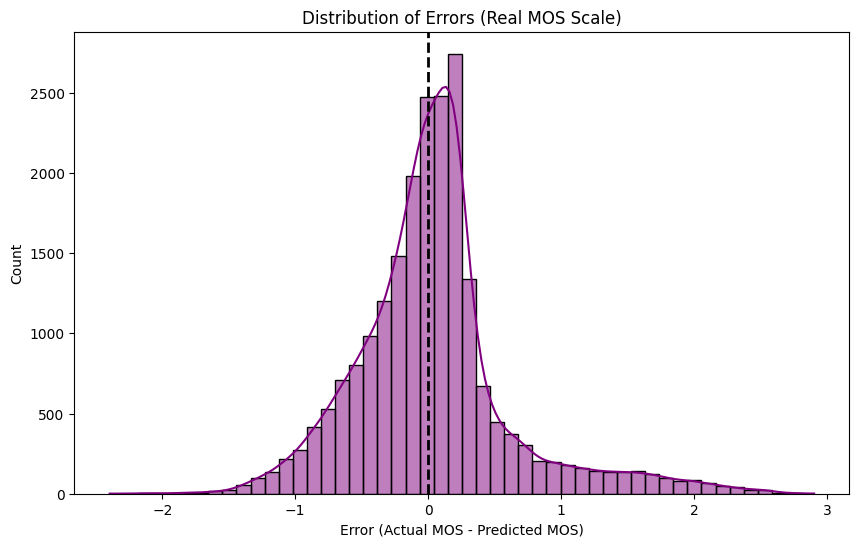

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample

# TensorFlow / Keras Imports
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import RootMeanSquaredError

# ==========================================
# 1. LOAD & PROCESS DATA
# ==========================================
TARGET_MOS_046 = 'QoE_ITU_046'
target = TARGET_MOS_046

# A. Clean Data: Remove failed sessions
df_clean = df[df[target] != -1].copy()
print(f"Data Cleaned. Rows: {len(df)} -> {len(df_clean)}")

# --- STEP 1: LOG TRANSFORM THE TARGET ---
# We transform the MOS score to Log-Scale.
# This expands the distance between low scores (1-2) and compresses high scores (4-5).
df_clean[target] = np.log(df_clean[target])
print("Target variable has been Log-Transformed.")

features_final = F_outband + F_inband
X = df_clean[features_final]
y = df_clean[target]

# ==========================================
# 2. SPLIT & OVERSAMPLE
# ==========================================
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

X_train_raw, X_val, y_train_raw, y_val = train_test_split(
    X_train_full, y_train_full, test_size=0.2, random_state=42
)

# --- START OVERSAMPLING BLOCK ---
print(f"\nOriginal Training Size: {len(X_train_raw)}")

# Combine X and y temporarily
train_data = pd.concat([X_train_raw, y_train_raw], axis=1)

# Define Threshold (Must use LOG value now!)
# log(3.0) approx 1.098
log_minority_threshold = np.log(3.0)

df_majority = train_data[train_data[target] >= log_minority_threshold]
df_minority = train_data[train_data[target] < log_minority_threshold]

# Upsample minority class
df_minority_upsampled = resample(df_minority,
                                 replace=True,
                                 n_samples=len(df_majority),
                                 random_state=42)

df_upsampled = pd.concat([df_majority, df_minority_upsampled])
df_upsampled = df_upsampled.sample(frac=1, random_state=42).reset_index(drop=True)

X_train = df_upsampled[features_final]
y_train = df_upsampled[target]

# Add Jitter
noise = np.random.normal(0, 0.01, X_train.shape)
X_train = X_train + noise
# --- END OVERSAMPLING BLOCK ---

# ==========================================
# 3. SCALE DATA
# ==========================================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled   = scaler.transform(X_val)
X_test_scaled  = scaler.transform(X_test)

# ==========================================
# 4. DEFINE MODEL
# ==========================================
def build_qoe_model(input_shape):
    model = Sequential([
        Dense(64, activation='relu', input_shape=input_shape),
        Dropout(0.2),
        Dense(32, activation='relu'),
        Dropout(0.2),
        Dense(1, activation='linear')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='mean_absolute_error', # MAE on Log-Scale is very robust
        metrics=['mean_squared_error']
    )
    return model

qoe_predictor = build_qoe_model(input_shape=(X_train_scaled.shape[1],))

# ==========================================
# 5. TRAIN MODEL
# ==========================================
print("\nStarting Training...")
history = qoe_predictor.fit(
    X_train_scaled, y_train,
    epochs=20,
    batch_size=32,
    validation_data=(X_val_scaled, y_val),
    verbose=1
)

# ==========================================
# 6. VISUALIZATION & INVERSE TRANSFORM
# ==========================================
# Get predictions (These are in LOG scale)
y_pred_log = qoe_predictor.predict(X_test_scaled).flatten()

# --- STEP 2: INVERSE TRANSFORM ---
# Convert everything back to real MOS (1-5) scale
y_pred_real = np.exp(y_pred_log)
y_test_real = np.exp(y_test)

# Calculate Metrics on the REAL scale
from sklearn.metrics import mean_squared_error, mean_absolute_error

test_mse = mean_squared_error(y_test_real, y_pred_real)
test_mae = mean_absolute_error(y_test_real, y_pred_real)
test_rmse = np.sqrt(test_mse)

print("\n--- Test Set Evaluation (Original MOS Scale) ---")
print(f"Test MSE:  {test_mse:.4f}")
print(f"Test MAE:  {test_mae:.4f}")
print(f"Test RMSE: {test_rmse:.4f}")

# Plot Residuals on Real Scale
residuals = y_test_real - y_pred_real

plt.figure(figsize=(10, 6))
sns.histplot(residuals, bins=50, kde=True, color='purple')
plt.axvline(x=0, color='black', linestyle='--', linewidth=2)
plt.title('Distribution of Errors (Real MOS Scale)')
plt.xlabel('Error (Actual MOS - Predicted MOS)')
plt.show()

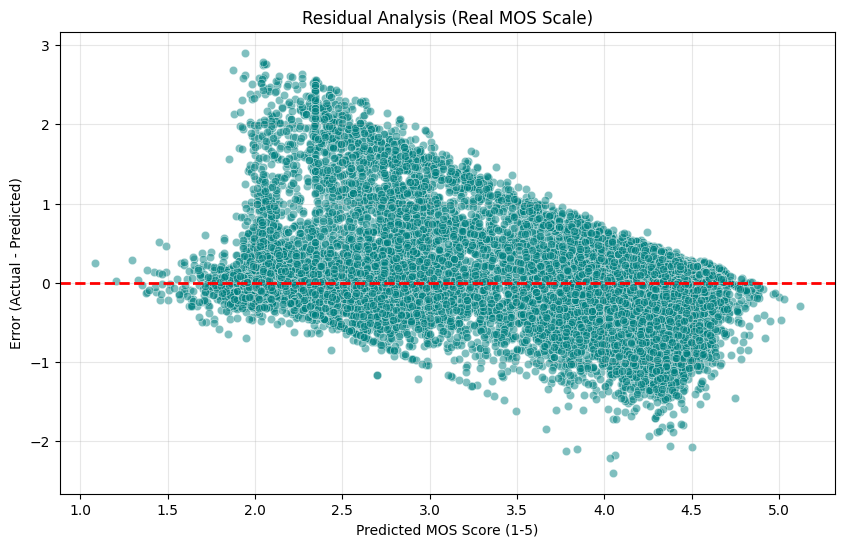

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np  # Needed for exp()

# 1. Generate Predictions (Currently in LOG Scale)
y_pred_log = qoe_predictor.predict(X_test_scaled, verbose=0).flatten()

# 2. INVERSE TRANSFORM: Convert Log Scale -> Real MOS (1-5)
y_pred_real = np.exp(y_pred_log)
y_test_real = np.exp(y_test)  # Assuming y_test was also log-scaled during split

# 3. Calculate Residuals on the REAL Scale
residuals_real = y_test_real - y_pred_real

# 4. Plot Residuals vs. Predicted Values
plt.figure(figsize=(10, 6))

# We plot 'y_pred_real' on X-axis so we see errors across the 1-5 score range
sns.scatterplot(x=y_pred_real, y=residuals_real, alpha=0.5, color='teal')

# Add reference line at 0 (Perfect Prediction)
plt.axhline(0, color='red', linestyle='--', linewidth=2)

plt.title("Residual Analysis (Real MOS Scale)")
plt.xlabel("Predicted MOS Score (1-5)")
plt.ylabel("Error (Actual - Predicted)")
plt.grid(True, alpha=0.3)
plt.show()

Data Cleaned. Rows: 111919 -> 108250
Final Feature Set: 53 features

Original Training Size: 69280
Applying Oversampling to Training Set...
New Training Size after Oversampling: 102406


/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ expansion_layer (Dense)         │ (None, 64)             │         3,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ compression_layer (Dense)       │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,569 (21.75 KB)

 Trainable params: 5,569 (21.75 KB)

 Non-trainable params: 0 (0.00 B)


Starting Training...
Epoch 1/20
3201/3201 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step - loss: 0.7619 - mean_absolute_error: 0.7619 - mse: 1.1955 - rmse: 1.0338 - val_loss: 0.4604 - val_mean_absolute_error: 0.4604 - val_mse: 0.4041 - val_rmse: 0.6357
Epoch 2/20
3201/3201 ━━━━━━━━━━━━━━━━━━━━ 11s 4ms/step - loss: 0.4619 - mean_absolute_error: 0.4619 - mse: 0.4019 - rmse: 0.6338 - val_loss: 0.4287 - val_mean_absolute_error: 0.4287 - val_mse: 0.3619 - val_rmse: 0.6016
Epoch 3/20
3201/3201 ━━━━━━━━━━━━━━━━━━━━ 9s 3ms/step - loss: 0.4128 - mean_absolute_error: 0.4128 - mse: 0.3351 - rmse: 0.5788 - val_loss: 0.4455 - val_mean_absolute_error: 0.4455 - val_mse: 0.3807 - val_rmse: 0.6170
Epoch 4/20
3201/3201 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - loss: 0.4003 - mean_absolute_error: 0.4003 - mse: 0.3207 - rmse: 0.5663 - val_loss: 0.4131 - val_mean_absolute_error: 0.4131 - val_mse: 0.3365 - val_rmse: 0.5801
Epoch 5/20
3201/3201 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - loss: 0.3922 - mean_absolute_error: 0.3922 - m

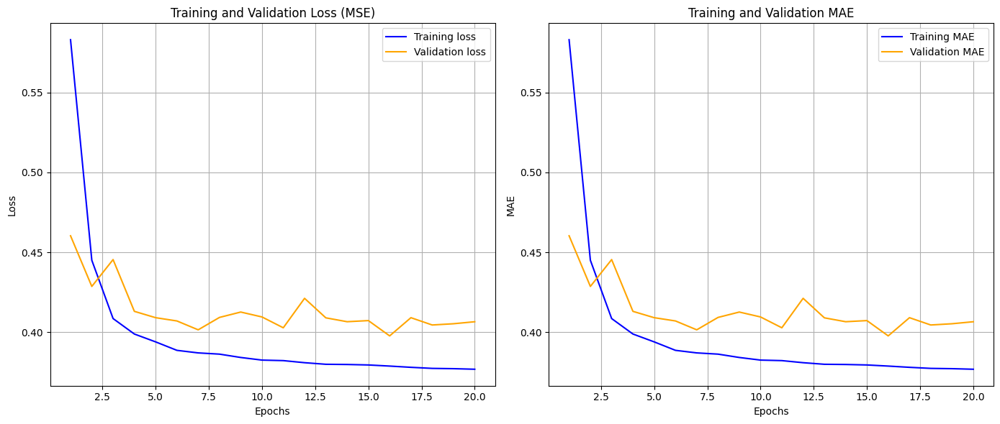


--- Test Set Evaluation ---
Test MSE:  0.4168
Test MAE:  0.4168
Test RMSE: 0.5875


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample # Helper for resampling

# TensorFlow / Keras Imports
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import RootMeanSquaredError

# ==========================================
# 1. LOAD & PROCESS DATA
# ==========================================
# (Assuming you have loaded 'df', 'F_outband', and 'F_inband' as before)
# If not, ensure you run the data loading block first.

TARGET_MOS_046 = 'QoE_ITU_046'
target = TARGET_MOS_046

# A. Clean Data: Remove failed sessions (QoE = -1)
df_clean = df[df[target] != -1].copy()
print(f"Data Cleaned. Rows: {len(df)} -> {len(df_clean)}")

# C. Combine Features: Use Outband + Inband
features_final = F_outband + F_inband
print(f"Final Feature Set: {len(features_final)} features")

X = df_clean[features_final]
y = df_clean[target]

# ==========================================
# 2. SPLIT & OVERSAMPLE (The Fix)
# ==========================================

# 1. First Split: Create the Hold-out Test Set (REAL WORLD DATA - DO NOT TOUCH)
X_train_full, X_test, y_train_full, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# 2. Second Split: Create Validation Set (REAL WORLD DATA - DO NOT TOUCH)
X_train_raw, X_val, y_train_raw, y_val = train_test_split(
    X_train_full, y_train_full, test_size=0.2, random_state=42
)

# --- START OVERSAMPLING BLOCK ---
print(f"\nOriginal Training Size: {len(X_train_raw)}")
print("Applying Oversampling to Training Set...")

# Combine X and y temporarily to make resampling easier
train_data = pd.concat([X_train_raw, y_train_raw], axis=1)

# Define "Minority" (Bad QoE) vs "Majority" (Good QoE)
# Threshold: We assume anything below 3.0 is the 'minority' we need to boost
minority_threshold = 3.0

df_majority = train_data[train_data[target] >= minority_threshold]
df_minority = train_data[train_data[target] < minority_threshold]

# Upsample minority class
df_minority_upsampled = resample(df_minority,
                                 replace=True,     # Sample with replacement
                                 n_samples=len(df_majority),    # Match majority class size
                                 random_state=42)

# Combine majority and upsampled minority
df_upsampled = pd.concat([df_majority, df_minority_upsampled])

# Shuffle the data so the model doesn't learn order
df_upsampled = df_upsampled.sample(frac=1, random_state=42).reset_index(drop=True)

# Separate X and y again
X_train = df_upsampled[features_final]
y_train = df_upsampled[target]

# OPTIONAL: Add slight noise (Jitter) to the duplicates
# This prevents the Neural Network from just memorizing the exact duplicated rows
noise = np.random.normal(0, 0.01, X_train.shape)
X_train = X_train + noise

print(f"New Training Size after Oversampling: {len(X_train)}")
# --- END OVERSAMPLING BLOCK ---


# ==========================================
# 3. SCALE DATA
# ==========================================
scaler = StandardScaler()

# Fit scaler ONLY on the training data (even the upsampled one is fine)
X_train_scaled = scaler.fit_transform(X_train)

# Transform Validation and Test using the training scaler
X_val_scaled   = scaler.transform(X_val)
X_test_scaled  = scaler.transform(X_test)

# ==========================================
# 3. DEFINE MODEL (Your Architecture)
# ==========================================
def build_qoe_model(input_shape):
    model = Sequential([
        Dense(64, activation='relu', input_shape=input_shape, name='expansion_layer'),
        Dropout(0.2, name='dropout_1'), # Slightly higher dropout for bigger layer

        Dense(32, activation='relu', name='compression_layer'),
        Dropout(0.2, name='dropout_2'),

        Dense(1, activation='linear', name='output_layer')
    ])

    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='mean_absolute_error',
        metrics=['mean_absolute_error', RootMeanSquaredError(name='rmse'),'mse']
    )
    return model

# Initialize Model
num_features = X_train_scaled.shape[1]
qoe_predictor = build_qoe_model(input_shape=(num_features,))
qoe_predictor.summary()

# ==========================================
# 4. TRAIN MODEL
# ==========================================
print("\nStarting Training...")
history = qoe_predictor.fit(
    X_train_scaled, y_train,
    epochs=20,             # Use enough epochs to let it converge
    batch_size=32,
    validation_data=(X_val_scaled, y_val),
    verbose=1               # Show progress bar
)

# ==========================================
# 5. VISUALIZATION
# ==========================================
history_dict = history.history
epochs = range(1, len(history_dict['loss']) + 1)

plt.figure(figsize=(14, 6))

# Plot A: Loss (MSE)
plt.subplot(1, 2, 1)
plt.plot(epochs, history_dict['loss'], 'b', label='Training loss')
plt.plot(epochs, history_dict['val_loss'], 'orange', label='Validation loss')
plt.title('Training and Validation Loss (MSE)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Plot B: Mean Absolute Error (MAE)
plt.subplot(1, 2, 2)
plt.plot(epochs, history_dict['mean_absolute_error'], 'b', label='Training MAE')
plt.plot(epochs, history_dict['val_mean_absolute_error'], 'orange', label='Validation MAE')
plt.title('Training and Validation MAE')
plt.xlabel('Epochs')
plt.ylabel('MAE')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# ==========================================
# 6. FINAL EVALUATION
# ==========================================
print("\n--- Test Set Evaluation ---")
test_results = qoe_predictor.evaluate(X_test_scaled, y_test, verbose=0)
print(f"Test MSE:  {test_results[0]:.4f}")
print(f"Test MAE:  {test_results[1]:.4f}")
print(f"Test RMSE: {test_results[2]:.4f}")

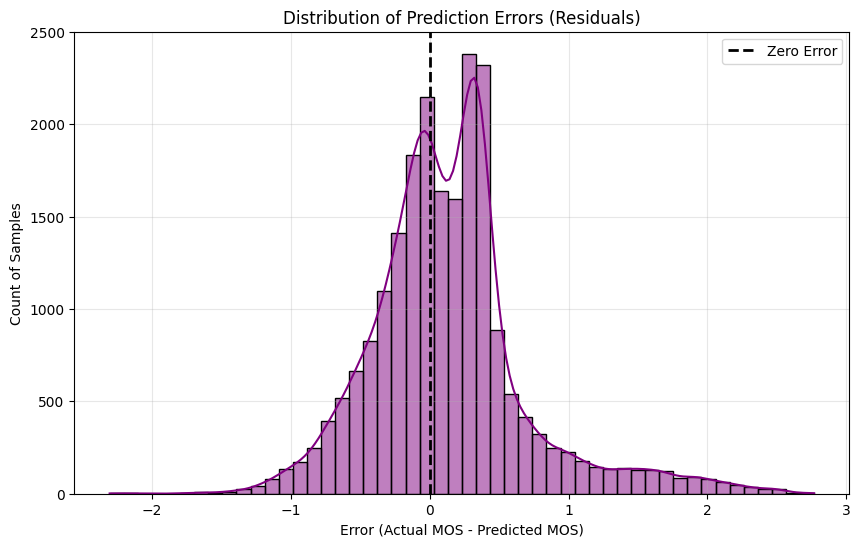

In [ ]:
# 1. Generate Predictions (Define y_pred)
# We flatten() it to make sure it's a 1D array like [3.4, 4.1, ...]
y_pred = qoe_predictor.predict(X_test_scaled, verbose=0).flatten()

# 2. Calculate Errors
errors = y_test - y_pred

# 3. Plot the Distribution
plt.figure(figsize=(10, 6))
sns.histplot(errors, kde=True, color='purple', bins=50)

# Add a vertical line at 0 (Perfect Prediction)
plt.axvline(x=0, color='k', linestyle='--', linewidth=2, label='Zero Error')

plt.title("Distribution of Prediction Errors (Residuals)")
plt.xlabel("Error (Actual MOS - Predicted MOS)")
plt.ylabel("Count of Samples")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

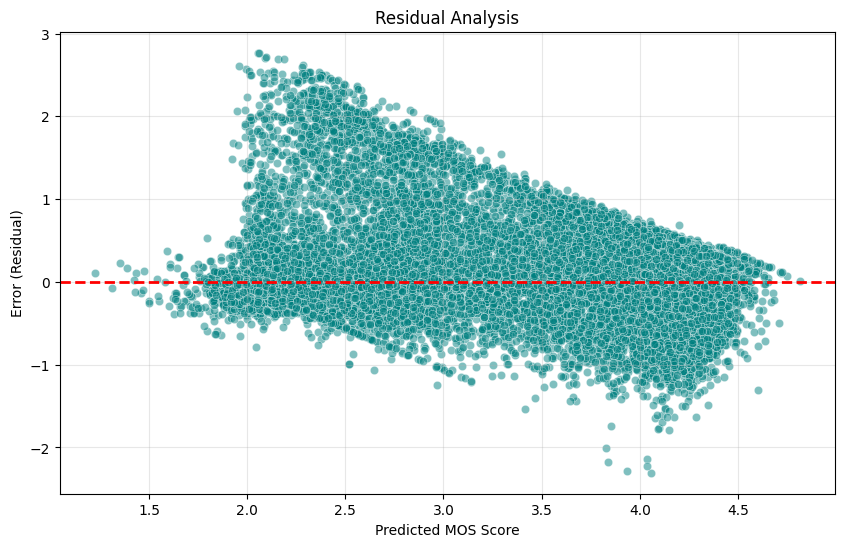

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# 1. Generate Data
y_pred = qoe_predictor.predict(X_test_scaled, verbose=0).flatten()
residuals = y_test - y_pred

# 2. Plot Residuals vs. Predicted Values
plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_pred, y=residuals, alpha=0.5, color='teal')

# Add reference line at 0
plt.axhline(0, color='red', linestyle='--', linewidth=2)

plt.title("Residual Analysis")
plt.xlabel("Predicted MOS Score")
plt.ylabel("Error (Residual)")
plt.grid(True, alpha=0.3)
plt.show()

In [ ]:
!pip install xgboost

Class Distribution:
QoE_ITU_046
2    0.486143
1    0.274171
0    0.239686
Name: proportion, dtype: float64

Training Classifier...
[0]	validation_0-mlogloss:1.04015
[100]	validation_0-mlogloss:0.61299
[200]	validation_0-mlogloss:0.60166
[300]	validation_0-mlogloss:0.59918
[400]	validation_0-mlogloss:0.59801
[444]	validation_0-mlogloss:0.59816

--- Classification Report ---
              precision    recall  f1-score   support

 Bad (1-2.9)       0.80      0.82      0.81      5189
Fair (3-3.9)       0.61      0.43      0.51      5936
Good (4.0-5)       0.75      0.87      0.80     10525

    accuracy                           0.74     21650
   macro avg       0.72      0.71      0.71     21650
weighted avg       0.73      0.74      0.72     21650



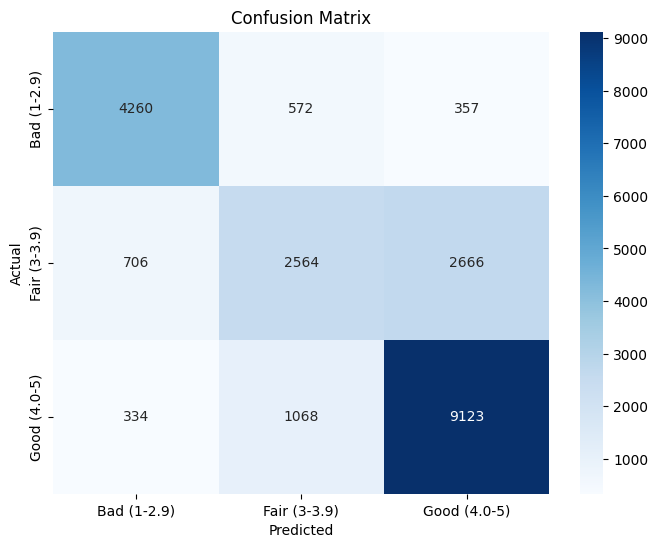

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder

# ==========================================
# 1. PREPARE DATA & DEFINE CLASSES
# ==========================================
# (Assuming X and y are already loaded from previous steps)

# Define the Bins
# 0 = Bad (1.0 to 2.9)
# 1 = Fair (3.0 to 3.7)
# 2 = Good (3.8 to 5.0)
bins = [0, 2.9, 3.9, 5.0]
labels = [0, 1, 2] # 0=Bad, 1=Fair, 2=Good

# Create a new target variable 'y_class'
y_class = pd.cut(y, bins=bins, labels=labels, include_lowest=True)

# Check distribution
print("Class Distribution:")
print(y_class.value_counts(normalize=True))

# Convert to integer for XGBoost
le = LabelEncoder()
y_class = le.fit_transform(y_class)

# Split Data (Stratified to keep class ratios consistent)
X_train, X_test, y_train, y_test = train_test_split(
    X, y_class, test_size=0.2, random_state=42, stratify=y_class
)

# ==========================================
# 2. TRAIN CLASSIFIER
# ==========================================
print("\nTraining Classifier...")

clf = xgb.XGBClassifier(
    objective='multi:softprob', # Multiclass classification
    num_class=3,                # Number of classes
    n_estimators=1000,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    n_jobs=-1,
    random_state=42,
    eval_metric='mlogloss',
    early_stopping_rounds=50
)

# We need a validation set for early stopping
X_tr, X_val, y_tr, y_val = train_test_split(X_train, y_train, test_size=0.1, stratify=y_train)

clf.fit(
    X_tr, y_tr,
    eval_set=[(X_val, y_val)],
    verbose=100
)

# ==========================================
# 3. EVALUATE
# ==========================================
y_pred = clf.predict(X_test)

# Print Report
target_names = ['Bad (1-2.9)', 'Fair (3-3.9)', 'Good (4.0-5)']
print("\n--- Classification Report ---")
print(classification_report(y_test, y_pred, target_names=target_names))

# ==========================================
# 4. VISUALIZE CONFUSION MATRIX
# ==========================================
cm = confusion_matrix(y_test, y_pred)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

Class Distribution:
QoE_ITU_046
2    0.486143
1    0.274171
0    0.239686
Name: proportion, dtype: float64
Training with Class Weights...
[0]	validation_0-mlogloss:1.06961
[100]	validation_0-mlogloss:0.63034
[200]	validation_0-mlogloss:0.61910
[300]	validation_0-mlogloss:0.61578
[400]	validation_0-mlogloss:0.61380
[500]	validation_0-mlogloss:0.61296
[600]	validation_0-mlogloss:0.61259
[700]	validation_0-mlogloss:0.61257
[800]	validation_0-mlogloss:0.61240
[900]	validation_0-mlogloss:0.61235
[999]	validation_0-mlogloss:0.61291

--- Classification Report (Weighted) ---
              precision    recall  f1-score   support

         Bad       0.77      0.84      0.80      5189
        Fair       0.54      0.56      0.55      5936
        Good       0.80      0.75      0.77     10525

    accuracy                           0.72     21650
   macro avg       0.70      0.72      0.71     21650
weighted avg       0.72      0.72      0.72     21650

New Confusion Matrix:
 [[4376  637  176]
 [ 8

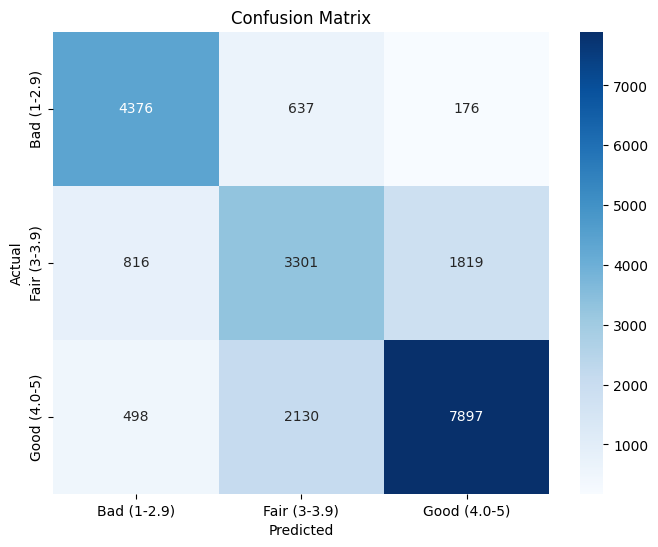

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.utils.class_weight import compute_sample_weight

# ==========================================
# 1. PREPARE DATA & DEFINE CLASSES
# ==========================================
# (Assuming X and y are already loaded from previous steps)

# Define the Bins
# 0 = Bad (1.0 to 2.9)
# 1 = Fair (3.0 to 3.7)
# 2 = Good (3.8 to 5.0)
bins = [0, 2.9, 3.9, 5.0]
labels = [0, 1, 2] # 0=Bad, 1=Fair, 2=Good

# Create a new target variable 'y_class'
y_class = pd.cut(y, bins=bins, labels=labels, include_lowest=True)

# Check distribution
print("Class Distribution:")
print(y_class.value_counts(normalize=True))

# Convert to integer for XGBoost
le = LabelEncoder()
y_class = le.fit_transform(y_class)

# Split Data (Stratified to keep class ratios consistent)
X_train, X_test, y_train, y_test = train_test_split(
    X, y_class, test_size=0.2, random_state=42, stratify=y_class
)

sample_weights = compute_sample_weight(
    class_weight='balanced',
    y=y_tr  # Your training targets
)

# 2. Train with weights
print("Training with Class Weights...")
clf = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=3,
    n_estimators=1000,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    n_jobs=-1,
    random_state=42,
    eval_metric='mlogloss'
)

clf.fit(
    X_tr, y_tr,
    sample_weight=sample_weights,  # <--- PASS WEIGHTS HERE
    eval_set=[(X_val, y_val)],
    verbose=100
)

# 3. Evaluate Again
y_pred_weighted = clf.predict(X_test)
print("\n--- Classification Report (Weighted) ---")
print(classification_report(y_test, y_pred_weighted, target_names=['Bad', 'Fair', 'Good']))

# Check the confusion matrix for "Fair" (Middle Row)
cm = confusion_matrix(y_test, y_pred_weighted)
print("New Confusion Matrix:\n", cm)

plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

--- Step 1: Processing Data ---
Class Distribution:
 0    0.239686
1    0.274171
2    0.486143
Name: proportion, dtype: float64
Training Set Size: 86600
Test Set Size:     21650

--- Step 2: Hyperparameter Tuning ---
Fitting 3 folds for each of 24 candidates, totalling 72 fits
Best Parameters found: {'gamma': 0, 'learning_rate': 0.1, 'max_depth': 6, 'min_child_weight': 1}

--- Step 3: Final Evaluation ---

Classification Report:
              precision    recall  f1-score   support

 Bad (0-2.9)       0.76      0.86      0.80      5189
Fair (3-3.9)       0.54      0.55      0.54      5936
  Good (4-5)       0.80      0.74      0.77     10525

    accuracy                           0.71     21650
   macro avg       0.70      0.71      0.70     21650
weighted avg       0.72      0.71      0.71     21650



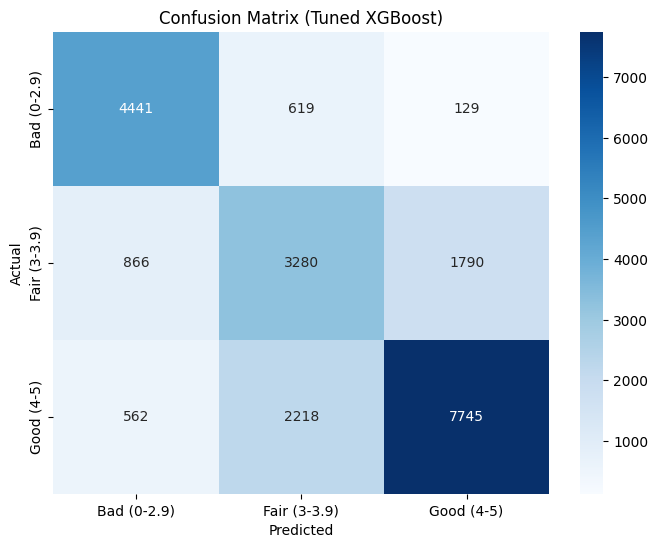


--- Step 4: ROC & AUC Analysis ---
Overall Model AUC (Macro Average): 0.8741


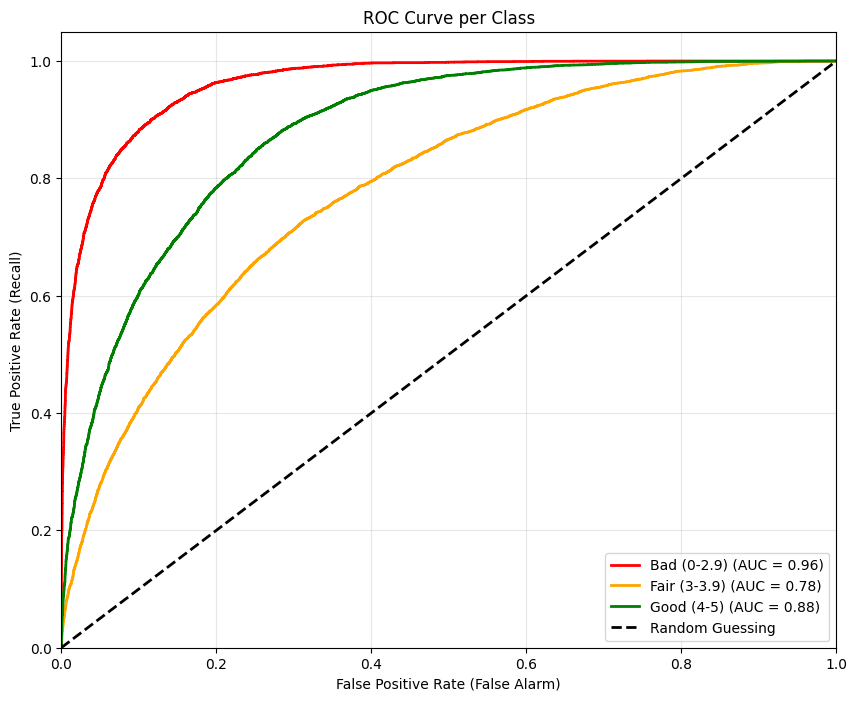

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import LabelEncoder, label_binarize
from sklearn.utils.class_weight import compute_sample_weight
from itertools import cycle

# ==========================================
# 1. PREPARE DATA & DEFINE CLASSES
# ==========================================
# Assuming 'X' (features) and 'y' (continuous MOS score) are already loaded in your environment.
# If not, ensure you load them before running this block.

print("--- Step 1: Processing Data ---")

# Define the Bins based on your preference
# 0 = Bad (0 - 2.9)
# 1 = Fair (3.0 - 3.9)
# 2 = Good (4.0 - 5.0)
bins = [-1, 2.9, 3.9, 5.0]  # Start at -1 to include 0
labels = [0, 1, 2]          # 0=Bad, 1=Fair, 2=Good
class_names = ['Bad (0-2.9)', 'Fair (3-3.9)', 'Good (4-5)']

# Create discrete target variable
y_class = pd.cut(y, bins=bins, labels=labels, include_lowest=True)

# Encode to integers (just to be safe)
le = LabelEncoder()
y_encoded = le.fit_transform(y_class)

# Check distribution
print("Class Distribution:\n", pd.Series(y_encoded).value_counts(normalize=True).sort_index())

# Split Data (Stratified to maintain class ratios)
X_train, X_test, y_train, y_test = train_test_split(
    X, y_encoded, test_size=0.2, random_state=42, stratify=y_encoded
)

# Compute Sample Weights (Crucial for the "Fair" class)
# This gives higher weight to rare classes automatically
sample_weights = compute_sample_weight(
    class_weight='balanced',
    y=y_train
)

print(f"Training Set Size: {len(X_train)}")
print(f"Test Set Size:     {len(X_test)}")

# ==========================================
# 2. HYPERPARAMETER TUNING (Grid Search)
# ==========================================
print("\n--- Step 2: Hyperparameter Tuning ---")

# Define the grid of parameters to test
# We keep n_estimators low (200) for the search to be faster,
# but you can increase it for the final model.
param_grid = {
    'max_depth': [4, 6],              # Control complexity
    'learning_rate': [0.05, 0.1],     # Step size
    'gamma': [0, 0.1, 0.5],           # Regularization to prevent overfitting
    'min_child_weight': [1, 3]        # Minimum sum of instance weight needed in a child
}

# Initialize Base Model
xgb_clf = xgb.XGBClassifier(
    objective='multi:softprob',
    num_class=3,
    n_estimators=200,
    subsample=0.8,
    colsample_bytree=0.8,
    n_jobs=-1,
    random_state=42,
    eval_metric='mlogloss'
)

# Setup Grid Search
# We use 'f1_weighted' to optimize for a balance of precision/recall across all classes
grid_search = GridSearchCV(
    estimator=xgb_clf,
    param_grid=param_grid,
    scoring='f1_weighted',
    cv=3,
    verbose=1
)

# Run Search (Pass weights here!)
# Note: sample_weight is passed via fit_params logic in newer scikit-learn/xgboost versions,
# but passing it directly to fit() usually works for the internal cross-validation split if handled correctly.
# To be robust with GridSearchCV, we fit on the weighted data implicitly or rely on the final refit.
grid_search.fit(X_train, y_train, sample_weight=sample_weights)

print("Best Parameters found:", grid_search.best_params_)
best_model = grid_search.best_estimator_

# ==========================================
# 3. FINAL EVALUATION
# ==========================================
print("\n--- Step 3: Final Evaluation ---")

# Predict Classes
y_pred = best_model.predict(X_test)

# Predict Probabilities (Needed for AUC)
y_prob = best_model.predict_proba(X_test)

# A. Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred, target_names=class_names))

# B. Confusion Matrix Plot
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Tuned XGBoost)')
plt.show()

# ==========================================
# 4. ROC CURVE & AUC ANALYSIS
# ==========================================
print("\n--- Step 4: ROC & AUC Analysis ---")

# Binarize the test labels for One-vs-Rest calculation
y_test_bin = label_binarize(y_test, classes=[0, 1, 2])
n_classes = y_test_bin.shape[1]

# Calculate overall Macro AUC
auc_score = roc_auc_score(y_test, y_prob, multi_class='ovr', average='macro')
print(f"Overall Model AUC (Macro Average): {auc_score:.4f}")

# Plot ROC Curves
fpr = dict()
tpr = dict()
roc_auc = dict()
colors = cycle(['red', 'orange', 'green']) # Red=Bad, Orange=Fair, Green=Good

plt.figure(figsize=(10, 8))

for i, color in zip(range(n_classes), colors):
    # Calculate ROC for this specific class vs All Others
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_prob[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Guessing')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (False Alarm)')
plt.ylabel('True Positive Rate (Recall)')
plt.title('ROC Curve per Class')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

Data Cleaned. Rows: 111919 -> 108250

Class Counts before splitting:
QoE_ITU_046
0    25946
1    29679
2    52625
Name: count, dtype: int64

Original Training Size: 69280
Applying Undersampling to flatten the distribution...
New Training Size after Undersampling: 54594
New Class Distribution:
 QoE_ITU_046
0    16606
1    18994
2    18994
Name: count, dtype: int64

Starting Training...
Epoch 1/50
1707/1707 ━━━━━━━━━━━━━━━━━━━━ 10s 4ms/step - accuracy: 0.6573 - loss: 0.7221 - val_accuracy: 0.7070 - val_loss: 0.6641
Epoch 2/50
1707/1707 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.6864 - loss: 0.6702 - val_accuracy: 0.7017 - val_loss: 0.6471
Epoch 3/50
1707/1707 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.6912 - loss: 0.6573 - val_accuracy: 0.6906 - val_loss: 0.6718
Epoch 4/50
1707/1707 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.6921 - loss: 0.6589 - val_accuracy: 0.6916 - val_loss: 0.6659
Epoch 5/50
1707/1707 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.6916 - loss: 0.6598 - v

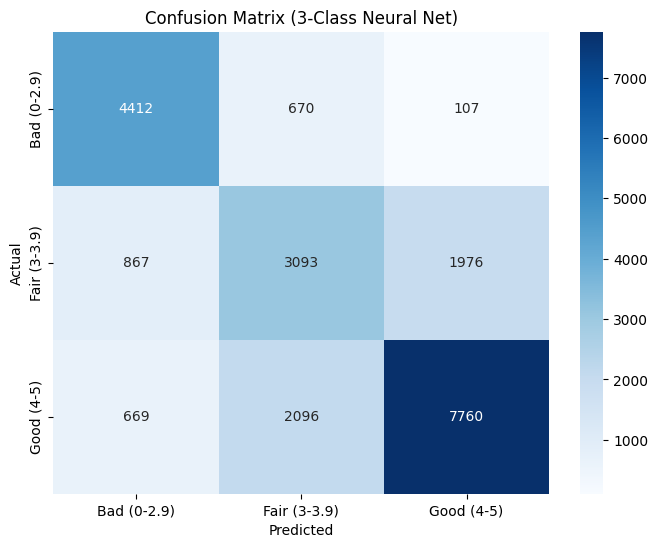

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.utils import resample

# TensorFlow / Keras Imports
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Input
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping

# ==========================================
# 1. LOAD & PROCESS DATA
# ==========================================
# (Assuming 'df', 'F_outband', and 'F_inband' are already loaded)

TARGET_MOS = 'QoE_ITU_046'
target_col = TARGET_MOS

# A. Clean Data: Remove failed sessions
df_clean = df[df[target_col] != -1].copy()
print(f"Data Cleaned. Rows: {len(df)} -> {len(df_clean)}")

features_final = F_outband + F_inband
X = df_clean[features_final]
y = df_clean[target_col]

# ==========================================
# 2. PREPARE TARGETS (3 Classes)
# ==========================================
# Define the Bins
bins = [-1, 2.9, 3.9, 5.0]  # Start at -1 to include 0
labels = [0, 1, 2]          # 0=Bad, 1=Fair, 2=Good
class_names = ['Bad (0-2.9)', 'Fair (3-3.9)', 'Good (4-5)']

# Create discrete target variable
y_classes = pd.cut(y, bins=bins, labels=labels, include_lowest=True).astype(int)

print("\nClass Counts before splitting:")
print(y_classes.value_counts().sort_index())

# ==========================================
# 3. SPLIT DATA
# ==========================================
# Split X and the INTEGER classes 'y_classes'
X_train_full, X_test, y_train_full, y_test_class = train_test_split(
    X, y_classes, test_size=0.2, random_state=42, stratify=y_classes
)

# Further split Train into Train/Val
X_train_raw, X_val, y_train_raw, y_val_class = train_test_split(
    X_train_full, y_train_full, test_size=0.2, random_state=42, stratify=y_train_full
)

# ==========================================
# 3.5. APPLY UNDERSAMPLING (Flatten the 3 Classes)
# ==========================================
print(f"\nOriginal Training Size: {len(X_train_raw)}")
print("Applying Undersampling to flatten the distribution...")

# Combine features and targets temporarily
train_data = pd.concat([X_train_raw, y_train_raw], axis=1)

# Logic: Find the size of the "Fair" class (Class 1) - likely the smallest
# and limit "Bad" and "Good" to match it.
# You can also set a fixed number if Fair is too small (e.g., min 3000)
count_fair = len(train_data[train_data[target_col] == 1])
target_count = count_fair

# Safety check: If Fair is extremely small, use a minimum floor
if target_count < 2000:
    print("Warning: Fair class is very small. Setting floor to 2000.")
    target_count = 2000

dfs = []
for i in [0, 1, 2]: # Loop through Bad, Fair, Good
    class_subset = train_data[train_data[target_col] == i]

    # If this class is bigger than target, downsample it
    if len(class_subset) > target_count:
        class_subset = resample(class_subset,
                                replace=False,
                                n_samples=target_count,
                                random_state=42)

    dfs.append(class_subset)

# Combine and Shuffle
df_balanced = pd.concat(dfs)
df_balanced = df_balanced.sample(frac=1, random_state=42).reset_index(drop=True)

# Separate X and y again
X_train = df_balanced[features_final]
y_train_class = df_balanced[target_col]

print(f"New Training Size after Undersampling: {len(X_train)}")
print("New Class Distribution:\n", y_train_class.value_counts().sort_index())

# ==========================================
# 3.6. CONVERT TO ONE-HOT ENCODING (3 Output Neurons)
# ==========================================
y_train_enc = to_categorical(y_train_class, num_classes=3)
y_val_enc   = to_categorical(y_val_class, num_classes=3)
y_test_enc  = to_categorical(y_test_class, num_classes=3)

# ==========================================
# 4. SCALE DATA
# ==========================================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled   = scaler.transform(X_val)
X_test_scaled  = scaler.transform(X_test)

# ==========================================
# 5. DEFINE MODEL (Updated for 3 Classes)
# ==========================================
def build_classification_model(input_shape):
    model = Sequential([
        Input(shape=input_shape),
        Dense(128, activation='relu'),
        Dropout(0.3),
        Dense(64, activation='relu'),
        Dropout(0.2),
        Dense(32, activation='relu'),
        # Output: 3 classes (Bad, Fair, Good)
        Dense(3, activation='softmax')
    ])
    model.compile(
        optimizer=Adam(learning_rate=0.001),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

model = build_classification_model((X_train_scaled.shape[1],))

# ==========================================
# 6. TRAIN MODEL
# ==========================================
early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

print("\nStarting Training...")
history = model.fit(
    X_train_scaled, y_train_enc,
    epochs=50,
    batch_size=32,
    validation_data=(X_val_scaled, y_val_enc),
    callbacks=[early_stop],
    verbose=1
)

# ==========================================
# 7. EVALUATE & VISUALIZE
# ==========================================
print("\n--- Evaluation ---")

# A. Get Probabilities
y_pred_probs = model.predict(X_test_scaled)
y_pred_classes = np.argmax(y_pred_probs, axis=1) # 0, 1, or 2

# B. Classification Report (Precision, Recall, F1)
print("\nClassification Report:")
print(classification_report(y_test_class, y_pred_classes, target_names=class_names))

# C. Confusion Matrix
plt.figure(figsize=(8, 6))
cm = confusion_matrix(y_test_class, y_pred_classes)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix (3-Class Neural Net)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


--- ROC & AUC Analysis ---
Overall Model AUC (Macro Average): 0.8669


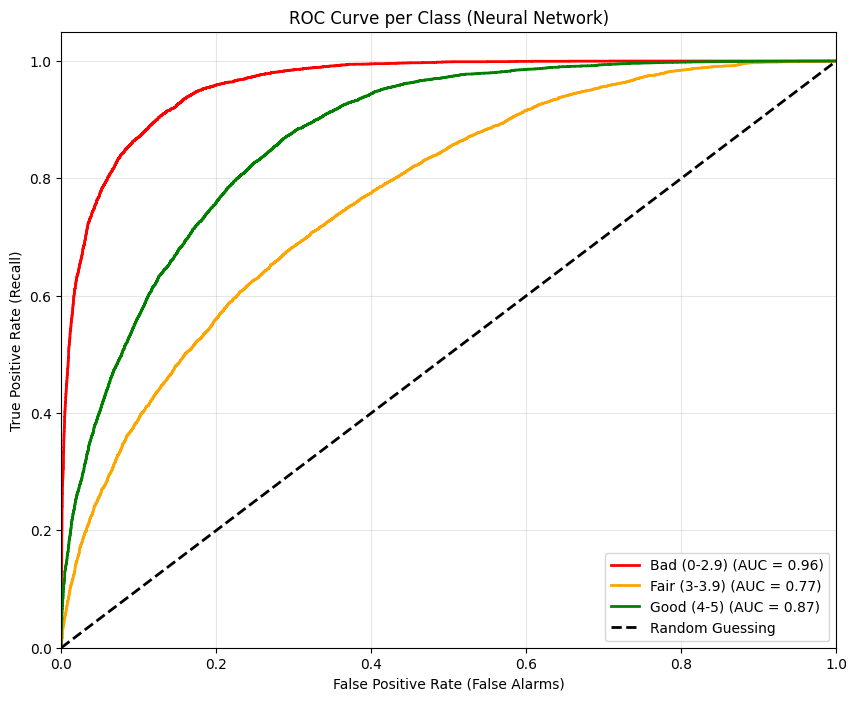

In [ ]:
from sklearn.metrics import roc_curve, auc, roc_auc_score
from itertools import cycle

# ==========================================
# 8. ROC & AUC ANALYSIS
# ==========================================
print("\n--- ROC & AUC Analysis ---")

# 1. Setup for One-vs-Rest ROC
n_classes = 3
# y_test_enc is already one-hot encoded (e.g., [0, 1, 0])
# y_pred_probs is the probability output from model.predict()

# 2. Calculate Overall Macro-Average AUC
# This gives you a single "score" for the whole model
macro_auc = roc_auc_score(y_test_enc, y_pred_probs, multi_class='ovr', average='macro')
print(f"Overall Model AUC (Macro Average): {macro_auc:.4f}")

# 3. Calculate ROC Curve for Each Class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    # Calculate False Positive Rate (fpr) and True Positive Rate (tpr)
    fpr[i], tpr[i], _ = roc_curve(y_test_enc[:, i], y_pred_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# 4. Plot the Curves
plt.figure(figsize=(10, 8))
colors = cycle(['red', 'orange', 'green']) # Red=Bad, Orange=Fair, Green=Good
class_labels = ['Bad (0-2.9)', 'Fair (3-3.9)', 'Good (4-5)']

for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'{class_labels[i]} (AUC = {roc_auc[i]:.2f})')

# Plot the "Random Guess" line (diagonal)
plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Guessing')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (False Alarms)')
plt.ylabel('True Positive Rate (Recall)')
plt.title('ROC Curve per Class (Neural Network)')
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()